In [234]:
from pyspark.sql import SparkSession, Window
import pyspark.sql.functions as F


spark = SparkSession.builder.getOrCreate()
coloc = spark.read.parquet(
    "gs://genetics-portal-dev-data/22.09.1/outputs/v2d_coloc"
).filter(F.col("right_type") != "gwas")

#### phenotypes matched to therapeutic areas
### load QTL tissues mapped to therapy areas
onto_samples = spark.read.csv(
    "hdfs:///mydata/updated/mappedSQLtissuesGTP3_5.csv", header=True
)
### take ontology of samples
samplesOnto = (
    onto_samples.withColumn(
        "right_bio_feature", F.split(F.col("original"), " - ").getItem(0)
    )
    .withColumn("therapyArea", F.split(F.col("curated_simplified"), " - ").getItem(2))
    .withColumn("EFO", F.split(F.col("curated_simplified"), " - ").getItem(1))
    .withColumn(
        "right_bio_feature2", F.split(F.col("curated_simplified"), " - ").getItem(0)
    )
    .drop("curated_simplified", "original", "curated", "_c3", "_c4")
)

evidences = spark.read.parquet(
    "gs://open-targets-data-releases/23.09/output/etl/parquet/evidence"
)
ot_genetics = spark.read.parquet(
    "gs://open-targets-data-releases/23.09/output/etl/parquet/evidence/sourceId=ot_genetics_portal"
)
### laod sample sizes - look at the document
sampleSize = spark.read.csv("gs://ot-team/jroldan/colocSampleSize.csv", header=True)

#### make format for left_locus and right locus in coloc
## assessment of beta
## join biosamples with the phenotype
### take nice name of tissues to make more homogeneous
coloc2 = (
    coloc.select(
        F.concat_ws("_", "left_chrom", "left_pos", "left_ref", "left_alt").alias(
            "left_locus_id"
        ),
        F.concat_ws("_", "right_chrom", "right_pos", "right_ref", "right_alt").alias(
            "right_locus_id"
        ),
        F.col("left_study").alias("left_study_id"),
        F.col("right_study").alias("right_study_id"),
        "right_gene_id",
        "coloc_h4",
        "left_var_right_study_beta",
        "right_phenotype",
        F.col("left_type"),
        F.col("right_type"),
        F.col("right_bio_feature"),
        F.col("is_flipped"),
    )
    .withColumn(
        "beta_assessed",
        F.when(F.col("left_var_right_study_beta") > 0, F.lit("gof"))
        .when(F.col("left_var_right_study_beta") < 0, F.lit("lof"))
        .otherwise(F.lit("neutral")),
    )
    .join(samplesOnto, on=["right_bio_feature"], how="left")
    .drop("right_bio_feature")
    .withColumnRenamed("right_bio_feature2", "right_bio_feature")
)
### check for disparities using count of different assessment for beta for target

disparities = coloc2.groupBy("left_locus_id", "left_study_id", "right_gene_id").agg(
    F.size(F.collect_set("beta_assessed")).alias("count"),
)
### add the label of which left_locus_id,left_study_id and right_gene_id are having contradictions

coloc3 = coloc2.join(
    disparities, on=["left_locus_id", "left_study_id", "right_gene_id"], how="left"
).persist()

### dataset for focusing only in disparities using studiId and
coloc4 = (
    coloc3.filter(F.col("count") > 1)
    .groupBy("left_locus_id", "left_study_id", "right_gene_id")
    .agg(
        F.size(F.collect_set("right_study_id")),
        F.size(F.collect_set("right_bio_feature")),
    )
)

#### run direction of effect over evidences:
### 31.07.2023
### cleaned on 15.08.2023

#### RELEASE 23.09 changed on 22 sep 2023


## https://stackoverflow.com/questions/45629781/drop-if-all-entries-in-a-spark-dataframes-specific-column-is-null
## drop columns with all values = Null


def drop_fully_null_columns(df, but_keep_these=[]):
    """Drops DataFrame columns that are fully null
    (i.e. the maximum value is null)

    Arguments:
        df {spark DataFrame} -- spark dataframe
        but_keep_these {list} -- list of columns to keep without checking for nulls

    Returns:
        spark DataFrame -- dataframe with fully null columns removed
    """

    # skip checking some columns
    cols_to_check = [col for col in df.columns if col not in but_keep_these]
    if len(cols_to_check) > 0:
        # drop columns for which the max is None
        rows_with_data = (
            df.select(*cols_to_check)
            .groupby()
            .agg(*[F.max(c).alias(c) for c in cols_to_check])
            .take(1)[0]
        )
        cols_to_drop = [
            c for c, const in rows_with_data.asDict().items() if const == None
        ]
        new_df = df.drop(*cols_to_drop)

        return new_df
    else:
        return df


# 1# Make a list of variant of interest (Sequence ontology terms) to subset data of interest.

### Bear in mind that SO works with ontology structure as: SO:XXXXXX, but databases has the SO as: SO_XXXXXX

var_filter_lof = [
    ### High impact variants https://www.ensembl.org/info/genome/variation/prediction/predicted_data.html
    "SO_0001589",  ## frameshit_variant
    "SO_0001587",  ## stop_gained
    "SO_0001574",  ## splice_acceptor_variant
    "SO_0001575",  ## splice_donor_variant
    "SO_0002012",  ## start_lost
    "SO_0001578",  ## stop_lost
    "SO_0001893",  ## transcript_ablation
    # "SO:0001889", ## transcript_amplification ## the Only HIGH impact that increase protein.
]

gof = ["SO_0002053"]
lof = ["SO_0002054"]


## Building Sequence Ontology
so_path = "gs://ot-team/jroldan/sequenceOntology_20221118.csv"
so_ontology = spark.read.csv(so_path, header=True)
building = (
    so_ontology.select(F.col("Accession"), F.col("Parents"))
    .withColumn("Parentalind", F.split(F.col("Parents"), ","))
    .withColumn("Parentalind", F.explode_outer("Parentalind"))
    .groupBy("Parentalind")
    .agg(F.collect_list(F.col("Accession")).alias("childrens"))
    .join(so_ontology, F.col("Parentalind") == so_ontology.Accession, "right")
)

## others
target_path = "gs://open-targets-data-releases/23.09/output/etl/parquet/targets/"
target = spark.read.parquet(target_path)
disease_path = "gs://open-targets-data-releases/23.09/output/etl/parquet/diseases/"
diseases = spark.read.parquet(disease_path)
dis_name = diseases.select("id", "name")
indication_path = "gs://open-targets-data-releases/23.09/output/etl/parquet/indication/"
indication = spark.read.parquet(indication_path)
mecact_path = (
    "gs://open-targets-data-releases/23.09/output/etl/parquet/mechanismOfAction/"
)
mecact = spark.read.parquet(mecact_path)

#### GENE BURDEN

### We manually annotated those studies using LoF or PTV variants

burden_lof_path = "gs://ot-team/jroldan/20230704_geneBurden_StudyInclusion.csv"
burden_lof = spark.read.csv(burden_lof_path, header=True)
burden_lof = burden_lof.withColumnRenamed("statisticalMethodOverview", "stMethod")

## annotate TSG/oncogene/bivalent using 'hallmarks.attributes'

oncotsg_list = [
    "TSG",
    "oncogene",
    "Oncogene",
    "oncogene",
    "oncogene,TSG",
    "TSG,oncogene",
    "fusion,oncogene",
    "oncogene,fusion",
]

oncolabel = (
    target.select(
        "id", "approvedSymbol", F.explode_outer(F.col("hallmarks.attributes"))
    )
    .select("id", "approvedSymbol", "col.description")
    .filter(F.col("description").isin(oncotsg_list))
    .groupBy("id", "approvedSymbol")
    .agg(F.collect_set("description").alias("description"))
    .withColumn("description_splited", F.concat_ws(",", F.col("description")))
    .withColumn(
        "TSorOncogene",
        F.when(
            (
                F.col("description_splited").rlike("ncogene")
                & F.col("description_splited").rlike("TSG")
            ),
            F.lit("bivalent"),
        )
        .when(F.col("description_splited").rlike("ncogene(\s|$)"), F.lit("oncogene"))
        .when(F.col("description_splited").rlike("TSG(\s|$)"), F.lit("TSG"))
        .otherwise(F.lit("noEvaluable")),
    )
    .withColumnRenamed("id", "target_id")
)

#### rlike('('+Keywords+')(\s|$)'

### on 03.07.2023 we add the categories:
# DISRUPTING AGENT - inhibitor
# STABILISER - activator

### Hacer el join del actionType con el chembl para sacar los mecanismos de accion.
inhibitors = [
    "RNAI INHIBITOR",
    "NEGATIVE MODULATOR",
    "NEGATIVE ALLOSTERIC MODULATOR",
    "ANTAGONIST",
    "ANTISENSE INHIBITOR",
    "BLOCKER",
    "INHIBITOR",
    "DEGRADER",
    "INVERSE AGONIST",
    "ALLOSTERIC ANTAGONIST",
    "DISRUPTING AGENT",  ## added new on 03.07.2023
]

activators = [
    "PARTIAL AGONIST",
    "ACTIVATOR",
    "POSITIVE ALLOSTERIC MODULATOR",
    "POSITIVE MODULATOR",
    "AGONIST",
    "SEQUESTERING AGENT",
    "STABILISER",  ## added new on 03.07.2023
]

columnas = ["activator", "inhibitor"]
both = activators + inhibitors

actiontype2 = (
    mecact.select("chemblIds", "actionType", "mechanismOfAction", "targets")
    .select(
        F.explode_outer("chemblIds").alias("drugId2"),
        "actionType",
        "mechanismOfAction",
        "targets",
    )
    .select(
        F.explode_outer("targets").alias("targetId2"),
        "drugId2",
        "actionType",
        "mechanismOfAction",
    )
    .dropDuplicates()
)

chembl = evidences.filter(F.col("datasourceId") == "chembl")
chembl1 = chembl.select(
    "targetId", "drugId", "diseaseId", "clinicalPhase", "diseaseFromSourceId"
)
chembl2 = (
    chembl1.join(
        actiontype2,
        (actiontype2.drugId2 == F.col("drugId"))
        & (actiontype2.targetId2 == F.col("targetId")),
        "left",
    ).drop("targetId2", "drugId2")
    ###.dropDuplicates()
    .withColumn(
        "twoCategories_new",
        F.when(F.col("actionType").isin(inhibitors), F.lit("inhibitor"))
        .when(F.col("actionType").isin(activators), F.lit("activator"))
        .otherwise(F.lit("noEvaluable")),
    )
)

chembl3 = (
    chembl2.filter(F.col("twoCategories_new") != "noEvaluable")
    .groupBy("targetId", "diseaseId")
    .pivot("twoCategories_new")
    .agg(F.count("targetId"))
)

chembl4 = chembl3.select(
    "targetId",
    "diseaseId",
    ##'clinicalPhase',
    *(F.col(c).cast("int").alias(c) for c in columnas)
).withColumn(
    "coherency",
    F.when(
        ((F.col("activator").isNotNull()) & (F.col("inhibitor").isNotNull())),
        F.when(
            (F.col("activator")) - (F.col("inhibitor")) != (F.col("activator")),
            F.lit("dispar"),
        ),
    ),
)

# Define a conditional column to represent the subset where datasourceId is "intogen"
condition_col = F.when(F.col("datasourceId") == "intogen", 1).otherwise(0)
# Define the Window specification partitioned by "targetId" and "diseaseId" and ordered by the condition column
window_spec = Window.partitionBy("targetId", "diseaseId").orderBy(condition_col.desc())

### Join all datasets

# dfs=[otgenetics,gene_burden,eva_germline,eva_somatic,g2p,orphanet,cgc,intogen,impc,chembl]


# all = dfs[0]
# for df in dfs[1:]:
#    all = all.unionByName(df, allowMissingColumns=True)
# all.count()

all = evidences.filter(
    F.col("datasourceId").isin(
        [
            "ot_genetics_portal",
            "gene_burden",
            "eva",
            "eva_somatic",
            "gene2phenotype",
            "orphanet",
            "cancer_gene_census",
            "intogen",
            "impc",
            "chembl",
        ]
    )
)

#### 20230203 ###
prueba_assessment = (
    all.withColumn(
        "beta", F.col("beta").cast("float")
    )  ## for ot genetics & gene burden
    .withColumn(
        "OddsRatio", F.col("OddsRatio").cast("float")
    )  ## for ot genetics & gene burden
    .withColumn(
        "clinicalSignificances", F.concat_ws(",", F.col("clinicalSignificances"))
    )  ### for eva
    .withColumn(
        "mutatedSamplesVariantInfo",
        F.coalesce(F.col("mutatedSamples.functionalConsequenceId"), F.array()),
    )  ### for intogen
    # Define a conditional column to represent the subset where datasourceId is "intogen"
    .withColumn("nullColumn", F.array(F.lit(None)))
    .withColumn(
        "intogenAnnot",
        # F.when(F.col("datasourceId")=="intogen",
        F.size(
            F.flatten(
                F.collect_set(
                    F.array_except(
                        F.col("mutatedSamples.functionalConsequenceId"),
                        F.col("nullColumn"),
                    )
                ).over(window_spec)
            )
        ),
    )
    .join(oncolabel, oncolabel.target_id == F.col("targetId"), "left")  ### para cgc
    .join(
        burden_lof, burden_lof.stMethod == F.col("statisticalMethodOverview"), "left"
    )  ### para gene burden
    .join(
        actiontype2,  ## para chembl
        (actiontype2.drugId2 == F.col("drugId"))
        & (actiontype2.targetId2 == F.col("targetId")),
        "left",
    )
    .withColumn(
        "Assessment",
        #### Ot_genetics Portal ### updated to include the coloc+gwas analysis
        F.when(
            F.col("datasourceId") == "ot_genetics_portal",
            # F.when(  ### label 14 evidences that are contradictory
            #        (
            #        (F.col('variantFunctionalConsequenceFromQtlId')=='SO_0002315') &
            #        (F.col('variantFunctionalConsequenceId').isin(var_filter_lof))
            #        )
            #        ,
            #        F.lit('dispar'))
            ### evidences with gwas+coloc increased expression without + var_lof
            F.when(
                (
                    (F.col("beta").isNull())
                    & (F.col("variantFunctionalConsequenceFromQtlId") == "SO_0002315")
                    & (
                        F.col("variantFunctionalConsequenceId").isin(var_filter_lof)
                        == False
                    )
                ),
                F.when((F.col("OddsRatio") > 1), F.lit("GoF_risk")).when(
                    (F.col("OddsRatio") < 1), F.lit("GoF_protect")
                ),
            ).when(
                (
                    (F.col("oddsRatio").isNull())
                    & (F.col("variantFunctionalConsequenceFromQtlId") == "SO_0002315")
                    & (
                        F.col("variantFunctionalConsequenceId").isin(var_filter_lof)
                        == False
                    )
                ),
                F.when((F.col("beta") < 0), F.lit("GoF_protect")).when(
                    (F.col("beta") > 0), F.lit("GoF_risk")
                ),
            )
            ### evidences with coherent Gwas-coloc + var_lof
            .when(
                (
                    (F.col("beta").isNull())
                    & (F.col("variantFunctionalConsequenceFromQtlId") == "SO_0002316")
                    & (F.col("variantFunctionalConsequenceId").isin(var_filter_lof))
                ),
                F.when((F.col("OddsRatio") > 1), F.lit("LoF_risk")).when(
                    (F.col("OddsRatio") < 1), F.lit("LoF_protect")
                ),
            ).when(
                (
                    (F.col("oddsRatio").isNull())
                    & (F.col("variantFunctionalConsequenceFromQtlId") == "SO_0002316")
                    & (F.col("variantFunctionalConsequenceId").isin(var_filter_lof))
                ),
                F.when((F.col("beta") < 0), F.lit("LoF_protect")).when(
                    (F.col("beta") > 0), F.lit("LoF_risk")
                ),
            )
            ### evidences with colo+Gwas data but not variants
            .when(
                (
                    (F.col("beta").isNull())
                    & (F.col("variantFunctionalConsequenceFromQtlId") == "SO_0002316")
                    & (
                        F.col("variantFunctionalConsequenceId").isin(var_filter_lof)
                        == False
                    )
                ),
                F.when((F.col("OddsRatio") > 1), F.lit("LoF_risk")).when(
                    (F.col("OddsRatio") < 1), F.lit("LoF_protect")
                ),
            ).when(
                (
                    (F.col("oddsRatio").isNull())
                    & (F.col("variantFunctionalConsequenceFromQtlId") == "SO_0002316")
                    & (
                        F.col("variantFunctionalConsequenceId").isin(var_filter_lof)
                        == False
                    )
                ),
                F.when((F.col("beta") < 0), F.lit("LoF_protect")).when(
                    (F.col("beta") > 0), F.lit("LoF_risk")
                ),
            )
            ### evidences with coherent non/inconclusive gwas+coloc + var_lof
            .when(
                (
                    (F.col("beta").isNull())
                    & (
                        (F.col("variantFunctionalConsequenceFromQtlId") == "SO_0002314")
                        | (F.col("variantFunctionalConsequenceFromQtlId").isNull())
                    )
                    & (F.col("variantFunctionalConsequenceId").isin(var_filter_lof))
                ),
                F.when((F.col("OddsRatio") > 1), F.lit("LoF_risk")).when(
                    (F.col("OddsRatio") < 1), F.lit("LoF_protect")
                ),
            )
            .when(
                (
                    (F.col("oddsRatio").isNull())
                    & (
                        (F.col("variantFunctionalConsequenceFromQtlId") == "SO_0002314")
                        | (F.col("variantFunctionalConsequenceFromQtlId").isNull())
                    )
                    & (F.col("variantFunctionalConsequenceId").isin(var_filter_lof))
                ),
                F.when((F.col("beta") < 0), F.lit("LoF_protect")).when(
                    (F.col("beta") > 0), F.lit("LoF_risk")
                ),
            )
            .otherwise(F.lit("noEvaluable")),
        )  ### son tambien no data las que tiene riesgo pero no tienen LoF
        #### Gene burden
        .when(
            F.col("datasourceId") == "gene_burden",
            ### .filter(F.col('variantType').isin(var_filter))
            F.when(
                (
                    (F.col("whatToDo") == "get")
                    & (F.col("beta").isNull())
                    & (F.col("OddsRatio") > 1)
                ),
                F.lit("LoF_risk"),
            )
            .when(
                (
                    (F.col("whatToDo") == "get")
                    & (F.col("beta").isNull())
                    & (F.col("OddsRatio") < 1)
                ),
                F.lit("LoF_protect"),
            )
            .when(
                (
                    (F.col("whatToDo") == "get")
                    & (F.col("OddsRatio").isNull())
                    & (F.col("beta") > 0)
                ),
                F.lit("LoF_risk"),
            )
            .when(
                (
                    (F.col("whatToDo") == "get")
                    & (F.col("OddsRatio").isNull())
                    & (F.col("beta") < 0)
                ),
                F.lit("LoF_protect"),
            )
            .otherwise(
                F.lit("noEvaluable")
            ),  ### son tambien no data las que tiene riesgo pero no se ensayan LoF o PT
        )
        #### Eva_germline
        .when(
            F.col("datasourceId") == "eva",
            F.when(
                (
                    ## (F.col('clinicalSignificances')!='likely pathogenic') &
                    (F.col("variantFunctionalConsequenceId").isin(var_filter_lof))
                    & F.col("clinicalSignificances").rlike("(pathogenic)$")
                ),
                F.lit("LoF_risk"),
            )
            .when(
                (
                    F.col("clinicalSignificances").contains("protective")
                    & F.col("variantFunctionalConsequenceId").isin(var_filter_lof)
                ),
                F.lit("LoF_protect"),
            )
            .otherwise(
                F.lit("noEvaluable")
            ),  ### Son todas aquellas que tenen info pero no son patogenicas/protective  + LoF
        )
        #### Eva_somatic
        .when(
            F.col("datasourceId") == "eva_somatic",
            F.when(
                (
                    ##(F.col('clinicalSignificances')!='likely pathogenic') &
                    (F.col("variantFunctionalConsequenceId").isin(var_filter_lof))
                    & F.col("clinicalSignificances").rlike("(pathogenic)$")
                ),
                F.lit("LoF_risk"),
            )
            .when(
                (
                    F.col("clinicalSignificances").contains("protective")
                    & F.col("variantFunctionalConsequenceId").isin(var_filter_lof)
                ),
                F.lit("LoF_protect"),
            )
            .otherwise(
                F.lit("noEvaluable")
            ),  ### Son todas aquellas que tenen info pero no son patogenicas/protective  + LoF
        )
        #### G2P
        .when(
            F.col("datasourceId") == "gene2phenotype",
            F.when(
                F.col("variantFunctionalConsequenceId") == "SO_0002317",
                F.lit("LoF_risk"),
            )  ### absent gene product
            .when(
                F.col("variantFunctionalConsequenceId") == "SO_0002315",
                F.lit("GoF_risk"),
            )  ### increased gene product level
            .otherwise(F.lit("noEvaluable")),
        )
        #### Orphanet
        .when(
            F.col("datasourceId") == "orphanet",
            F.when(
                F.col("variantFunctionalConsequenceId") == "SO_0002054",
                F.lit("LoF_risk"),
            )  ### Loss_of_Function Variant
            .when(
                F.col("variantFunctionalConsequenceId") == "SO_0002053",
                F.lit("GoF_risk"),
            )  ### Gain_of_Function Variant
            .otherwise(F.lit("noEvaluable")),
        )
        #### CGC
        .when(
            F.col("datasourceId") == "cancer_gene_census",
            F.when(F.col("TSorOncogene") == "oncogene", F.lit("GoF_risk"))
            .when(F.col("TSorOncogene") == "TSG", F.lit("LoF_risk"))
            .when(F.col("TSorOncogene") == "bivalent", F.lit("bivalent_risk")),
        )  #### Aqui asumimos que todo lo que esta incluido da riesgo, pero solo podemos dar LoF porque ya no tienen dato de TSG/oncogen
        #### intogen
        .when(
            F.col("datasourceId") == "intogen",
            F.when(
                F.col("intogenAnnot")
                == 1,  ## oncogene/tummor suppressor for a given trait
                F.when(
                    F.arrays_overlap(
                        F.array_union(
                            F.col("mutatedSamples.functionalConsequenceId"), F.array()
                        ),
                        F.array([F.lit(i) for i in (gof)]),
                    ),
                    F.lit("GoF_risk"),
                ).when(
                    F.arrays_overlap(
                        F.array_union(
                            F.col("mutatedSamples.functionalConsequenceId"), F.array()
                        ),
                        F.array([F.lit(i) for i in (lof)]),
                    ),
                    F.lit("LoF_risk"),
                ),
            )
            .when(
                F.col("intogenAnnot") > 1, F.lit("bivalentIntogen")
            )  ##oncogene & tumor suppressor for a given trait
            .otherwise(F.lit("noEvaluable")),
        )
        #### impc
        .when(
            F.col("datasourceId") == "impc",
            F.when(F.col("diseaseId").isNotNull(), F.lit("KO_risk")).otherwise(
                F.lit("noEvaluable")
            ),
        )
        ### chembl
        .when(
            F.col("datasourceId") == "chembl",
            F.when(F.col("actionType").isin(inhibitors), F.lit("LoF_protect"))
            .when(F.col("actionType").isin(activators), F.lit("GoF_protect"))
            .otherwise(F.lit("noEvaluable")),
        ),
    )
    ### Homogenize to count all together
    .withColumn(
        "homogenized",
        F.when(F.col("Assessment") == "KO_risk", F.lit("LoF_risk"))
        .when(F.col("Assessment") == "bivalentIntogen", F.lit("bivalent_risk"))
        .otherwise(F.col("Assessment")),
    )
    .withColumn(
        "tendency",
        F.when(F.col("homogenized").contains("risk"), F.lit("Risk"))
        .when(F.col("homogenized").contains("protect"), F.lit("Protect"))
        .otherwise(F.lit("noEvaluable")),
    )
    .withColumn(
        "variation",
        F.when(F.col("homogenized").contains("LoF"), F.lit("LoF"))
        .when(F.col("homogenized").contains("GoF"), F.lit("GoF"))
        .otherwise(F.lit("noEvaluable")),
    )
).persist()

#### load data from ot genetics with the assessments
evidence_ot_genetics = (
    prueba_assessment.filter((F.col("datasourceId").isin(["ot_genetics_portal"])))
    .groupBy("targetId", "diseaseId", "variantId", "studyId", "tendency")
    .count()
    .persist()
)  #### no need to pivot the data because all are coherent

# 1## join colo3 with their data from ot genetivcs to know the diseases
coloc_otgene = (
    coloc3.withColumnRenamed("left_study_id", "studyId")
    .withColumnRenamed("left_locus_id", "locusId")
    .withColumnRenamed("right_gene_id", "targetId")
    .join(
        evidence_ot_genetics.withColumnRenamed("variantId", "locusId"),
        on=["studyId", "locusId", "targetId"],
        how="left",
    )
    .withColumnRenamed("GoF_protect", "GoF_protectOT")
    .withColumnRenamed("GoF_risk", "GoF_riskOT")
    .withColumnRenamed("LoF_protect", "LoF_protectOT")
    .withColumnRenamed("LoF_risk", "LoF_riskOT")
).persist()
# 3## join with therapy areas from disaeses to comapre with the ones with the tissues/samples
chembl_trials = (
    prueba_assessment.filter((F.col("datasourceId").isin(["chembl"])))
    .groupBy("targetId", "diseaseId")
    .agg(F.max(F.col("clinicalPhase")).alias("maxClinPhase"))
)

# 2## join that datasets with either chembl and gene burden to see how is the direction of effect
chembl = (
    (
        prueba_assessment.filter(
            (F.col("datasourceId").isin(["chembl"]))
            & (F.col("homogenized").isin(["noEvaluable", "dispar"]) == False)
        )
    )
    .groupBy("targetId", "diseaseId")
    .pivot("homogenized")
    .count()
    .withColumnRenamed("LoF_protect", "LoF_protectCh")
    .withColumnRenamed("GoF_protect", "GoF_protectCh")
    .join(chembl_trials, on=["targetId", "diseaseId"], how="left")
    .persist()
)
gene_burden = (
    (
        prueba_assessment.filter(
            (F.col("datasourceId").isin(["gene_burden"]))
            & (F.col("homogenized").isin(["noEvaluable", "dispar"]) == False)
        )
    )
    .groupBy("targetId", "diseaseId")
    .pivot("homogenized")
    .count()
    .withColumnRenamed("LoF_protect", "LoF_protectBN")
    .withColumnRenamed("LoF_risk", "LoF_riskBN")
    .drop("count")
    .persist()
)
coloc_bnch = coloc_otgene.join(
    gene_burden, on=["targetId", "diseaseId"], how="left"
).join(chembl, on=["targetId", "diseaseId"], how="left")
### join sample size
coloc_bnch2 = coloc_bnch.join(
    sampleSize.select("right_study_id", "sampleSize"), on="right_study_id", how="left"
).persist()

##1## are they coherent between studies? there are diferent study GWAS con una misma locusId o variante que
# tienen un diferente "left_var_right_study_beta"

two_assessments = (
    coloc_bnch2.filter(
        F.col("GoF_protectCh").isNotNull() | F.col("LoF_protectCh").isNotNull()
    )
    .groupBy(
        "right_study_id",
        "targetId",
        "diseaseId",
        "right_locus_id",
        "right_type",
        "right_bio_feature",
    )
    .agg(
        F.collect_set("beta_assessed").alias("dif_assess"),
        F.collect_set("locusId"),
        F.size(F.collect_set("beta_assessed").alias("dif_assess")),
        F.size(F.collect_set("locusId")),
    )
    .withColumn("nr_difAss", F.size("dif_assess"))
    # .withColumn("nr_difTargets", F.size("Nr_targets"))
).persist()

23/09/29 16:04:59 WARN CacheManager: Asked to cache already cached data.
23/09/29 16:06:26 WARN CacheManager: Asked to cache already cached data.        
23/09/29 16:06:26 WARN CacheManager: Asked to cache already cached data.
23/09/29 16:06:26 WARN CacheManager: Asked to cache already cached data.
23/09/29 16:06:27 WARN CacheManager: Asked to cache already cached data.
23/09/29 16:06:27 WARN CacheManager: Asked to cache already cached data.
23/09/29 16:06:27 WARN CacheManager: Asked to cache already cached data.
23/09/29 16:06:28 WARN CacheManager: Asked to cache already cached data.


In [240]:
coloc_bnch2.drop("count")

DataFrame[right_study_id: string, targetId: string, diseaseId: string, studyId: string, locusId: string, right_locus_id: string, coloc_h4: double, left_var_right_study_beta: double, right_phenotype: string, left_type: string, right_type: string, is_flipped: boolean, beta_assessed: string, therapyArea: string, EFO: string, right_bio_feature: string, tendency: string, LoF_protectBN: bigint, LoF_riskBN: bigint, GoF_protectCh: bigint, LoF_protectCh: bigint, maxClinPhase: double, sampleSize: string]

In [241]:
coloc_bnch2.drop("count").filter(
    F.col("GoF_protectCh").isNotNull() | F.col("LoF_protectCh").isNotNull()
).write.parquet("gs://ot-team/jroldan/coloc_analysis.parquet")

In [39]:
two_assessments = (
    coloc_bnch2.filter(
        F.col("GoF_protectCh").isNotNull() | F.col("LoF_protectCh").isNotNull()
    )
    .groupBy(
        "right_study_id",
        "targetId",
        "diseaseId",
        "right_locus_id",
        "right_type",
        "right_bio_feature",
    )
    .agg(
        F.collect_set("beta_assessed").alias("dif_assess"),
        F.collect_set("locusId").alias("difLocusId"),
        F.collect_set("studyId").alias("difStudyId"),
        F.size(F.collect_set("beta_assessed")).alias("N_dif_assess"),
        F.size(F.collect_set("locusId")).alias("N_locusID"),
        F.size(F.collect_set("studyId")).alias("difStudyId"),
    )
).persist()

In [42]:
two_assessments.sort(F.col("N_dif_assess").desc()).filter(
    F.col("N_dif_assess") > 1
).count()

217

In [229]:
coloc_bnch2.count()

4183585

In [72]:
coloc_bnch2.filter(
    F.col("GoF_protectCh").isNotNull() | F.col("LoF_protectCh").isNotNull()
).toPandas().to_csv("gs://ot-team/jroldan/coloc_chemblEvidence.csv")

#### see nr of agreeents with chembl "locusId,StudyId,targetId"

In [24]:
uniqueFirst = (
    coloc_bnch2.filter(
        F.col("GoF_protectCh").isNotNull() | F.col("LoF_protectCh").isNotNull()
    )
    .filter(F.col("beta_assessed") != "neutral")
    .groupBy(
        # "right_study_id",
        "targetId",
        # "diseaseId",
        "studyId",
        "locusId",
        # "right_locus_id",
        # "right_type",
        # "right_bio_feature",
        # "right_phenotype",
    )
    .agg(
        F.collect_set("beta_assessed").alias("dif_assess"),
        F.collect_set("locusId").alias("difLocusId"),
        F.collect_set("studyId").alias("difStudyId"),
        F.size(F.collect_set("beta_assessed")).alias("N_dif_assess"),
        F.size(F.collect_set("locusId")).alias("N_locusID"),
        F.size(F.collect_set("studyId")).alias("difStudyId"),
    )
    .filter(F.col("N_dif_assess") == 1)
    .withColumn("idx", F.monotonically_increasing_id())
).persist()

In [31]:
uniqueFirst.show(330)

+---------------+--------------------+--------------------+----------+--------------------+--------------------+------------+---------+----------+-------------+
|       targetId|             studyId|             locusId|dif_assess|          difLocusId|          difStudyId|N_dif_assess|N_locusID|difStudyId|          idx|
+---------------+--------------------+--------------------+----------+--------------------+--------------------+------------+---------+----------+-------------+
|ENSG00000186642|FINNGEN_R6_KELA_D...|     11_72752390_G_A|     [lof]|   [11_72752390_G_A]|[FINNGEN_R6_KELA_...|           1|        1|         1|            0|
|ENSG00000137033|FINNGEN_R6_ASTHMA...|       9_6192796_T_C|     [gof]|     [9_6192796_T_C]|[FINNGEN_R6_ASTHM...|           1|        1|         1|   8589934592|
|ENSG00000132855|        SAIGE_272_11|      1_62582606_A_C|     [lof]|    [1_62582606_A_C]|      [SAIGE_272_11]|           1|        1|         1|  17179869184|
|ENSG00000120659|        GCST90038

In [35]:
coloc_bnch3First.groupBy("targetId", "locusId", "studyId").count().count()

330

In [67]:
# 330

### make the benchmarking with ChEMBL - Compare GoF/LoF.

coloc_bnch3First = (
    (
        coloc_bnch2.join(
            uniqueFirst,
            on=[
                "targetId",
                "locusId",
                "studyId",
            ],
            how="right",
        )
        .withColumn(
            "Coherency",
            F.when(
                F.col("beta_assessed") == "gof",
                F.when(F.col("GoF_protectCh").isNotNull(), F.lit("coherent")).when(
                    F.col("LoF_protectCh").isNotNull(), F.lit("incoherent")
                ),
            ).when(
                F.col("beta_assessed") == "lof",
                F.when(F.col("GoF_protectCh").isNotNull(), F.lit("incoherent")).when(
                    F.col("LoF_protectCh").isNotNull(), F.lit("coherent")
                ),
            ),
        )
        .withColumn(
            "ChEMBL",
            F.when(
                (F.col("GoF_protectCh").isNotNull())
                & (F.col("LoF_protectCh").isNotNull()),
                F.lit(F.concat_ws("_", F.lit("gof&lof"))),
            )
            .when(
                (F.col("LoF_protectCh").isNotNull())
                & (F.col("GoF_protectCh").isNull()),
                F.lit(F.lit("lof")),
            )
            .when(
                (F.col("GoF_protectCh").isNotNull())
                & (F.col("LoF_protectCh").isNull()),
                F.lit(F.lit("gof")),
            ),
        )
    ).filter((F.col("ChEMBL") != "gof&lof") & (F.col("beta_assessed") != "neutral"))
).persist()

#### agrupar sin hacer nada
plotear = (
    coloc_bnch3First.groupBy("ChEMBL", "maxClinPhase")
    .pivot("beta_assessed")
    .agg(F.countDistinct("idx"))
    .sort(F.col("maxClinPhase").asc(), F.col("ChEMBL").desc())
    .withColumn("chemblPhase", F.concat_ws("_", F.col("ChEMBL"), F.col("maxClinPhase")))
    .withColumn(
        "ratio",
        F.when(
            F.col("ChEMBL") == "gof",
            (F.col("gof") / (F.col("gof") + F.col("lof"))) * 100,
        ).when(
            F.col("ChEMBL") == "lof",
            (F.col("lof") / (F.col("gof") + F.col("lof"))) * 100,
        ),
    )
    .withColumn("sampleSize", F.col("gof") + F.col("lof"))
    .withColumnRenamed("gof", "gof_qtl")
    .withColumnRenamed("lof", "lof_qtl")
)

In [68]:
plotear.show()

+------+------------+-------+-------+-----------+------------------+----------+
|ChEMBL|maxClinPhase|gof_qtl|lof_qtl|chemblPhase|             ratio|sampleSize|
+------+------------+-------+-------+-----------+------------------+----------+
|   lof|         1.0|     12|      7|    lof_1.0| 36.84210526315789|        19|
|   lof|         2.0|     51|     32|    lof_2.0| 38.55421686746988|        83|
|   gof|         2.0|      3|      7|    gof_2.0|              30.0|        10|
|   lof|         3.0|     13|     19|    lof_3.0|            59.375|        32|
|   gof|         3.0|      4|     13|    gof_3.0| 23.52941176470588|        17|
|   lof|         4.0|     49|     83|    lof_4.0|62.878787878787875|       132|
|   gof|         4.0|      8|     12|    gof_4.0|              40.0|        20|
+------+------------+-------+-------+-----------+------------------+----------+



In [50]:
import seaborn as sns
import pandas as pd

In [41]:
import matplotlib.pyplot as plt

In [69]:
### empty row for the next dataframe pandas
s = pd.Series(
    ["gof", 1.0, 0, 0, 0, "gof_1.0", 0, 0],
    index=[
        "ChEMBL",
        "maxClinPhase",
        "gof_qtl",
        "lof_qtl",
        "neutral",
        "chemblPhase",
        "ratio",
        "sampleSize",
    ],
)

/tmp/ipykernel_70909/209870227.py:5: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  (


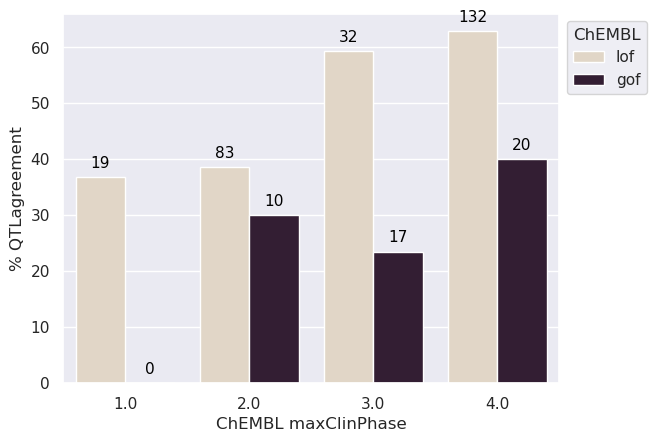

In [115]:
#### starting point plot


df1 = (
    (
        plotear.na.fill(0)
        # .sort(F.col("ChEMBL").desc(), F.col("maxClinPhase").asc())
        .toPandas()
    )
    .append(s, ignore_index=True)
    .sort_values(["ChEMBL", "maxClinPhase"], ascending=[False, True])
)

fig = sns.barplot(
    y="ratio",
    x="maxClinPhase",
    data=df1,
    hue="ChEMBL",
    palette="ch:.25",
)
fig.set(xlabel="ChEMBL maxClinPhase", ylabel="% QTLagreement")

ax = plt.gca()
df = df1

listado = ["19", "83", "32", "132", "0", "10", "17", "20"]
for i, p in enumerate(ax.patches):
    x = p.get_x() + p.get_width() / 2.0
    y = p.get_height()

    annotation_value = listado[i]  # Replace with the actual column name
    ax.annotate(
        str(annotation_value),
        (x, y),
        ha="center",
        va="center",
        fontsize=11,
        color="black",
        xytext=(0, 10),
        textcoords="offset points",
    )

sns.move_legend(fig, "upper left", bbox_to_anchor=(1, 1))

plt.show()

In [116]:
coloc_bnch2.printSchema()

root
 |-- right_study_id: string (nullable = true)
 |-- targetId: string (nullable = true)
 |-- diseaseId: string (nullable = true)
 |-- studyId: string (nullable = true)
 |-- locusId: string (nullable = false)
 |-- right_locus_id: string (nullable = false)
 |-- coloc_h4: double (nullable = true)
 |-- left_var_right_study_beta: double (nullable = true)
 |-- right_phenotype: string (nullable = true)
 |-- left_type: string (nullable = true)
 |-- right_type: string (nullable = true)
 |-- is_flipped: boolean (nullable = true)
 |-- beta_assessed: string (nullable = false)
 |-- therapyArea: string (nullable = true)
 |-- EFO: string (nullable = true)
 |-- right_bio_feature: string (nullable = true)
 |-- count: integer (nullable = true)
 |-- tendency: string (nullable = true)
 |-- count: long (nullable = true)
 |-- LoF_protectBN: long (nullable = true)
 |-- LoF_riskBN: long (nullable = true)
 |-- GoF_protectCh: long (nullable = true)
 |-- LoF_protectCh: long (nullable = true)
 |-- maxClinPhase

### benchmarking the previous data: 
## consider: 
    # "right_study_id"
    # "right_bio_feature"
    # "therapeuticArea"
    # "right_locus_id"

In [124]:
#### using right study
uniqueSecond = (
    coloc_bnch2.filter(
        F.col("GoF_protectCh").isNotNull() | F.col("LoF_protectCh").isNotNull()
    )
    .filter(F.col("beta_assessed") != "neutral")
    .groupBy(
        "right_study_id",
        "targetId",
        # "diseaseId",
        "studyId",
        "locusId",
        # "right_locus_id",
        # "right_type",
        # "right_bio_feature",
        # "right_phenotype",
    )
    .agg(
        F.collect_set("beta_assessed").alias("dif_assess"),
        F.collect_set("locusId").alias("difLocusId"),
        F.collect_set("studyId").alias("difStudyId"),
        F.size(F.collect_set("beta_assessed")).alias("N_dif_assess"),
        F.size(F.collect_set("locusId")).alias("N_locusID"),
        F.size(F.collect_set("studyId")).alias("difStudyId"),
    )
    .filter(F.col("N_dif_assess") == 1)
    .withColumn("idx", F.monotonically_increasing_id())
)

In [139]:
# 1,568


coloc_bnch3Second = (
    (
        coloc_bnch2.join(
            uniqueSecond,
            on=["targetId", "locusId", "studyId", "right_study_id"],
            how="right",
        )
        .withColumn(
            "Coherency",
            F.when(
                F.col("beta_assessed") == "gof",
                F.when(F.col("GoF_protectCh").isNotNull(), F.lit("coherent")).when(
                    F.col("LoF_protectCh").isNotNull(), F.lit("incoherent")
                ),
            ).when(
                F.col("beta_assessed") == "lof",
                F.when(F.col("GoF_protectCh").isNotNull(), F.lit("incoherent")).when(
                    F.col("LoF_protectCh").isNotNull(), F.lit("coherent")
                ),
            ),
        )
        .withColumn(
            "ChEMBL",
            F.when(
                (F.col("GoF_protectCh").isNotNull())
                & (F.col("LoF_protectCh").isNotNull()),
                F.lit(F.concat_ws("_", F.lit("gof&lof"))),
            )
            .when(
                (F.col("LoF_protectCh").isNotNull())
                & (F.col("GoF_protectCh").isNull()),
                F.lit(F.lit("lof")),
            )
            .when(
                (F.col("GoF_protectCh").isNotNull())
                & (F.col("LoF_protectCh").isNull()),
                F.lit(F.lit("gof")),
            ),
        )
    ).filter((F.col("ChEMBL") != "gof&lof") & (F.col("beta_assessed") != "neutral"))
).persist()

#### agrupar sin hacer nada
plotear = (
    coloc_bnch3Second.groupBy("ChEMBL", "maxClinPhase")
    .pivot("beta_assessed")
    .agg(F.countDistinct("idx"))
    .sort(F.col("maxClinPhase").asc(), F.col("ChEMBL").desc())
    .withColumn("chemblPhase", F.concat_ws("_", F.col("ChEMBL"), F.col("maxClinPhase")))
    .withColumn(
        "ratio",
        F.when((F.col("gof").isNull() & F.col("lof").isNull()), F.lit(0)).otherwise(
            F.when(  # gof assessment with lof null
                (F.col("gof").isNotNull())
                & (F.col("lof").isNull())
                & (F.col("ChEMBL") == "gof"),
                F.lit(100),
            )
            .when(  # gof assessment with lof null
                (F.col("gof").isNull())
                & (F.col("lof").isNotNull())
                & (F.col("ChEMBL") == "gof"),
                F.lit(0),
            )
            .when(  # lof assessment with gof null
                (F.col("lof").isNotNull())
                & (F.col("gof").isNull())
                & (F.col("ChEMBL") == "lof"),
                F.lit(100),
            )
            .when(  # lof assessment with lof null
                (F.col("lof").isNull())
                & (F.col("gof").isNotNull())
                & (F.col("ChEMBL") == "lof"),
                F.lit(0),
            )
            .when(  ###both with data
                F.col("gof").isNotNull() & F.col("lof").isNotNull(),
                F.when(
                    F.col("ChEMBL") == "gof",
                    (F.col("gof") / (F.col("gof") + F.col("lof"))) * 100,
                ).when(
                    F.col("ChEMBL") == "lof",
                    (F.col("lof") / (F.col("gof") + F.col("lof"))) * 100,
                ),
            )
        ),
    )
    .na.fill(0)
    .withColumn("sampleSize", F.col("gof") + F.col("lof"))
    .withColumnRenamed("gof", "gof_qtl")
    .withColumnRenamed("lof", "lof_qtl")
)

23/09/29 14:25:44 WARN CacheManager: Asked to cache already cached data.


In [150]:
### How many right_studies are?:

coloc_bnch3Second.select("right_study_id").distinct().count()

36

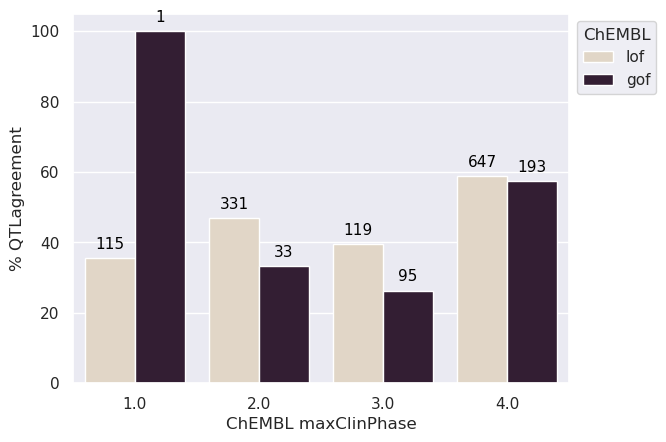

In [149]:
### plotear 1,568
df1 = (
    plotear.na.fill(0)
    .sort(F.col("ChEMBL").desc(), F.col("maxClinPhase").asc())
    .toPandas()
    # .append(s, ignore_index=True)
    # .sort_values(["ChEMBL", "maxClinPhase"], ascending=[False, True])
)

fig = sns.barplot(
    y="ratio",
    x="maxClinPhase",
    data=df1,
    hue="ChEMBL",
    palette="ch:.25",
)
fig.set(xlabel="ChEMBL maxClinPhase", ylabel="% QTLagreement")

ax = plt.gca()
df = df1

listado = ["115", "331", "119", "647", "1", "33", "95", "193"]
for i, p in enumerate(ax.patches):
    x = p.get_x() + p.get_width() / 2.0
    y = p.get_height()

    annotation_value = listado[i]  # Replace with the actual column name
    ax.annotate(
        str(annotation_value),
        (x, y),
        ha="center",
        va="center",
        fontsize=11,
        color="black",
        xytext=(0, 10),
        textcoords="offset points",
    )

sns.move_legend(fig, "upper left", bbox_to_anchor=(1, 1))

plt.show()

### using right_bio_feature

In [153]:
#### using right study
uniqueThird = (
    coloc_bnch2.filter(
        F.col("GoF_protectCh").isNotNull() | F.col("LoF_protectCh").isNotNull()
    )
    .filter(F.col("beta_assessed") != "neutral")
    .groupBy(
        # "right_study_id",
        "targetId",
        # "diseaseId",
        "studyId",
        "locusId",
        # "right_locus_id",
        # "right_type",
        "right_bio_feature",
        # "right_phenotype",
    )
    .agg(
        F.collect_set("beta_assessed").alias("dif_assess"),
        F.collect_set("locusId").alias("difLocusId"),
        F.collect_set("studyId").alias("difStudyId"),
        F.size(F.collect_set("beta_assessed")).alias("N_dif_assess"),
        F.size(F.collect_set("locusId")).alias("N_locusID"),
        F.size(F.collect_set("studyId")).alias("difStudyId"),
    )
    # .filter(F.col("N_dif_assess") == 1)
    .withColumn("idx", F.monotonically_increasing_id())
)

In [154]:
uniqueThird.count()

3294

In [178]:
coloc_bnch3Third = (
    (
        coloc_bnch2.join(
            uniqueThird,
            on=["targetId", "locusId", "studyId", "right_bio_feature"],
            how="right",
        )
        .withColumn(
            "Coherency",
            F.when(
                F.col("beta_assessed") == "gof",
                F.when(F.col("GoF_protectCh").isNotNull(), F.lit("coherent")).when(
                    F.col("LoF_protectCh").isNotNull(), F.lit("incoherent")
                ),
            ).when(
                F.col("beta_assessed") == "lof",
                F.when(F.col("GoF_protectCh").isNotNull(), F.lit("incoherent")).when(
                    F.col("LoF_protectCh").isNotNull(), F.lit("coherent")
                ),
            ),
        )
        .withColumn(
            "ChEMBL",
            F.when(
                (F.col("GoF_protectCh").isNotNull())
                & (F.col("LoF_protectCh").isNotNull()),
                F.lit(F.concat_ws("_", F.lit("gof&lof"))),
            )
            .when(
                (F.col("LoF_protectCh").isNotNull())
                & (F.col("GoF_protectCh").isNull()),
                F.lit(F.lit("lof")),
            )
            .when(
                (F.col("GoF_protectCh").isNotNull())
                & (F.col("LoF_protectCh").isNull()),
                F.lit(F.lit("gof")),
            ),
        )
    ).filter((F.col("ChEMBL") != "gof&lof") & (F.col("beta_assessed") != "neutral"))
).persist()

#### agrupar sin hacer nada
plotear = (
    coloc_bnch3Third.groupBy("ChEMBL", "maxClinPhase", "right_bio_feature")
    .pivot("beta_assessed")
    .agg(F.countDistinct("idx"))
    .sort(F.col("maxClinPhase").asc(), F.col("ChEMBL").desc())
    .withColumn("chemblPhase", F.concat_ws("_", F.col("ChEMBL"), F.col("maxClinPhase")))
    .withColumn(
        "ratio",
        F.when((F.col("gof").isNull() & F.col("lof").isNull()), F.lit(0)).otherwise(
            F.when(  # gof assessment with lof null
                (F.col("gof").isNotNull())
                & (F.col("lof").isNull())
                & (F.col("ChEMBL") == "gof"),
                F.lit(100),
            )
            .when(  # gof assessment with lof null
                (F.col("gof").isNull())
                & (F.col("lof").isNotNull())
                & (F.col("ChEMBL") == "gof"),
                F.lit(0),
            )
            .when(  # lof assessment with gof null
                (F.col("lof").isNotNull())
                & (F.col("gof").isNull())
                & (F.col("ChEMBL") == "lof"),
                F.lit(100),
            )
            .when(  # lof assessment with lof null
                (F.col("lof").isNull())
                & (F.col("gof").isNotNull())
                & (F.col("ChEMBL") == "lof"),
                F.lit(0),
            )
            .when(  ###both with data
                F.col("gof").isNotNull() & F.col("lof").isNotNull(),
                F.when(
                    F.col("ChEMBL") == "gof",
                    (F.col("gof") / (F.col("gof") + F.col("lof"))) * 100,
                ).when(
                    F.col("ChEMBL") == "lof",
                    (F.col("lof") / (F.col("gof") + F.col("lof"))) * 100,
                ),
            )
        ),
    )
    .na.fill(0)
    .withColumn("sampleSize", F.col("gof") + F.col("lof"))
    .withColumnRenamed("gof", "gof_qtl")
    .withColumnRenamed("lof", "lof_qtl")
)

23/09/29 14:53:25 WARN CacheManager: Asked to cache already cached data.


<AxesSubplot:xlabel='right_bio_feature', ylabel='ratio'>

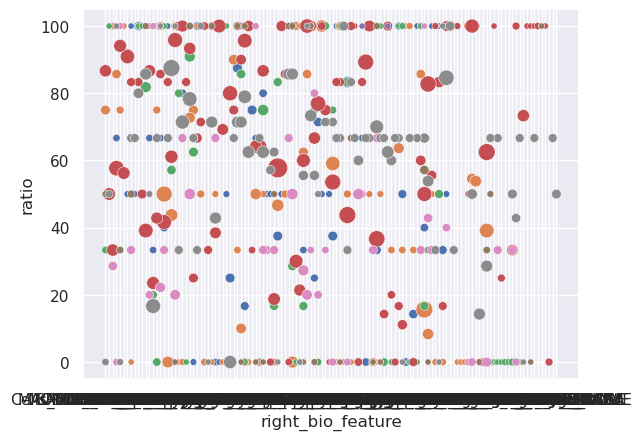

In [201]:
sns.set(font_scale=1)
sns.scatterplot(
    data=df1,
    x="right_bio_feature",
    y="ratio",
    hue="chemblPhase",
    size="sampleSize",
    sizes=(20, 200),
    legend=None,
)

[Text(0.5, 0, 'ChEMBL maxClinPhase'), Text(0, 0.5, '% QTLagreement')]

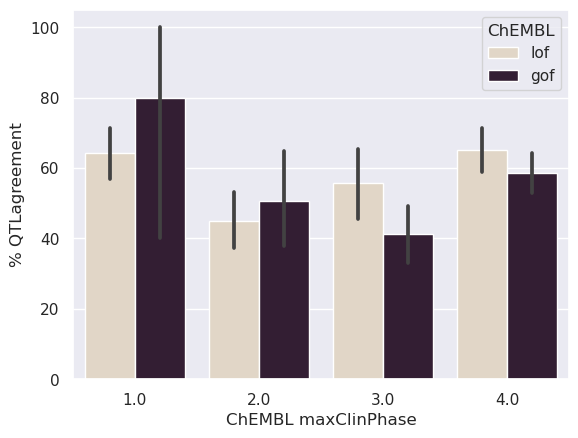

In [202]:
df1 = (
    plotear.na.fill(0)
    .sort(F.col("ChEMBL").desc(), F.col("maxClinPhase").asc())
    .toPandas()
    # .append(s, ignore_index=True)
    # .sort_values(["ChEMBL", "maxClinPhase"], ascending=[False, True])
)

fig = sns.barplot(
    y="ratio",
    x="maxClinPhase",
    data=df1,
    hue="ChEMBL",
    palette="ch:.25",
)
fig.set(xlabel="ChEMBL maxClinPhase", ylabel="% QTLagreement")

TypeError: 'AxesSubplot' object is not callable

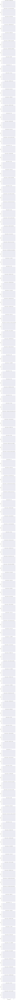

In [225]:
tissues = df1.right_bio_feature.unique()
sns.FacetGrid(
    df1,
    row="maxClinPhase",
    hue="right_bio_feature",
    palette="Set3",
    aspect=2,
)

g.map(
    sns.barplot(
        y="ratio",
        x="maxClinPhase",
        data=df1,
        hue="ChEMBL",
        palette="ch:.25",
    )
)

In [227]:
coloc2.count()

4165251

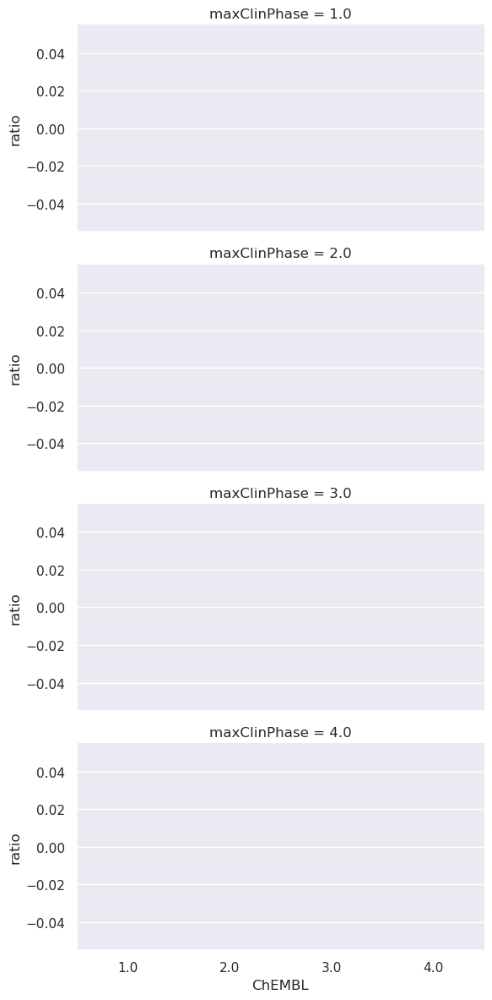

In [226]:
tissues = df1.maxClinPhase.unique()
g = sns.FacetGrid(
    df1,
    row="maxClinPhase",
    hue="right_bio_feature",
    palette="Set3",
    aspect=2,
)
g.map(sns.barplot, "ChEMBL", "ratio", order=tissues)

<AxesSubplot:xlabel='right_bio_feature', ylabel='chemblPhase'>

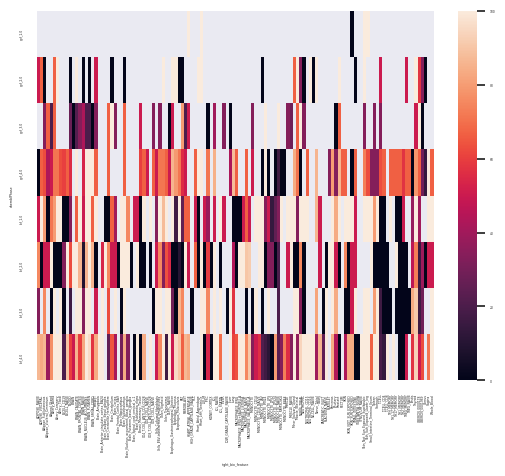

In [195]:
sns.heatmap(df1.pivot("chemblPhase", "right_bio_feature", "ratio"))

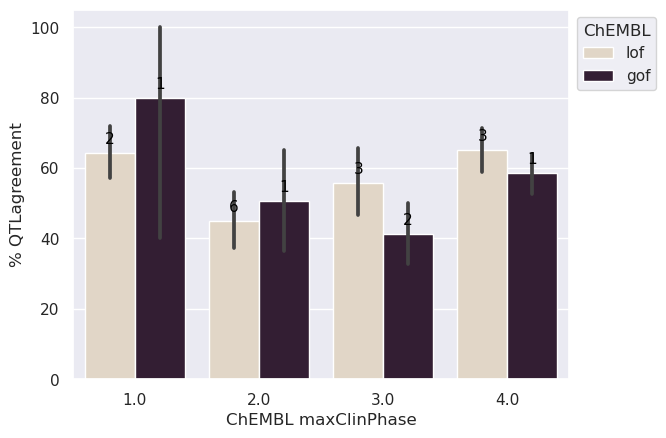

In [180]:
### plotear 1,568
df1 = (
    plotear.na.fill(0)
    .sort(F.col("ChEMBL").desc(), F.col("maxClinPhase").asc())
    .toPandas()
    # .append(s, ignore_index=True)
    # .sort_values(["ChEMBL", "maxClinPhase"], ascending=[False, True])
)

fig = sns.barplot(
    y="ratio",
    x="maxClinPhase",
    data=df1,
    hue="ChEMBL",
    palette="ch:.25",
)
fig.set(xlabel="ChEMBL maxClinPhase", ylabel="% QTLagreement")

ax = plt.gca()
df = df1

listado = df1["sampleSize"]
for i, p in enumerate(ax.patches):
    x = p.get_x() + p.get_width() / 2.0
    y = p.get_height()

    annotation_value = listado[i]  # Replace with the actual column name
    ax.annotate(
        str(annotation_value),
        (x, y),
        ha="center",
        va="center",
        fontsize=11,
        color="black",
        xytext=(0, 10),
        textcoords="offset points",
    )

sns.move_legend(fig, "upper left", bbox_to_anchor=(1, 1))

plt.show()

In [1]:
### make the benchmarking with ChEMBL - Compare GoF/LoF.

coloc_bnch3 = (
    (
        coloc_bnch2.filter(
            F.col("GoF_protectCh").isNotNull() | F.col("LoF_protectCh").isNotNull()
        )
        .withColumn(
            "Coherency",
            F.when(
                F.col("beta_assessed") == "gof",
                F.when(F.col("GoF_protectCh").isNotNull(), F.lit("coherent")).when(
                    F.col("LoF_protectCh").isNotNull(), F.lit("incoherent")
                ),
            ).when(
                F.col("beta_assessed") == "lof",
                F.when(F.col("GoF_protectCh").isNotNull(), F.lit("incoherent")).when(
                    F.col("LoF_protectCh").isNotNull(), F.lit("coherent")
                ),
            ),
        )
        .withColumn(
            "ChEMBL",
            F.when(
                (F.col("GoF_protectCh").isNotNull())
                & (F.col("LoF_protectCh").isNotNull()),
                F.lit(F.concat_ws("_", F.lit("gof&lof"))),
            )
            .when(
                (F.col("LoF_protectCh").isNotNull())
                & (F.col("GoF_protectCh").isNull()),
                F.lit(F.lit("lof")),
            )
            .when(
                (F.col("GoF_protectCh").isNotNull())
                & (F.col("LoF_protectCh").isNull()),
                F.lit(F.lit("gof")),
            ),
        )
    )
    .join(
        two_assessments,
        on=[
            "right_study_id",
            "targetId",
            "diseaseId",
            "right_locus_id",
            "right_type",
            "right_bio_feature",
        ],
        how="left",
    )
    .persist()
)

NameError: name 'coloc_bnch2' is not defined

In [52]:
coloc_bnch3.filter(
    (F.col("nr_difAss") == 1)
    & (F.col("beta_assessed") != "neutral")
    & (F.col("ChEMBL") != "gof&lof")
).count()

2592

In [29]:
columnas = ["coherent", "incoherent"]
coloc_bnch3.filter(
    (F.col("nr_difAss") == 1) & (F.col("beta_assessed") != "neutral")
).groupBy("beta_assessed").pivot("ChEMBL").count().show(200)

+-------------+---+-------+----+
|beta_assessed|gof|gof&lof| lof|
+-------------+---+-------+----+
|          gof|241|     25| 866|
|          lof|178|     16|1307|
+-------------+---+-------+----+



## Remove rows with multiple assessments when aggregating by target-disease, remove rows with null values on beta and gof&lof chembl gold standards 

In [17]:
#### good table 2X2 with 183 pairs and 2592 rows
coloc_bnch3.filter(
    (F.col("nr_difAss") == 1)
    & (F.col("beta_assessed") != "neutral")
    & (F.col("ChEMBL") != "gof&lof")
).groupBy("ChEMBL", "maxClinPhase", "").pivot("beta_assessed").count().sort(
    F.col("maxClinPhase").asc(), F.col("ChEMBL").desc()
).withColumn(
    "chemblPhase", F.concat_ws("_", F.col("ChEMBL"), F.col("maxClinPhase"))
).withColumn(
    "ratio",
    F.when(
        F.col("ChEMBL") == "gof", (F.col("gof") / (F.col("gof") + F.col("lof"))) * 100
    ).when(
        F.col("ChEMBL") == "lof", (F.col("lof") / (F.col("gof") + F.col("lof"))) * 100
    ),
).show()

+------+------------+---+---+-----------+------------------+
|ChEMBL|maxClinPhase|gof|lof|chemblPhase|             ratio|
+------+------------+---+---+-----------+------------------+
|   lof|         1.0|130|190|    lof_1.0|            59.375|
|   gof|         1.0|  4|  1|    gof_1.0|              80.0|
|   lof|         2.0|243|250|    lof_2.0|50.709939148073026|
|   gof|         2.0| 35| 23|    gof_2.0|  60.3448275862069|
|   lof|         3.0| 91|117|    lof_3.0|             56.25|
|   gof|         3.0| 12| 45|    gof_3.0|21.052631578947366|
|   lof|         4.0|402|750|    lof_4.0| 65.10416666666666|
|   gof|         4.0|190|109|    gof_4.0| 63.54515050167224|
+------+------------+---+---+-----------+------------------+



In [9]:
coloc_bnch3.count()

3857

In [5]:
toPlo4 = (
    coloc_bnch3.filter(
        (F.col("nr_difAss") == 1)
        & (F.col("beta_assessed") != "neutral")
        & (F.col("ChEMBL") != "gof&lof")
    )
    .groupBy("ChEMBL", "maxClinPhase")
    .pivot("beta_assessed")
    .count()
    .sort(F.col("maxClinPhase").asc(), F.col("ChEMBL").desc())
    .withColumn("chemblPhase", F.concat_ws("_", F.col("ChEMBL"), F.col("maxClinPhase")))
    .withColumn(
        "ratio",
        F.when(
            F.col("ChEMBL") == "gof",
            (F.col("gof") / (F.col("gof") + F.col("lof"))) * 100,
        ).when(
            F.col("ChEMBL") == "lof",
            (F.col("lof") / (F.col("gof") + F.col("lof"))) * 100,
        ),
    )
    .withColumn("sampleSize", F.col("gof") + F.col("lof"))
    .withColumnRenamed("gof", "gof_qtl")
    .withColumnRenamed("lof", "lof_qtl")
)

#### Take the highest beta value in absolut number

In [145]:
coloc_highest = (
    coloc.filter(F.col("right_type") != "gwas")
    .select(
        F.concat_ws("_", "left_chrom", "left_pos", "left_ref", "left_alt").alias(
            "left_locus_id"
        ),
        F.concat_ws("_", "right_chrom", "right_pos", "right_ref", "right_alt").alias(
            "right_locus_id"
        ),
        F.col("left_study").alias("left_study_id"),
        F.col("right_study").alias("right_study_id"),
        "right_gene_id",
        "coloc_h4",
        "left_var_right_study_beta",
    )
    # Get highest coloc result - aggregation to not take into account the tissue
    .withColumn(
        "rank_leftStudy",
        F.row_number().over(
            Window.partitionBy(
                "left_locus_id", "left_study_id", "right_gene_id"
            ).orderBy(F.abs(F.col("left_var_right_study_beta")).desc())
        ),
    )
    .withColumn(
        "rank_rightStudy",
        F.row_number().over(
            Window.partitionBy(
                "left_locus_id", "right_study_id", "right_gene_id"
            ).orderBy(F.abs(F.col("left_var_right_study_beta")).desc())
        ),
    )
    .filter(F.col("rank") == 1)
    .withColumnRenamed("coloc_h4", "max_coloc_h4")
    .persist()
)

coloc4_Wabs = coloc_bnch3.join(
    coloc_highest.withColumnRenamed("left_var_right_study_beta", "absolut_beta")
    .withColumnRenamed("left_locus_id", "locusId")
    .withColumnRenamed("left_study_id", "studyId")
    .withColumnRenamed("right_gene_id", "targetId")
    .withColumnRenamed("max_coloc_h4", "coloc_h4"),
    on=[
        "locusId",
        # "right_locus_id",
        "studyId",
        # "right_study_id",
        "targetId",
        # "coloc_h4",
    ],
)  ##### care with this join
coloc4_Wabs_f = coloc4_Wabs.filter(
    (F.col("nr_difAss") == 1)
    & (F.col("beta_assessed") != "neutral")
    & (F.col("ChEMBL") != "gof&lof")
).persist()

23/09/28 14:34:43 WARN CacheManager: Asked to cache already cached data.


In [134]:
coloc4_Wabs_f.withColumn(
    "chemblPhase", F.concat_ws("_", F.col("ChEMBL"), F.col("maxClinPhase"))
)

df = coloc4_Wabs_f.withColumn(
    "chemblPhase", F.concat_ws("_", F.col("ChEMBL"), F.col("maxClinPhase"))
).toPandas()
df_pivot = df.pivot_table(
    index=["chemblPhase"],
    columns="beta_assessed",
    values="count",
    aggfunc="sum",
)

In [153]:
coloc4_Wabs_f.drop("right_biotype_id", "Right phenotype").distinct().count()

2592

In [157]:
coloc4_Wabs_f.select("locusId", "targetId").distinct().count()

260

In [150]:
coloc4_Wabs_f.withColumn(
    "coloc_mech",
    F.when(F.col("absolut_beta") > 0, F.lit("gof")).when(
        F.col("absolut_beta") < 0, F.lit("lof")
    ),
).withColumn(
    "chemblPhase", F.concat_ws("_", F.col("ChEMBL"), F.col("maxClinPhase"))
).groupBy(
    "coloc_mech", "maxClinPhase"
).count().show()

+----------+------------+-----+
|coloc_mech|maxClinPhase|count|
+----------+------------+-----+
|       lof|         4.0|  820|
|       gof|         4.0|  631|
|       lof|         3.0|  197|
|       gof|         2.0|  196|
|       lof|         1.0|  124|
|       gof|         1.0|  201|
|       lof|         2.0|  355|
|       gof|         3.0|   68|
+----------+------------+-----+



In [136]:
df_pivot

beta_assessed,gof,lof,gof,lof
chemblPhase,,,,
gof_1.0,8,2,4,1
gof_2.0,66,33,35,23
gof_3.0,24,74,12,45
gof_4.0,361,205,190,109
lof_1.0,230,360,130,190
lof_2.0,444,568,243,250
lof_3.0,155,211,91,117
lof_4.0,721,1396,402,750


In [124]:
#### define the pairs: left_locus_id (locusId),left_study_id ("studyId"),right_gene_id (targetId)
#### check we reproduce results (250 assoc/ now 255 filtering out contradicted=5, total=260)
assoc_abs = (
    coloc4_Wabs_f.withColumn(
        "absolutBeta_assessed",
        F.when(F.col("absolut_beta") > 0, F.lit("gof")).when(
            F.col("absolut_beta") < 0, F.lit("lof")
        ),
    )
    .groupBy("ChEMBL", "maxClinPhase", "locusId", "studyId", "targetId")
    .pivot("absolutBeta_assessed")
    .agg(F.count("locusId"))
    .withColumn(
        "contradict",
        F.when(
            F.col("gof").isNotNull() & F.col("lof").isNotNull(), F.lit("contradict")
        ),
    )
    .filter(F.col("contradict").isNull())  ### remove contradictions
    .withColumn(
        "assessed",
        F.when(F.col("gof").isNotNull(), F.lit("gof")).when(
            F.col("lof").isNotNull(), F.lit("lof")
        ),
    )
    .groupBy("ChEMBL", "maxClinPhase")
    .pivot("assessed")
    .count()
    .sort(F.col("maxClinPhase").asc(), F.col("ChEMBL").desc())
    .withColumn("chemblPhase", F.concat_ws("_", F.col("ChEMBL"), F.col("maxClinPhase")))
    .withColumn(
        "ratio",
        F.when((F.col("gof").isNull() & F.col("lof").isNull()), F.lit(0)).otherwise(
            F.when(  # gof assessment with lof null
                (F.col("gof").isNotNull())
                & (F.col("lof").isNull())
                & (F.col("ChEMBL") == "gof"),
                F.lit(100),
            )
            .when(  # gof assessment with lof null
                (F.col("gof").isNull())
                & (F.col("lof").isNotNull())
                & (F.col("ChEMBL") == "gof"),
                F.lit(0),
            )
            .when(  # lof assessment with gof null
                (F.col("lof").isNotNull())
                & (F.col("gof").isNull())
                & (F.col("ChEMBL") == "lof"),
                F.lit(100),
            )
            .when(  # lof assessment with lof null
                (F.col("lof").isNull())
                & (F.col("gof").isNotNull())
                & (F.col("ChEMBL") == "lof"),
                F.lit(0),
            )
            .when(  ###both with data
                F.col("gof").isNotNull() & F.col("lof").isNotNull(),
                F.when(
                    F.col("ChEMBL") == "gof",
                    (F.col("gof") / (F.col("gof") + F.col("lof"))) * 100,
                ).when(
                    F.col("ChEMBL") == "lof",
                    (F.col("lof") / (F.col("gof") + F.col("lof"))) * 100,
                ),
            )
        ),
    )
    .na.fill(0)
)

In [125]:
stackbarplot = assoc_abs.toPandas().melt(
    id_vars="chemblPhase", value_vars=["gof", "lof"]
)
stackbarplot = stackbarplot.sort_values(by=["chemblPhase"])
stackgof = stackbarplot[stackbarplot["variable"] == "gof"]
stacklof = stackbarplot[stackbarplot["variable"] == "lof"]

In [129]:
stackbarplot

,chemblPhase,variable,value
1,gof_1.0,gof,1
9,gof_1.0,lof,0
3,gof_2.0,gof,6
11,gof_2.0,lof,9
5,gof_3.0,gof,6
13,gof_3.0,lof,15
7,gof_4.0,gof,36
15,gof_4.0,lof,21
0,lof_1.0,gof,23
8,lof_1.0,lof,15


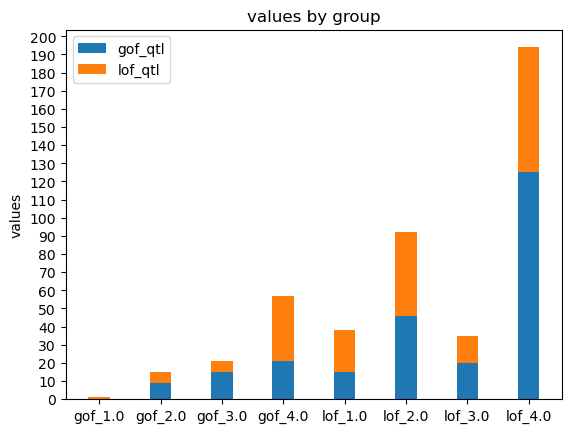

In [128]:
import numpy as np

N = 8
lof_value = list(stacklof[("value")])
gof_value = list(stackgof[("value")])

ind = np.arange(N)  # the x locations for the groups
width = 0.35  # the width of the bars: can also be len(x) sequence

p1 = plt.bar(
    ind,
    lof_value,
    width,
)
p2 = plt.bar(ind, gof_value, width, bottom=lof_value)

plt.ylabel("values")
plt.title("values by group")
plt.xticks(ind, list(stacklof[("chemblPhase")]))
plt.yticks(np.arange(0, 210, 10))
plt.legend((p1[0], p2[0]), ("gof_qtl", "lof_qtl"))

plt.show()

In [16]:
absolutBetas = (
    coloc4_Wabs_f.withColumn(
        "absolutBeta_assessed",
        F.when(F.col("absolut_beta") > 0, F.lit("gof")).when(
            F.col("absolut_beta") < 0, F.lit("lof")
        ),
    )
    .groupBy("ChEMBL", "maxClinPhase")
    .pivot("absolutBeta_assessed")
    .count()
    .sort(F.col("maxClinPhase").asc(), F.col("ChEMBL").desc())
    .withColumn("chemblPhase", F.concat_ws("_", F.col("ChEMBL"), F.col("maxClinPhase")))
    .withColumn(
        "ratio",
        F.when((F.col("gof").isNull() & F.col("lof").isNull()), F.lit(0)).otherwise(
            F.when(  # gof assessment with lof null
                (F.col("gof").isNotNull())
                & (F.col("lof").isNull())
                & (F.col("ChEMBL") == "gof"),
                F.lit(100),
            )
            .when(  # gof assessment with lof null
                (F.col("gof").isNull())
                & (F.col("lof").isNotNull())
                & (F.col("ChEMBL") == "gof"),
                F.lit(0),
            )
            .when(  # lof assessment with gof null
                (F.col("lof").isNotNull())
                & (F.col("gof").isNull())
                & (F.col("ChEMBL") == "lof"),
                F.lit(100),
            )
            .when(  # lof assessment with lof null
                (F.col("lof").isNull())
                & (F.col("gof").isNotNull())
                & (F.col("ChEMBL") == "lof"),
                F.lit(0),
            )
            .when(  ###both with data
                F.col("gof").isNotNull() & F.col("lof").isNotNull(),
                F.when(
                    F.col("ChEMBL") == "gof",
                    (F.col("gof") / (F.col("gof") + F.col("lof"))) * 100,
                ).when(
                    F.col("ChEMBL") == "lof",
                    (F.col("lof") / (F.col("gof") + F.col("lof"))) * 100,
                ),
            )
        ),
    )
    .na.fill(0)
    .withColumn("sampleSize", F.col("gof") + F.col("lof"))
    .withColumnRenamed("gof", "gof_qtl")
    .withColumnRenamed("lof", "lof_qtl")
)

In [47]:
absolutBetas.show()

+------+------------+-------+-------+-----------+------------------+----------+
|ChEMBL|maxClinPhase|gof_qtl|lof_qtl|chemblPhase|             ratio|sampleSize|
+------+------------+-------+-------+-----------+------------------+----------+
|   lof|         1.0|    196|    124|    lof_1.0|             38.75|       320|
|   gof|         1.0|      5|      0|    gof_1.0|             100.0|         5|
|   lof|         2.0|    170|    323|    lof_2.0| 65.51724137931035|       493|
|   gof|         2.0|     26|     32|    gof_2.0|44.827586206896555|        58|
|   lof|         3.0|     58|    150|    lof_3.0| 72.11538461538461|       208|
|   gof|         3.0|     10|     47|    gof_3.0|17.543859649122805|        57|
|   lof|         4.0|    387|    765|    lof_4.0|          66.40625|      1152|
|   gof|         4.0|    244|     55|    gof_4.0| 81.60535117056857|       299|
+------+------------+-------+-------+-----------+------------------+----------+



In [44]:
prueba

,ChEMBL,maxClinPhase,gof_qtl,lof_qtl,chemblPhase,ratio,sampleSize
0,lof,1.0,196,124,lof_1.0,38.750000,320
1,gof,1.0,5,0,gof_1.0,100.000000,5
2,lof,2.0,170,323,lof_2.0,65.517241,493
3,gof,2.0,26,32,gof_2.0,44.827586,58
4,lof,3.0,58,150,lof_3.0,72.115385,208
5,gof,3.0,10,47,gof_3.0,17.543860,57
6,lof,4.0,387,765,lof_4.0,66.406250,1152
7,gof,4.0,244,55,gof_4.0,81.605351,299


In [46]:
import pandas as pd

prueba.melt(
    id_vars=["chemblPhase", "sampleSize"],
    value_vars=["gof_qtl", "lof_qtl"],
)

,ChEMBL,sampleSize,variable,value
0,lof,320,gof_qtl,196
1,gof,5,gof_qtl,5
2,lof,493,gof_qtl,170
3,gof,58,gof_qtl,26
4,lof,208,gof_qtl,58
5,gof,57,gof_qtl,10
6,lof,1152,gof_qtl,387
7,gof,299,gof_qtl,244
8,lof,320,lof_qtl,124
9,gof,5,lof_qtl,0


In [30]:
prueba = absolutBetas.toPandas()

KeyError: ('ChEMBL', 'maxClinPhase', 'sampleSize')

In [90]:
so.Plot(absolutBetas.toPandas(), x="chemblPhase", color="sex").add(
    so.Bar(), so.Count(), so.Stack()
)

+------+------------+-------+-------+-----------+------------------+----------+
|ChEMBL|maxClinPhase|gof_qtl|lof_qtl|chemblPhase|             ratio|sampleSize|
+------+------------+-------+-------+-----------+------------------+----------+
|   lof|         1.0|    196|    124|    lof_1.0|             38.75|       320|
|   gof|         1.0|      5|   null|    gof_1.0|              null|      null|
|   lof|         2.0|    170|    323|    lof_2.0| 65.51724137931035|       493|
|   gof|         2.0|     26|     32|    gof_2.0|44.827586206896555|        58|
|   lof|         3.0|     58|    150|    lof_3.0| 72.11538461538461|       208|
|   gof|         3.0|     10|     47|    gof_3.0|17.543859649122805|        57|
|   lof|         4.0|    387|    765|    lof_4.0|          66.40625|      1152|
|   gof|         4.0|    244|     55|    gof_4.0| 81.60535117056857|       299|
+------+------------+-------+-------+-----------+------------------+----------+



In [108]:
absolutBetas.sort(F.col("ChEMBL").desc(), F.col("maxClinPhase").asc()).toPandas()

,ChEMBL,maxClinPhase,gof_qtl,lof_qtl,chemblPhase,ratio,sampleSize
0,lof,1.0,196,124,lof_1.0,38.750000,320
1,gof,1.0,5,0,gof_1.0,100.000000,5
2,lof,2.0,170,323,lof_2.0,65.517241,493
3,gof,2.0,26,32,gof_2.0,44.827586,58
4,lof,3.0,58,150,lof_3.0,72.115385,208
5,gof,3.0,10,47,gof_3.0,17.543860,57
6,lof,4.0,387,765,lof_4.0,66.406250,1152
7,gof,4.0,244,55,gof_4.0,81.605351,299


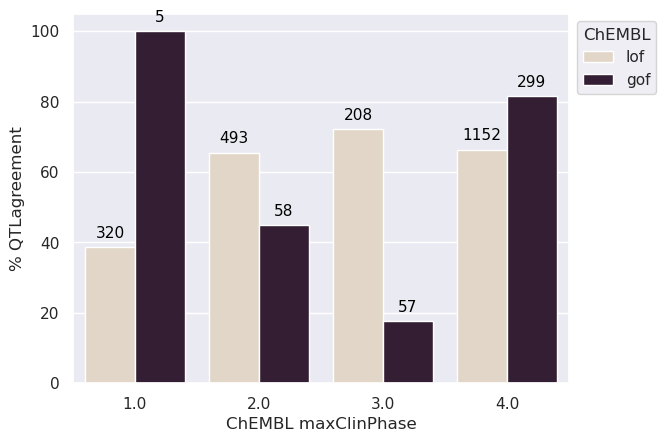

In [121]:
### absolut betas
sns.set(font_scale=1)
df1 = absolutBetas.sort(F.col("ChEMBL").desc(), F.col("maxClinPhase").asc()).toPandas()

fig = sns.barplot(
    y="ratio",
    x="maxClinPhase",
    data=df1,
    hue="ChEMBL",
    palette="ch:.25",
)
fig.set(xlabel="ChEMBL maxClinPhase", ylabel="% QTLagreement")

ax = plt.gca()
df = df1

for i, p in enumerate(ax.patches):
    x = p.get_x() + p.get_width() / 2.0
    y = p.get_height()

    annotation_value = str(df["sampleSize"][i])  # Replace with the actual column name
    ax.annotate(
        str(annotation_value),
        (x, y),
        ha="center",
        va="center",
        fontsize=11,
        color="black",
        xytext=(0, 10),
        textcoords="offset points",
    )

sns.move_legend(fig, "upper left", bbox_to_anchor=(1, 1))

plt.show()

In [110]:
df

,ChEMBL,maxClinPhase,gof_qtl,lof_qtl,chemblPhase,ratio,sampleSize
0,lof,1.0,196,124,lof_1.0,38.750000,320
1,gof,1.0,5,0,gof_1.0,100.000000,5
2,lof,2.0,170,323,lof_2.0,65.517241,493
3,gof,2.0,26,32,gof_2.0,44.827586,58
4,lof,3.0,58,150,lof_3.0,72.115385,208
5,gof,3.0,10,47,gof_3.0,17.543860,57
6,lof,4.0,387,765,lof_4.0,66.406250,1152
7,gof,4.0,244,55,gof_4.0,81.605351,299


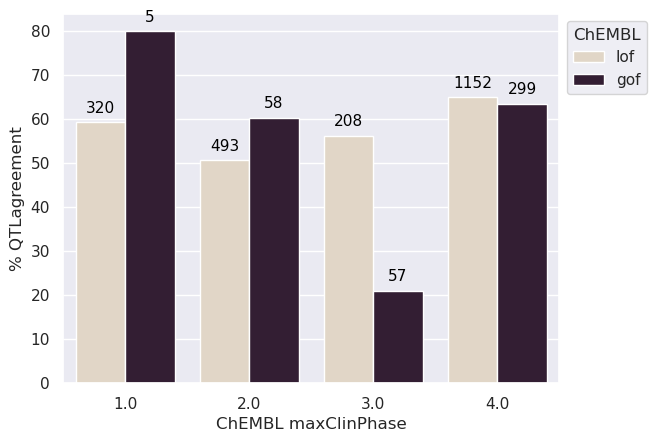

In [122]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.set(font_scale=1)
df2 = toPlo4.sort(F.col("ChEMBL").desc(), F.col("maxClinPhase").asc()).toPandas()

fig = sns.barplot(y="ratio", x="maxClinPhase", data=df2, hue="ChEMBL", palette="ch:.25")
fig.set(xlabel="ChEMBL maxClinPhase", ylabel="% QTLagreement")

ax = plt.gca()
df = df2

for i, p in enumerate(ax.patches):
    x = p.get_x() + p.get_width() / 2.0
    y = p.get_height()
    annotation_value = str(
        df.iloc[i]["sampleSize"]
    )  # Replace with the actual column name
    ax.annotate(
        str(annotation_value),
        (x, y),
        ha="center",
        va="center",
        fontsize=11,
        color="black",
        xytext=(0, 10),
        textcoords="offset points",
    )
sns.move_legend(fig, "upper left", bbox_to_anchor=(1, 1))

plt.show()

In [ ]:
### plotting

In [ ]:
#### good table 2X2 with 183 pairs and 2592 rows
coloc_bnch3.filter(
    (F.col("nr_difAss") == 1)
    & (F.col("beta_assessed") != "neutral")
    & (F.col("ChEMBL") != "gof&lof")
).groupBy("ChEMBL", "maxClinPhase").pivot("beta_assessed").count().sort(
    F.col("maxClinPhase").asc(), F.col("ChEMBL").desc()
).withColumn(
    "chemblPhase", F.concat_ws("_", F.col("ChEMBL"), F.col("maxClinPhase"))
).withColumn(
    "ratio",
    F.when(
        F.col("ChEMBL") == "gof", (F.col("gof") / (F.col("gof") + F.col("lof"))) * 100
    ).when(
        F.col("ChEMBL") == "lof", (F.col("lof") / (F.col("gof") + F.col("lof"))) * 100
    ),
).groupBy(
    "ChEMBL"
).show()

In [4]:
toPlot2 = (
    coloc_bnch3.filter(
        (F.col("nr_difAss") == 1)
        & (F.col("beta_assessed") != "neutral")
        & (F.col("ChEMBL") != "gof&lof")
    )
    .groupBy("ChEMBL", "maxClinPhase", "right_bio_feature")
    .pivot("beta_assessed")
    .count()
    .sort(F.col("maxClinPhase").asc(), F.col("ChEMBL").desc())
    .withColumn("chemblPhase", F.concat_ws("_", F.col("ChEMBL"), F.col("maxClinPhase")))
    .withColumn(
        "ratio",
        F.when((F.col("gof").isNull() & F.col("lof").isNull()), F.lit(0)).otherwise(
            F.when(  # gof assessment with lof null
                (F.col("gof").isNotNull())
                & (F.col("lof").isNull())
                & (F.col("ChEMBL") == "gof"),
                F.lit(100),
            )
            .when(  # gof assessment with lof null
                (F.col("gof").isNull())
                & (F.col("lof").isNotNull())
                & (F.col("ChEMBL") == "gof"),
                F.lit(0),
            )
            .when(  # lof assessment with gof null
                (F.col("lof").isNotNull())
                & (F.col("gof").isNull())
                & (F.col("ChEMBL") == "lof"),
                F.lit(100),
            )
            .when(  # lof assessment with lof null
                (F.col("lof").isNull())
                & (F.col("gof").isNotNull())
                & (F.col("ChEMBL") == "lof"),
                F.lit(0),
            )
            .when(  ###both with data
                F.col("gof").isNotNull() & F.col("lof").isNotNull(),
                F.when(
                    F.col("ChEMBL") == "gof",
                    (F.col("gof") / (F.col("gof") + F.col("lof"))) * 100,
                ).when(
                    F.col("ChEMBL") == "lof",
                    (F.col("lof") / (F.col("gof") + F.col("lof"))) * 100,
                ),
            )
        ),
    )
    .fillna(0, subset=["gof", "lof"])
    .withColumn("nrReports", F.col("gof") + F.col("lof"))
).persist()

<AxesSubplot:xlabel='ratio', ylabel='right_bio_feature'>

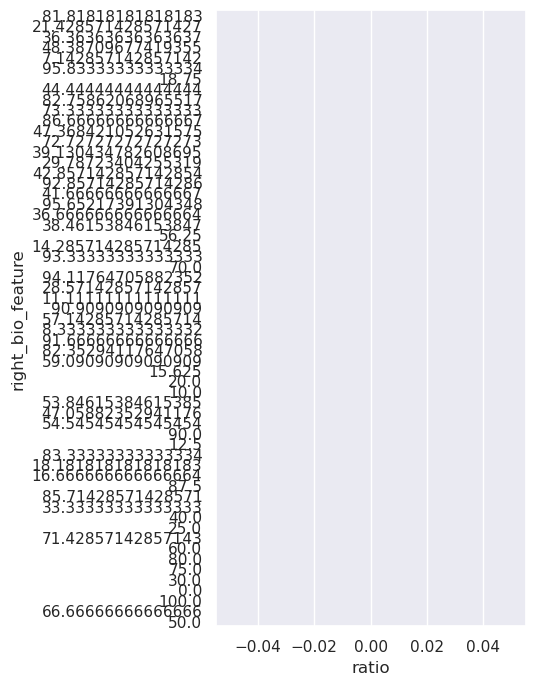

In [65]:
#### show ratio for every tissue per lof/gof
### continuar aqui el 28.sept.23
fig, ax = plt.subplots(figsize=(4, 8))
group_col = "ChEMBL"
order_of_bars = toPlot2.toPandas().ratio.unique()[::-1]

sns.barplot(
    x="ratio",  # Data for the width of bars
    y="right_bio_feature",  # Data for the y-axis (stages of purchase)
    data=toPlot2.toPandas(),  # Filter data for the current group
    order=order_of_bars,  # Specify the order of stages on the y-axis
    # color=color,  # Assign a color to the bar
    # label=group,  # Assign a label for the plot legend
    ax=ax,  # Specify the axis to plot on (previously created)
)

In [61]:
toPlot2.toPandas()

+------+------------+--------------------+---+---+-----------+-----------------+---------+
|ChEMBL|maxClinPhase|   right_bio_feature|gof|lof|chemblPhase|            ratio|nrReports|
+------+------------+--------------------+---+---+-----------+-----------------+---------+
|   lof|         1.0|       ADIPOSE_NAIVE|  1|  1|    lof_1.0|             50.0|        2|
|   lof|         1.0|   BRAIN_SPINAL_CORD|  1|  2|    lof_1.0|66.66666666666666|        3|
|   lof|         1.0|        NERVE_TIBIAL|  0|  1|    lof_1.0|            100.0|        1|
|   lof|         1.0|MACROPHAGE_SALMON...|  1|  1|    lof_1.0|             50.0|        2|
|   lof|         1.0|       BRAIN_CAUDATE|  1|  2|    lof_1.0|66.66666666666666|        3|
|   lof|         1.0|        Brain_Cortex|  3|  3|    lof_1.0|             50.0|        6|
|   lof|         1.0|CD4_T-CELL_ANTI-C...|  0|  1|    lof_1.0|            100.0|        1|
|   lof|         1.0|                Lung|  5|  0|    lof_1.0|              0.0|        5|

In [7]:
toHeatmap = (
    toPlot2.groupBy("right_bio_feature")
    .pivot("chemblPhase")
    .agg(F.first("ratio"))
    .toPandas()
).set_index("right_bio_feature")

In [8]:
toHeatmap

,gof_1.0,gof_2.0,gof_3.0,gof_4.0,lof_1.0,lof_2.0,lof_3.0,lof_4.0
right_bio_feature,,,,,,,,
PANCREATIC_ISLET,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN
BRAIN_PUTAMEN,NaN,0.0,0.0,100.0,100.000000,100.0,100.0,95.833333
Cells_EBV-transformed_lymphocytes,NaN,NaN,NaN,100.0,100.000000,75.0,100.0,75.000000
MONOCYTE_LPS2,NaN,NaN,NaN,NaN,12.500000,25.0,NaN,0.000000
CD8_T-CELL_NAIVE,NaN,NaN,NaN,NaN,NaN,NaN,0.0,NaN
...,...,...,...,...,...,...,...,...
Breast_Mammary_Tissue,NaN,NaN,NaN,100.0,0.000000,0.0,NaN,0.000000
SKIN_NOT_SUN_EXPOSED,NaN,NaN,NaN,NaN,100.000000,0.0,0.0,83.333333
MONOCYTE_IFN24,NaN,NaN,100.0,100.0,33.333333,0.0,NaN,16.666667


In [17]:
clustermap = (
    (
        toPlot2.groupBy("chemblPhase")
        .pivot("right_bio_feature")
        .agg(F.first("ratio"))
        .toPandas()
    )
    .set_index("chemblPhase")
    .fillna(0)
)

In [18]:
clustermap

,ADIPOSE_NAIVE,ADIPOSE_VISCERAL,Adipose_Subcutaneous,Adipose_Visceral_Omentum,Adrenal_Gland,Artery_Aorta,Artery_Coronary,Artery_Tibial,B-CELL_CD19,B-CELL_NAIVE,...,TH2_MEMORY,TREG_MEMORY,TREG_NAIVE,Testis,Thyroid,UBERON_0000178,UBERON_0001969,Uterus,Vagina,Whole_Blood
chemblPhase,,,,,,,,,,,,,,,,,,,,,
gof_3.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,100.000000,0.000000,0.000000,0.0,0.0,0.0
gof_2.0,0.000000,100.000000,0.000000,0.000000,0.000000,66.666667,100.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,100.000000,57.142857,33.333333,0.0,0.0,0.0
lof_4.0,92.857143,83.333333,86.666667,38.461538,72.727273,100.000000,100.0,100.0,20.0,100.0,...,0.0,50.0,0.0,48.387097,93.333333,50.000000,38.461538,0.0,0.0,100.0
lof_3.0,33.333333,0.000000,75.000000,0.000000,0.000000,100.000000,0.0,100.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,90.909091,16.666667,25.000000,0.0,0.0,100.0
lof_2.0,100.000000,0.000000,50.000000,50.000000,100.000000,0.000000,0.0,0.0,50.0,100.0,...,0.0,0.0,0.0,47.058824,75.000000,15.625000,82.352941,0.0,50.0,50.0
gof_4.0,0.000000,0.000000,66.666667,0.000000,0.000000,73.333333,100.0,100.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,100.000000,66.666667,0.000000,0.0,100.0,0.0
lof_1.0,50.000000,100.000000,80.000000,0.000000,71.428571,80.000000,100.0,100.0,0.0,0.0,...,50.0,0.0,0.0,33.333333,100.000000,40.000000,0.000000,0.0,100.0,100.0
gof_1.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.0


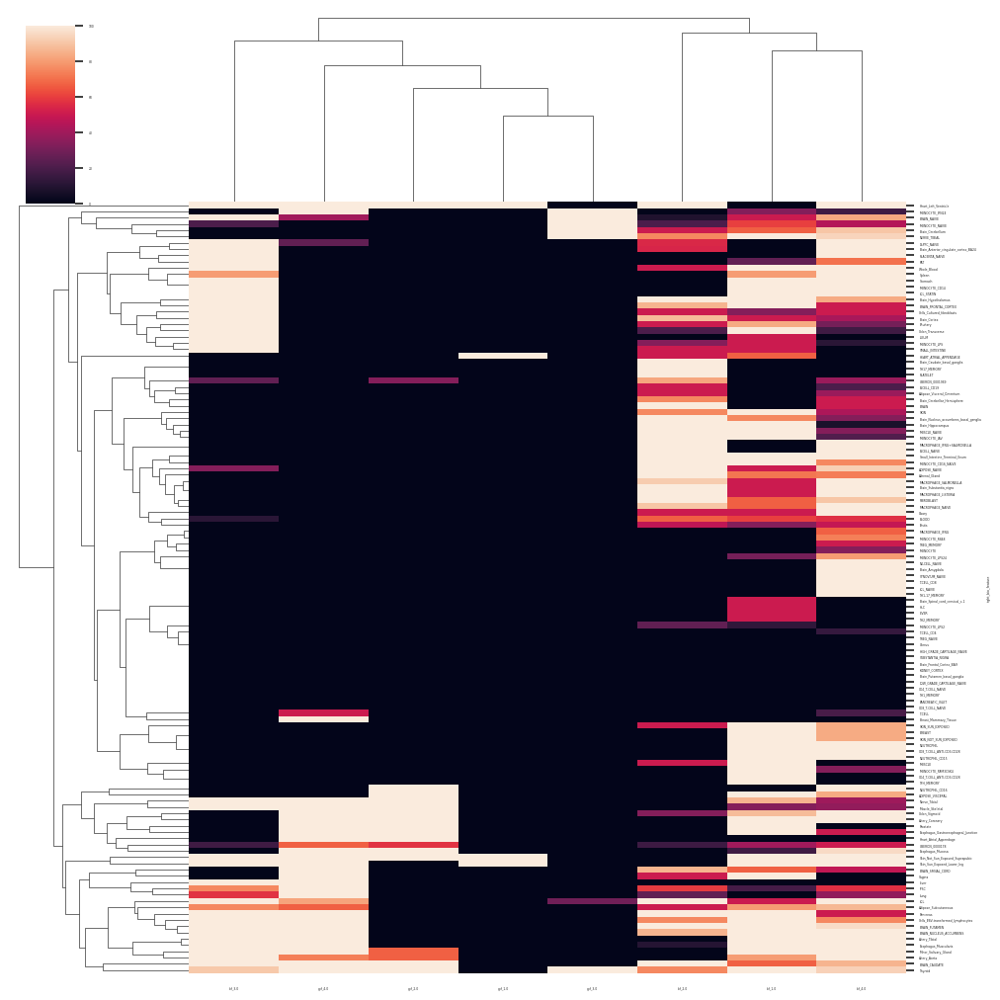

In [22]:
sns.clustermap(toHeatmap.fillna(0))

<AxesSubplot:ylabel='right_bio_feature'>

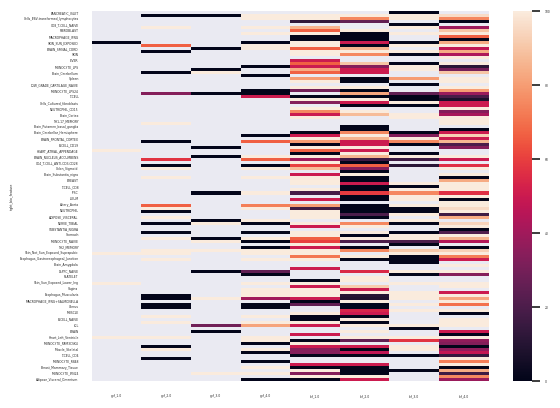

In [10]:
import seaborn as sns

sns.set(font_scale=2)
sns.heatmap(toHeatmap)

In [11]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [42]:
glue = sns.load_dataset("glue").pivot("Model", "Task", "Score")
# sns.heatmap(glue)

In [41]:
glue

Task,CoLA,MNLI,MRPC,QNLI,QQP,RTE,SST-2,STS-B
Model,,,,,,,,
BERT,60.5,86.7,89.3,92.7,72.1,70.1,94.9,87.6
BiLSTM,11.6,65.6,81.8,74.6,62.5,57.4,82.8,70.3
BiLSTM+Attn,18.6,67.6,83.9,74.3,60.1,58.4,83.0,72.8
BiLSTM+CoVe,18.5,65.4,78.7,70.8,60.6,52.7,81.9,64.4
BiLSTM+ELMo,32.1,67.2,84.7,75.5,61.1,57.4,89.3,70.3
ERNIE,75.5,92.3,93.9,97.3,75.2,92.6,97.8,93.0
RoBERTa,67.8,90.8,92.3,95.4,74.3,88.2,96.7,92.2
T5,71.6,92.2,92.8,96.9,75.1,92.8,97.5,93.1


In [52]:
toPlot2.show()

+------+------------+--------------------+---+---+-----------+-----------------+---------+
|ChEMBL|maxClinPhase|   right_bio_feature|gof|lof|chemblPhase|            ratio|nrReports|
+------+------------+--------------------+---+---+-----------+-----------------+---------+
|   lof|         1.0|       ADIPOSE_NAIVE|  1|  1|    lof_1.0|             50.0|        2|
|   lof|         1.0|Cells_Cultured_fi...|  4|  2|    lof_1.0|33.33333333333333|        6|
|   lof|         1.0|        MUSCLE_NAIVE|  0|  3|    lof_1.0|            100.0|        3|
|   lof|         1.0|   BRAIN_SPINAL_CORD|  1|  2|    lof_1.0|66.66666666666666|        3|
|   lof|         1.0|        NERVE_TIBIAL|  0|  1|    lof_1.0|            100.0|        1|
|   lof|         1.0| MONOCYTE_CD16_NAIVE|  0|  1|    lof_1.0|            100.0|        1|
|   lof|         1.0|MACROPHAGE_SALMON...|  1|  1|    lof_1.0|             50.0|        2|
|   lof|         1.0|              BREAST|  0|  1|    lof_1.0|            100.0|        1|

In [51]:
toPlot2.groupBy("right_bio_feature", "chemblPhase").agg(F.last("ratio")).count()

Py4JJavaError: An error occurred while calling o2947.count.
: java.lang.IllegalStateException: Couldn't find chemblPhase#28874 in [ChEMBL#20839,maxClinPhase#9179,right_bio_feature#4723]
	at org.apache.spark.sql.catalyst.expressions.BindReferences$$anonfun$bindReference$1.applyOrElse(BoundAttribute.scala:80)
	at org.apache.spark.sql.catalyst.expressions.BindReferences$$anonfun$bindReference$1.applyOrElse(BoundAttribute.scala:73)
	at org.apache.spark.sql.catalyst.trees.TreeNode.$anonfun$transformDownWithPruning$1(TreeNode.scala:584)
	at org.apache.spark.sql.catalyst.trees.CurrentOrigin$.withOrigin(TreeNode.scala:176)
	at org.apache.spark.sql.catalyst.trees.TreeNode.transformDownWithPruning(TreeNode.scala:584)
	at org.apache.spark.sql.catalyst.trees.TreeNode.transformDown(TreeNode.scala:560)
	at org.apache.spark.sql.catalyst.trees.TreeNode.transform(TreeNode.scala:528)
	at org.apache.spark.sql.catalyst.expressions.BindReferences$.bindReference(BoundAttribute.scala:73)
	at org.apache.spark.sql.catalyst.expressions.BindReferences$.$anonfun$bindReferences$1(BoundAttribute.scala:94)
	at scala.collection.TraversableLike.$anonfun$map$1(TraversableLike.scala:286)
	at scala.collection.mutable.ResizableArray.foreach(ResizableArray.scala:62)
	at scala.collection.mutable.ResizableArray.foreach$(ResizableArray.scala:55)
	at scala.collection.mutable.ArrayBuffer.foreach(ArrayBuffer.scala:49)
	at scala.collection.TraversableLike.map(TraversableLike.scala:286)
	at scala.collection.TraversableLike.map$(TraversableLike.scala:279)
	at scala.collection.AbstractTraversable.map(Traversable.scala:108)
	at org.apache.spark.sql.catalyst.expressions.BindReferences$.bindReferences(BoundAttribute.scala:94)
	at org.apache.spark.sql.execution.aggregate.HashAggregateExec.doConsumeWithKeys(HashAggregateExec.scala:627)
	at org.apache.spark.sql.execution.aggregate.AggregateCodegenSupport.doConsume(AggregateCodegenSupport.scala:77)
	at org.apache.spark.sql.execution.aggregate.AggregateCodegenSupport.doConsume$(AggregateCodegenSupport.scala:73)
	at org.apache.spark.sql.execution.aggregate.HashAggregateExec.doConsume(HashAggregateExec.scala:47)
	at org.apache.spark.sql.execution.CodegenSupport.constructDoConsumeFunction(WholeStageCodegenExec.scala:223)
	at org.apache.spark.sql.execution.CodegenSupport.consume(WholeStageCodegenExec.scala:194)
	at org.apache.spark.sql.execution.CodegenSupport.consume$(WholeStageCodegenExec.scala:151)
	at org.apache.spark.sql.execution.InputAdapter.consume(WholeStageCodegenExec.scala:498)
	at org.apache.spark.sql.execution.InputRDDCodegen.doProduce(WholeStageCodegenExec.scala:485)
	at org.apache.spark.sql.execution.InputRDDCodegen.doProduce$(WholeStageCodegenExec.scala:458)
	at org.apache.spark.sql.execution.InputAdapter.doProduce(WholeStageCodegenExec.scala:498)
	at org.apache.spark.sql.execution.CodegenSupport.$anonfun$produce$1(WholeStageCodegenExec.scala:97)
	at org.apache.spark.sql.execution.SparkPlan.$anonfun$executeQuery$1(SparkPlan.scala:232)
	at org.apache.spark.rdd.RDDOperationScope$.withScope(RDDOperationScope.scala:151)
	at org.apache.spark.sql.execution.SparkPlan.executeQuery(SparkPlan.scala:229)
	at org.apache.spark.sql.execution.CodegenSupport.produce(WholeStageCodegenExec.scala:92)
	at org.apache.spark.sql.execution.CodegenSupport.produce$(WholeStageCodegenExec.scala:92)
	at org.apache.spark.sql.execution.InputAdapter.produce(WholeStageCodegenExec.scala:498)
	at org.apache.spark.sql.execution.aggregate.HashAggregateExec.doProduceWithKeys(HashAggregateExec.scala:529)
	at org.apache.spark.sql.execution.aggregate.AggregateCodegenSupport.doProduce(AggregateCodegenSupport.scala:69)
	at org.apache.spark.sql.execution.aggregate.AggregateCodegenSupport.doProduce$(AggregateCodegenSupport.scala:65)
	at org.apache.spark.sql.execution.aggregate.HashAggregateExec.doProduce(HashAggregateExec.scala:47)
	at org.apache.spark.sql.execution.CodegenSupport.$anonfun$produce$1(WholeStageCodegenExec.scala:97)
	at org.apache.spark.sql.execution.SparkPlan.$anonfun$executeQuery$1(SparkPlan.scala:232)
	at org.apache.spark.rdd.RDDOperationScope$.withScope(RDDOperationScope.scala:151)
	at org.apache.spark.sql.execution.SparkPlan.executeQuery(SparkPlan.scala:229)
	at org.apache.spark.sql.execution.CodegenSupport.produce(WholeStageCodegenExec.scala:92)
	at org.apache.spark.sql.execution.CodegenSupport.produce$(WholeStageCodegenExec.scala:92)
	at org.apache.spark.sql.execution.aggregate.HashAggregateExec.produce(HashAggregateExec.scala:47)
	at org.apache.spark.sql.execution.WholeStageCodegenExec.doCodeGen(WholeStageCodegenExec.scala:660)
	at org.apache.spark.sql.execution.WholeStageCodegenExec.doExecute(WholeStageCodegenExec.scala:723)
	at org.apache.spark.sql.execution.SparkPlan.$anonfun$execute$1(SparkPlan.scala:194)
	at org.apache.spark.sql.execution.SparkPlan.$anonfun$executeQuery$1(SparkPlan.scala:232)
	at org.apache.spark.rdd.RDDOperationScope$.withScope(RDDOperationScope.scala:151)
	at org.apache.spark.sql.execution.SparkPlan.executeQuery(SparkPlan.scala:229)
	at org.apache.spark.sql.execution.SparkPlan.execute(SparkPlan.scala:190)
	at org.apache.spark.sql.execution.exchange.ShuffleExchangeExec.inputRDD$lzycompute(ShuffleExchangeExec.scala:135)
	at org.apache.spark.sql.execution.exchange.ShuffleExchangeExec.inputRDD(ShuffleExchangeExec.scala:135)
	at org.apache.spark.sql.execution.exchange.ShuffleExchangeExec.mapOutputStatisticsFuture$lzycompute(ShuffleExchangeExec.scala:140)
	at org.apache.spark.sql.execution.exchange.ShuffleExchangeExec.mapOutputStatisticsFuture(ShuffleExchangeExec.scala:139)
	at org.apache.spark.sql.execution.exchange.ShuffleExchangeLike.$anonfun$submitShuffleJob$1(ShuffleExchangeExec.scala:68)
	at org.apache.spark.sql.execution.SparkPlan.$anonfun$executeQuery$1(SparkPlan.scala:232)
	at org.apache.spark.rdd.RDDOperationScope$.withScope(RDDOperationScope.scala:151)
	at org.apache.spark.sql.execution.SparkPlan.executeQuery(SparkPlan.scala:229)
	at org.apache.spark.sql.execution.exchange.ShuffleExchangeLike.submitShuffleJob(ShuffleExchangeExec.scala:68)
	at org.apache.spark.sql.execution.exchange.ShuffleExchangeLike.submitShuffleJob$(ShuffleExchangeExec.scala:67)
	at org.apache.spark.sql.execution.exchange.ShuffleExchangeExec.submitShuffleJob(ShuffleExchangeExec.scala:115)
	at org.apache.spark.sql.execution.adaptive.ShuffleQueryStageExec.shuffleFuture$lzycompute(QueryStageExec.scala:174)
	at org.apache.spark.sql.execution.adaptive.ShuffleQueryStageExec.shuffleFuture(QueryStageExec.scala:174)
	at org.apache.spark.sql.execution.adaptive.ShuffleQueryStageExec.doMaterialize(QueryStageExec.scala:176)
	at org.apache.spark.sql.execution.adaptive.QueryStageExec.materialize(QueryStageExec.scala:82)
	at org.apache.spark.sql.execution.adaptive.AdaptiveSparkPlanExec.$anonfun$getFinalPhysicalPlan$5(AdaptiveSparkPlanExec.scala:265)
	at org.apache.spark.sql.execution.adaptive.AdaptiveSparkPlanExec.$anonfun$getFinalPhysicalPlan$5$adapted(AdaptiveSparkPlanExec.scala:263)
	at scala.collection.Iterator.foreach(Iterator.scala:943)
	at scala.collection.Iterator.foreach$(Iterator.scala:943)
	at scala.collection.AbstractIterator.foreach(Iterator.scala:1431)
	at scala.collection.IterableLike.foreach(IterableLike.scala:74)
	at scala.collection.IterableLike.foreach$(IterableLike.scala:73)
	at scala.collection.AbstractIterable.foreach(Iterable.scala:56)
	at org.apache.spark.sql.execution.adaptive.AdaptiveSparkPlanExec.$anonfun$getFinalPhysicalPlan$1(AdaptiveSparkPlanExec.scala:263)
	at org.apache.spark.sql.SparkSession.withActive(SparkSession.scala:779)
	at org.apache.spark.sql.execution.adaptive.AdaptiveSparkPlanExec.getFinalPhysicalPlan(AdaptiveSparkPlanExec.scala:235)
	at org.apache.spark.sql.execution.adaptive.AdaptiveSparkPlanExec.withFinalPlanUpdate(AdaptiveSparkPlanExec.scala:377)
	at org.apache.spark.sql.execution.adaptive.AdaptiveSparkPlanExec.executeCollect(AdaptiveSparkPlanExec.scala:350)
	at org.apache.spark.sql.Dataset.$anonfun$count$1(Dataset.scala:3161)
	at org.apache.spark.sql.Dataset.$anonfun$count$1$adapted(Dataset.scala:3160)
	at org.apache.spark.sql.Dataset.$anonfun$withAction$2(Dataset.scala:3858)
	at org.apache.spark.sql.execution.QueryExecution$.withInternalError(QueryExecution.scala:512)
	at org.apache.spark.sql.Dataset.$anonfun$withAction$1(Dataset.scala:3856)
	at org.apache.spark.sql.execution.SQLExecution$.$anonfun$withNewExecutionId$6(SQLExecution.scala:109)
	at org.apache.spark.sql.execution.SQLExecution$.withSQLConfPropagated(SQLExecution.scala:169)
	at org.apache.spark.sql.execution.SQLExecution$.$anonfun$withNewExecutionId$1(SQLExecution.scala:95)
	at org.apache.spark.sql.SparkSession.withActive(SparkSession.scala:779)
	at org.apache.spark.sql.execution.SQLExecution$.withNewExecutionId(SQLExecution.scala:64)
	at org.apache.spark.sql.Dataset.withAction(Dataset.scala:3856)
	at org.apache.spark.sql.Dataset.count(Dataset.scala:3160)
	at java.base/jdk.internal.reflect.NativeMethodAccessorImpl.invoke0(Native Method)
	at java.base/jdk.internal.reflect.NativeMethodAccessorImpl.invoke(NativeMethodAccessorImpl.java:62)
	at java.base/jdk.internal.reflect.DelegatingMethodAccessorImpl.invoke(DelegatingMethodAccessorImpl.java:43)
	at java.base/java.lang.reflect.Method.invoke(Method.java:566)
	at py4j.reflection.MethodInvoker.invoke(MethodInvoker.java:244)
	at py4j.reflection.ReflectionEngine.invoke(ReflectionEngine.java:357)
	at py4j.Gateway.invoke(Gateway.java:282)
	at py4j.commands.AbstractCommand.invokeMethod(AbstractCommand.java:132)
	at py4j.commands.CallCommand.execute(CallCommand.java:79)
	at py4j.ClientServerConnection.waitForCommands(ClientServerConnection.java:182)
	at py4j.ClientServerConnection.run(ClientServerConnection.java:106)
	at java.base/java.lang.Thread.run(Thread.java:829)


In [39]:
toPlot2.groupBy("right_bio_feature").pivot("chemblPhase").agg(F.first("ratio")).show()

Py4JJavaError: An error occurred while calling o2871.pivot.
: java.lang.IllegalStateException: Couldn't find chemblPhase#28874 in [ChEMBL#20839,maxClinPhase#9179,right_bio_feature#4723]
	at org.apache.spark.sql.catalyst.expressions.BindReferences$$anonfun$bindReference$1.applyOrElse(BoundAttribute.scala:80)
	at org.apache.spark.sql.catalyst.expressions.BindReferences$$anonfun$bindReference$1.applyOrElse(BoundAttribute.scala:73)
	at org.apache.spark.sql.catalyst.trees.TreeNode.$anonfun$transformDownWithPruning$1(TreeNode.scala:584)
	at org.apache.spark.sql.catalyst.trees.CurrentOrigin$.withOrigin(TreeNode.scala:176)
	at org.apache.spark.sql.catalyst.trees.TreeNode.transformDownWithPruning(TreeNode.scala:584)
	at org.apache.spark.sql.catalyst.trees.TreeNode.transformDown(TreeNode.scala:560)
	at org.apache.spark.sql.catalyst.trees.TreeNode.transform(TreeNode.scala:528)
	at org.apache.spark.sql.catalyst.expressions.BindReferences$.bindReference(BoundAttribute.scala:73)
	at org.apache.spark.sql.catalyst.expressions.BindReferences$.$anonfun$bindReferences$1(BoundAttribute.scala:94)
	at scala.collection.TraversableLike.$anonfun$map$1(TraversableLike.scala:286)
	at scala.collection.Iterator.foreach(Iterator.scala:943)
	at scala.collection.Iterator.foreach$(Iterator.scala:943)
	at scala.collection.AbstractIterator.foreach(Iterator.scala:1431)
	at scala.collection.IterableLike.foreach(IterableLike.scala:74)
	at scala.collection.IterableLike.foreach$(IterableLike.scala:73)
	at scala.collection.AbstractIterable.foreach(Iterable.scala:56)
	at scala.collection.TraversableLike.map(TraversableLike.scala:286)
	at scala.collection.TraversableLike.map$(TraversableLike.scala:279)
	at scala.collection.AbstractTraversable.map(Traversable.scala:108)
	at org.apache.spark.sql.catalyst.expressions.BindReferences$.bindReferences(BoundAttribute.scala:94)
	at org.apache.spark.sql.execution.aggregate.HashAggregateExec.doConsumeWithKeys(HashAggregateExec.scala:627)
	at org.apache.spark.sql.execution.aggregate.AggregateCodegenSupport.doConsume(AggregateCodegenSupport.scala:77)
	at org.apache.spark.sql.execution.aggregate.AggregateCodegenSupport.doConsume$(AggregateCodegenSupport.scala:73)
	at org.apache.spark.sql.execution.aggregate.HashAggregateExec.doConsume(HashAggregateExec.scala:47)
	at org.apache.spark.sql.execution.CodegenSupport.constructDoConsumeFunction(WholeStageCodegenExec.scala:223)
	at org.apache.spark.sql.execution.CodegenSupport.consume(WholeStageCodegenExec.scala:194)
	at org.apache.spark.sql.execution.CodegenSupport.consume$(WholeStageCodegenExec.scala:151)
	at org.apache.spark.sql.execution.InputAdapter.consume(WholeStageCodegenExec.scala:498)
	at org.apache.spark.sql.execution.InputRDDCodegen.doProduce(WholeStageCodegenExec.scala:485)
	at org.apache.spark.sql.execution.InputRDDCodegen.doProduce$(WholeStageCodegenExec.scala:458)
	at org.apache.spark.sql.execution.InputAdapter.doProduce(WholeStageCodegenExec.scala:498)
	at org.apache.spark.sql.execution.CodegenSupport.$anonfun$produce$1(WholeStageCodegenExec.scala:97)
	at org.apache.spark.sql.execution.SparkPlan.$anonfun$executeQuery$1(SparkPlan.scala:232)
	at org.apache.spark.rdd.RDDOperationScope$.withScope(RDDOperationScope.scala:151)
	at org.apache.spark.sql.execution.SparkPlan.executeQuery(SparkPlan.scala:229)
	at org.apache.spark.sql.execution.CodegenSupport.produce(WholeStageCodegenExec.scala:92)
	at org.apache.spark.sql.execution.CodegenSupport.produce$(WholeStageCodegenExec.scala:92)
	at org.apache.spark.sql.execution.InputAdapter.produce(WholeStageCodegenExec.scala:498)
	at org.apache.spark.sql.execution.aggregate.HashAggregateExec.doProduceWithKeys(HashAggregateExec.scala:529)
	at org.apache.spark.sql.execution.aggregate.AggregateCodegenSupport.doProduce(AggregateCodegenSupport.scala:69)
	at org.apache.spark.sql.execution.aggregate.AggregateCodegenSupport.doProduce$(AggregateCodegenSupport.scala:65)
	at org.apache.spark.sql.execution.aggregate.HashAggregateExec.doProduce(HashAggregateExec.scala:47)
	at org.apache.spark.sql.execution.CodegenSupport.$anonfun$produce$1(WholeStageCodegenExec.scala:97)
	at org.apache.spark.sql.execution.SparkPlan.$anonfun$executeQuery$1(SparkPlan.scala:232)
	at org.apache.spark.rdd.RDDOperationScope$.withScope(RDDOperationScope.scala:151)
	at org.apache.spark.sql.execution.SparkPlan.executeQuery(SparkPlan.scala:229)
	at org.apache.spark.sql.execution.CodegenSupport.produce(WholeStageCodegenExec.scala:92)
	at org.apache.spark.sql.execution.CodegenSupport.produce$(WholeStageCodegenExec.scala:92)
	at org.apache.spark.sql.execution.aggregate.HashAggregateExec.produce(HashAggregateExec.scala:47)
	at org.apache.spark.sql.execution.WholeStageCodegenExec.doCodeGen(WholeStageCodegenExec.scala:660)
	at org.apache.spark.sql.execution.WholeStageCodegenExec.doExecute(WholeStageCodegenExec.scala:723)
	at org.apache.spark.sql.execution.SparkPlan.$anonfun$execute$1(SparkPlan.scala:194)
	at org.apache.spark.sql.execution.SparkPlan.$anonfun$executeQuery$1(SparkPlan.scala:232)
	at org.apache.spark.rdd.RDDOperationScope$.withScope(RDDOperationScope.scala:151)
	at org.apache.spark.sql.execution.SparkPlan.executeQuery(SparkPlan.scala:229)
	at org.apache.spark.sql.execution.SparkPlan.execute(SparkPlan.scala:190)
	at org.apache.spark.sql.execution.exchange.ShuffleExchangeExec.inputRDD$lzycompute(ShuffleExchangeExec.scala:135)
	at org.apache.spark.sql.execution.exchange.ShuffleExchangeExec.inputRDD(ShuffleExchangeExec.scala:135)
	at org.apache.spark.sql.execution.exchange.ShuffleExchangeExec.mapOutputStatisticsFuture$lzycompute(ShuffleExchangeExec.scala:140)
	at org.apache.spark.sql.execution.exchange.ShuffleExchangeExec.mapOutputStatisticsFuture(ShuffleExchangeExec.scala:139)
	at org.apache.spark.sql.execution.exchange.ShuffleExchangeLike.$anonfun$submitShuffleJob$1(ShuffleExchangeExec.scala:68)
	at org.apache.spark.sql.execution.SparkPlan.$anonfun$executeQuery$1(SparkPlan.scala:232)
	at org.apache.spark.rdd.RDDOperationScope$.withScope(RDDOperationScope.scala:151)
	at org.apache.spark.sql.execution.SparkPlan.executeQuery(SparkPlan.scala:229)
	at org.apache.spark.sql.execution.exchange.ShuffleExchangeLike.submitShuffleJob(ShuffleExchangeExec.scala:68)
	at org.apache.spark.sql.execution.exchange.ShuffleExchangeLike.submitShuffleJob$(ShuffleExchangeExec.scala:67)
	at org.apache.spark.sql.execution.exchange.ShuffleExchangeExec.submitShuffleJob(ShuffleExchangeExec.scala:115)
	at org.apache.spark.sql.execution.adaptive.ShuffleQueryStageExec.shuffleFuture$lzycompute(QueryStageExec.scala:174)
	at org.apache.spark.sql.execution.adaptive.ShuffleQueryStageExec.shuffleFuture(QueryStageExec.scala:174)
	at org.apache.spark.sql.execution.adaptive.ShuffleQueryStageExec.doMaterialize(QueryStageExec.scala:176)
	at org.apache.spark.sql.execution.adaptive.QueryStageExec.materialize(QueryStageExec.scala:82)
	at org.apache.spark.sql.execution.adaptive.AdaptiveSparkPlanExec.$anonfun$getFinalPhysicalPlan$5(AdaptiveSparkPlanExec.scala:265)
	at org.apache.spark.sql.execution.adaptive.AdaptiveSparkPlanExec.$anonfun$getFinalPhysicalPlan$5$adapted(AdaptiveSparkPlanExec.scala:263)
	at scala.collection.Iterator.foreach(Iterator.scala:943)
	at scala.collection.Iterator.foreach$(Iterator.scala:943)
	at scala.collection.AbstractIterator.foreach(Iterator.scala:1431)
	at scala.collection.IterableLike.foreach(IterableLike.scala:74)
	at scala.collection.IterableLike.foreach$(IterableLike.scala:73)
	at scala.collection.AbstractIterable.foreach(Iterable.scala:56)
	at org.apache.spark.sql.execution.adaptive.AdaptiveSparkPlanExec.$anonfun$getFinalPhysicalPlan$1(AdaptiveSparkPlanExec.scala:263)
	at org.apache.spark.sql.SparkSession.withActive(SparkSession.scala:779)
	at org.apache.spark.sql.execution.adaptive.AdaptiveSparkPlanExec.getFinalPhysicalPlan(AdaptiveSparkPlanExec.scala:235)
	at org.apache.spark.sql.execution.adaptive.AdaptiveSparkPlanExec.withFinalPlanUpdate(AdaptiveSparkPlanExec.scala:377)
	at org.apache.spark.sql.execution.adaptive.AdaptiveSparkPlanExec.executeCollect(AdaptiveSparkPlanExec.scala:350)
	at org.apache.spark.sql.Dataset.collectFromPlan(Dataset.scala:3868)
	at org.apache.spark.sql.Dataset.$anonfun$collect$1(Dataset.scala:3120)
	at org.apache.spark.sql.Dataset.$anonfun$withAction$2(Dataset.scala:3858)
	at org.apache.spark.sql.execution.QueryExecution$.withInternalError(QueryExecution.scala:512)
	at org.apache.spark.sql.Dataset.$anonfun$withAction$1(Dataset.scala:3856)
	at org.apache.spark.sql.execution.SQLExecution$.$anonfun$withNewExecutionId$6(SQLExecution.scala:109)
	at org.apache.spark.sql.execution.SQLExecution$.withSQLConfPropagated(SQLExecution.scala:169)
	at org.apache.spark.sql.execution.SQLExecution$.$anonfun$withNewExecutionId$1(SQLExecution.scala:95)
	at org.apache.spark.sql.SparkSession.withActive(SparkSession.scala:779)
	at org.apache.spark.sql.execution.SQLExecution$.withNewExecutionId(SQLExecution.scala:64)
	at org.apache.spark.sql.Dataset.withAction(Dataset.scala:3856)
	at org.apache.spark.sql.Dataset.collect(Dataset.scala:3120)
	at org.apache.spark.sql.RelationalGroupedDataset.pivot(RelationalGroupedDataset.scala:425)
	at org.apache.spark.sql.RelationalGroupedDataset.pivot(RelationalGroupedDataset.scala:349)
	at java.base/jdk.internal.reflect.NativeMethodAccessorImpl.invoke0(Native Method)
	at java.base/jdk.internal.reflect.NativeMethodAccessorImpl.invoke(NativeMethodAccessorImpl.java:62)
	at java.base/jdk.internal.reflect.DelegatingMethodAccessorImpl.invoke(DelegatingMethodAccessorImpl.java:43)
	at java.base/java.lang.reflect.Method.invoke(Method.java:566)
	at py4j.reflection.MethodInvoker.invoke(MethodInvoker.java:244)
	at py4j.reflection.ReflectionEngine.invoke(ReflectionEngine.java:357)
	at py4j.Gateway.invoke(Gateway.java:282)
	at py4j.commands.AbstractCommand.invokeMethod(AbstractCommand.java:132)
	at py4j.commands.CallCommand.execute(CallCommand.java:79)
	at py4j.ClientServerConnection.waitForCommands(ClientServerConnection.java:182)
	at py4j.ClientServerConnection.run(ClientServerConnection.java:106)
	at java.base/java.lang.Thread.run(Thread.java:829)


In [36]:
toPlot3 = toPlot2.toPandas().set_index("ChEMBL")

In [37]:
toPlot3

,maxClinPhase,right_bio_feature,gof,lof,chemblPhase,ratio,nrReports
ChEMBL,,,,,,,
lof,1.0,ADIPOSE_NAIVE,1,1,lof_1.0,50.000000,2
lof,1.0,Cells_Cultured_fibroblasts,4,2,lof_1.0,33.333333,6
lof,1.0,MUSCLE_NAIVE,0,3,lof_1.0,100.000000,3
lof,1.0,BRAIN_SPINAL_CORD,1,2,lof_1.0,66.666667,3
lof,1.0,NERVE_TIBIAL,0,1,lof_1.0,100.000000,1
...,...,...,...,...,...,...,...
gof,4.0,Artery_Tibial,4,0,gof_4.0,100.000000,4
gof,4.0,Heart_Left_Ventricle,8,0,gof_4.0,100.000000,8
gof,4.0,MONOCYTE_LPS24,0,18,gof_4.0,0.000000,18


In [34]:
toPlot3

/opt/conda/miniconda3/lib/python3.10/site-packages/seaborn/axisgrid.py:118: UserWarning: Tight layout not applied. The bottom and top margins cannot be made large enough to accommodate all axes decorations.
  self._figure.tight_layout(*args, **kwargs)


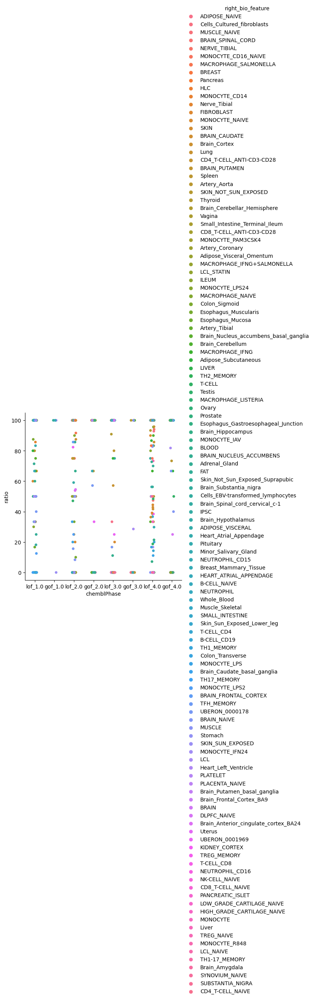

In [23]:
sns.catplot(
    data=toPlot2.toPandas(),
    x="chemblPhase",
    y="ratio",
    hue="right_bio_feature",
    #    kind="swarm",
)

In [21]:
sns.relplot(
    data=toPlot2.toPandas(),
    x="chemblPhase",
    y="ratio",
    hue="ChEMBL",
    size="nrReports",
    sizes=(40, 400),
    alpha=0.5,
    palette="muted",
    height=6,
)

ValueError: Plot kind swarm not recognized

<AxesSubplot:xlabel='chemblPhase', ylabel='ratio'>

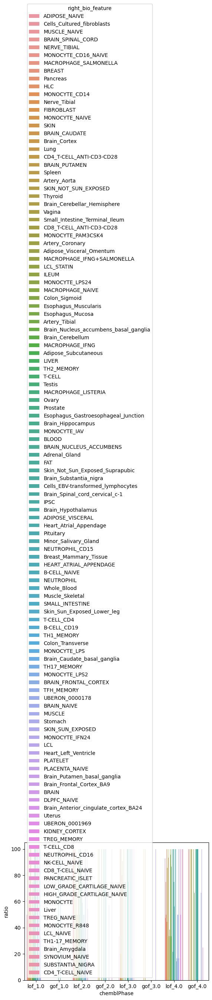

In [19]:
sns.barplot(
    data=toPlot2.toPandas(), x="chemblPhase", y="ratio", hue="right_bio_feature"
)

/opt/conda/miniconda3/lib/python3.10/site-packages/seaborn/axisgrid.py:712: UserWarning: Using the barplot function without specifying `order` is likely to produce an incorrect plot.
  warnings.warn(warning)


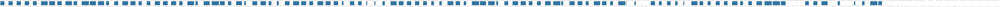

In [16]:
g = sns.FacetGrid(toPlot2.toPandas(), col="right_bio_feature")
g.map(sns.barplot, "ratio")

In [52]:
sns.set_theme(style="ticks")

# Create a dataset with many short random walks
rs = np.random.RandomState(4)
pos = rs.randint(-1, 2, (20, 5)).cumsum(axis=1)
pos -= pos[:, 0, np.newaxis]
step = np.tile(range(5), 20)
walk = np.repeat(range(20), 5)
df = pd.DataFrame(np.c_[pos.flat, step, walk], columns=["position", "step", "walk"])

In [ ]:
### position = ratio
### walk = tissue
## step = chemblPhase

/opt/conda/miniconda3/lib/python3.10/site-packages/seaborn/axisgrid.py:712: UserWarning: Using the barplot function without specifying `order` is likely to produce an incorrect plot.
  warnings.warn(warning)


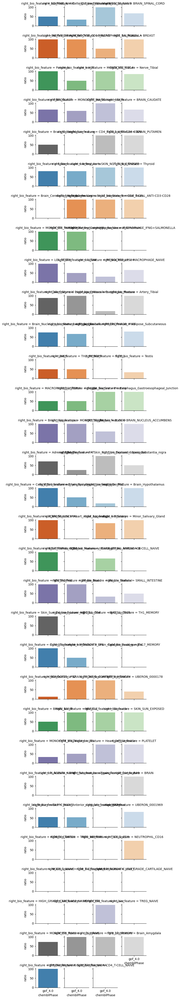

In [18]:
# Initialize a grid of plots with an Axes for each walk
grid = sns.FacetGrid(
    toPlot2.toPandas(),
    col="right_bio_feature",
    hue="right_bio_feature",
    palette="tab20c",
    col_wrap=4,
    height=1.5,
)

# Draw a horizontal line to show the starting point
# grid.refline(y=0, linestyle=":")

# Draw a line plot to show the trajectory of each random walk
grid.map(sns.barplot, "chemblPhase", "ratio")

# Adjust the tick positions and labels
# grid.set(xticks=np.arange(5), yticks=[0, 100], ylim=(0, 100))

# Adjust the arrangement of the plots
# grid.fig.tight_layout(w_pad=1)

In [53]:
df

,position,step,walk
0,0,0,0
1,1,1,0
2,1,2,0
3,1,3,0
4,0,4,0
...,...,...,...
95,0,0,19
96,-1,1,19
97,0,2,19
98,1,3,19


In [51]:
toPlot2.groupBy("chemblPhase").pivot("right_bio_feature").agg(F.first("ratio")).show()

+-----------+-----------------+-----------------+--------------------+------------------------+-----------------+-----------------+---------------+-------------+-----------+------------+-----------------+-----+-----------------+--------------------+-----------------+-----------------------+-----------------+------------------+-----------------+--------------+------------------------------------+---------------------------+---------------------------+-----------------+-----------------+------------------------+-----------------+------------------+-------------------------------------+---------------------------+------------------------------+----------------------+---------------------+------------------------+----------------+------------------------+----------------+--------------------------+---------------------------------+-----------------+------------------+-----------------+-----------------------------------+------------------+--------------------+-----+-----------------+------

In [35]:
toPlot = (
    coloc_bnch3.filter(
        (F.col("nr_difAss") == 1)
        & (F.col("beta_assessed") != "neutral")
        & (F.col("ChEMBL") != "gof&lof")
    )
    .groupBy("ChEMBL", "maxClinPhase")
    .pivot("beta_assessed")
    .count()
    .sort(F.col("maxClinPhase").asc(), F.col("ChEMBL").desc())
    .withColumn("chemblPhase", F.concat_ws("_", F.col("ChEMBL"), F.col("maxClinPhase")))
    .withColumn(
        "ratio",
        F.when(
            F.col("ChEMBL") == "gof",
            (F.col("gof") / (F.col("gof") + F.col("lof"))) * 100,
        ).when(
            F.col("ChEMBL") == "lof",
            (F.col("lof") / (F.col("gof") + F.col("lof"))) * 100,
        ),
    )
    .toPandas()
)
toPlot["chemblPhase"] = toPlot["chemblPhase"].astype(str)

sns.barplot(toPlot, x=chemblPhase, y=ratio, palette="rocket")

# ax1.set_ylabel("Sequential")

NameError: name 'chemblPhase' is not defined

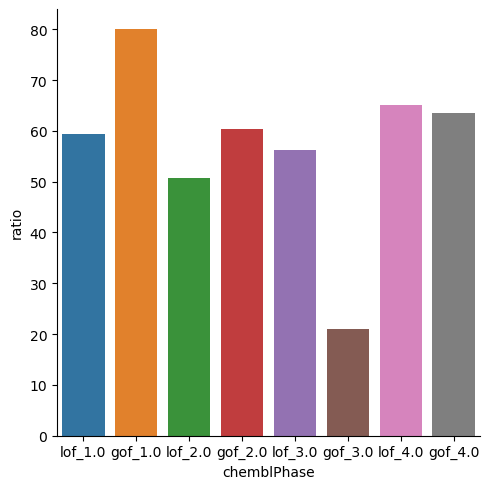

In [40]:
sns.catplot(data=toPlot, x="chemblPhase", y="ratio", kind="bar")

In [66]:
#### good table 2X2 with 183 pairs and 2592 rows
coloc_bnch3.filter(
    (F.col("nr_difAss") == 1)
    & (F.col("beta_assessed") != "neutral")
    & (F.col("ChEMBL") != "gof&lof")
).groupBy("maxClinPhase", "beta_assessed", "ChEMBL").count().sort(
    F.col("maxClinPhase").asc()
).show(
    200
)

+------------+-------------+------+-----+
|maxClinPhase|beta_assessed|ChEMBL|count|
+------------+-------------+------+-----+
|         1.0|          gof|   gof|    4|
|         1.0|          gof|   lof|  130|
|         1.0|          lof|   lof|  190|
|         1.0|          lof|   gof|    1|
|         2.0|          gof|   gof|   35|
|         2.0|          lof|   lof|  250|
|         2.0|          gof|   lof|  243|
|         2.0|          lof|   gof|   23|
|         3.0|          gof|   lof|   91|
|         3.0|          lof|   lof|  117|
|         3.0|          gof|   gof|   12|
|         3.0|          lof|   gof|   45|
|         4.0|          lof|   lof|  750|
|         4.0|          gof|   gof|  190|
|         4.0|          lof|   gof|  109|
|         4.0|          gof|   lof|  402|
+------------+-------------+------+-----+



In [20]:
toPlot = (
    coloc_bnch3.filter(
        (F.col("nr_difAss") == 1)
        & (F.col("beta_assessed") != "neutral")
        & (F.col("ChEMBL") != "gof&lof")
    )
    .groupBy("maxClinPhase", "beta_assessed", "ChEMBL")
    .count()
    .sort(F.col("maxClinPhase").asc())
    .toPandas()
)
ax1 = sns.barplot(toPlot, x=x, y=y1, palette="rocket")
ax1.axhline(0, color="k", clip_on=False)
ax1.set_ylabel("Sequential")

NameError: name 'x' is not defined

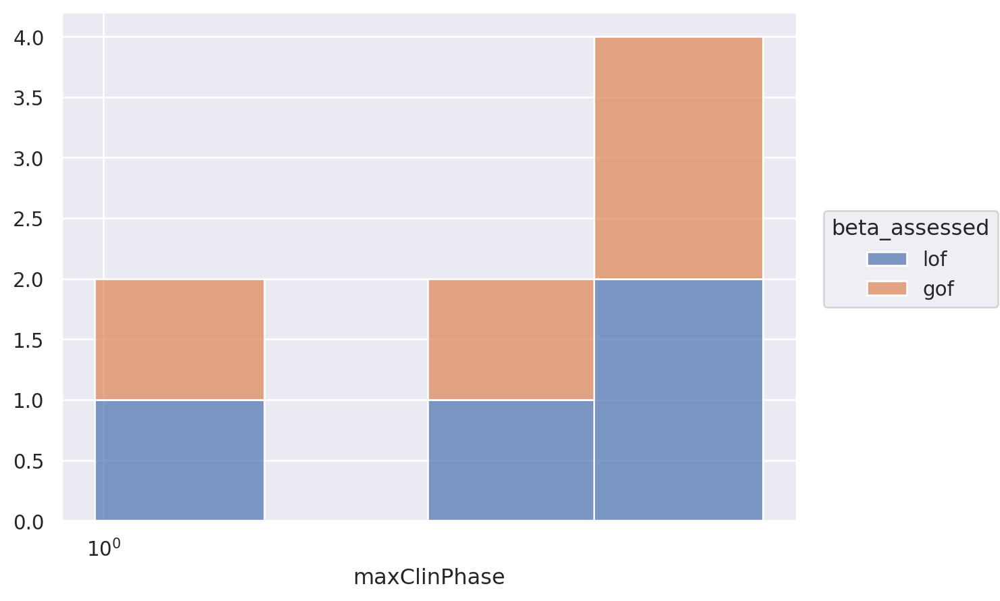

In [65]:
import seaborn.objects as so

p = so.Plot(
    coloc_bnch3.filter(
        (F.col("nr_difAss") == 1)
        & (F.col("beta_assessed") != "neutral")
        & (F.col("ChEMBL") != "gof&lof")
    )
    .groupBy("maxClinPhase", "beta_assessed")
    .pivot("ChEMBL")
    .count()
    .sort(F.col("maxClinPhase").asc())
    .toPandas(),
    "maxClinPhase",
).scale(x="log")

In [43]:
coloc_bnch3.filter(
    (F.col("nr_difAss") == 1) & (F.col("beta_assessed") != "neutral")
).groupBy("targetId", "diseaseId").count().count()

191

In [25]:
### there are variants (locusId) from dif GWAS studies that has dif beta values  - remove until new info
coloc_bnch3 = coloc_bnch2

### we need to filter out by the rows with null values

In [145]:
### print only the ones with disparities
coloc_bnch2.join(
    two_assessments,
    on=[
        "right_study_id",
        "targetId",
        "diseaseId",
        "right_locus_id",
        "right_type",
        "right_bio_feature",
    ],
    how="left",
).filter(F.col("nr_difAss").isNotNull()).sort(
    F.col("targetId").desc(),
    F.col("diseaseId").desc(),
    F.col("right_bio_feature").desc(),
).count()

1117

In [102]:
coloc_bnch3.filter(
    (F.col("GoF_protectCh").isNotNull() | F.col("LoF_protectCh").isNotNull())
    & (F.col("nr_difAss").isNull())
).show()

+--------------+---------------+-------------+-----------------+----------+--------------------+--------------------+---------------+-------------------+-------------------------+--------------------+---------+----------+-------------+--------------------+------------+-----+--------+-----+-------------+----------+-------------+-------------+----------+----------+----------+---------+-------------+
|right_study_id|       targetId|    diseaseId|   right_locus_id|right_type|   right_bio_feature|             studyId|        locusId|           coloc_h4|left_var_right_study_beta|     right_phenotype|left_type|is_flipped|beta_assessed|         therapyArea|         EFO|count|tendency|count|LoF_protectBN|LoF_riskBN|GoF_protectCh|LoF_protectCh|sampleSize|dif_assess|Nr_targets|nr_difAss|nr_difTargets|
+--------------+---------------+-------------+-----------------+----------+--------------------+--------------------+---------------+-------------------+-------------------------+-------------------

In [146]:
#### do the assessment of coherency afeter filtering by the 1117 rows with contradictions

coloc_bnch4 = coloc_bnch3.filter(
    (F.col("GoF_protectCh").isNotNull() | F.col("LoF_protectCh").isNotNull())
    & (F.col("nr_difAss").isNull())
)

In [236]:
coloc_bnch4.show(3000)

+----------------+---------------+---------------+--------------------+----------+--------------------+--------------------+--------------------+--------------------+-------------------------+--------------------+---------+----------+-------------+--------------------+------------+-----+-----------+-----+-------------+----------+-------------+-------------+----------+----------+----------+---------+-------------+
|  right_study_id|       targetId|      diseaseId|      right_locus_id|right_type|   right_bio_feature|             studyId|             locusId|            coloc_h4|left_var_right_study_beta|     right_phenotype|left_type|is_flipped|beta_assessed|         therapyArea|         EFO|count|   tendency|count|LoF_protectBN|LoF_riskBN|GoF_protectCh|LoF_protectCh|sampleSize|dif_assess|Nr_targets|nr_difAss|nr_difTargets|
+----------------+---------------+---------------+--------------------+----------+--------------------+--------------------+--------------------+--------------------+

In [147]:
coloc_bnch5 = coloc_bnch4.withColumn(
    "Coherency",
    F.when(
        F.col("beta_assessed") == "gof",
        F.when(F.col("GoF_protectCh").isNotNull(), F.lit("coherent")).when(
            F.col("LoF_protectCh").isNotNull(), F.lit("incoherent")
        ),
    )
    .when(
        F.col("beta_assessed") == "lof",
        F.when(F.col("GoF_protectCh").isNotNull(), F.lit("incoherent")).when(
            F.col("LoF_protectCh").isNotNull(), F.lit("coherent")
        ),
    )
    .otherwise(F.lit("notEnough")),
)  # .groupBy("Coherency").count().show()

In [233]:
coloc_bnch5.filter(F.col("Coherency") != "notEnough").count()

2633

In [219]:
coloc_bnch10 = coloc_bnch5.filter(F.col("Coherency") != "notEnough").withColumn(
    "ChEMBL",
    F.when(
        (F.col("GoF_protectCh").isNotNull()) & (F.col("LoF_protectCh").isNotNull()),
        F.lit(F.concat_ws("_", F.lit("gof&lof"))),
    )
    .when(
        (F.col("LoF_protectCh").isNotNull()) & (F.col("GoF_protectCh").isNull()),
        F.lit(F.lit("lof")),
    )
    .when(
        (F.col("GoF_protectCh").isNotNull()) & (F.col("LoF_protectCh").isNull()),
        F.lit(F.lit("gof")),
    ),
)

In [226]:
test = (
    coloc_bnch10.groupBy("right_study_id", "right_bio_feature", "sampleSize", "ChEMBL")
    .pivot("Coherency")
    .count()
    .withColumn(
        "ratio", F.col("coherent") / (F.col("coherent") + F.col("incoherent")) * 100
    )
    .sort(F.col("ratio").desc())
    .drop("coherent", "incoherent")
    .show()
)

+--------------+--------------------+----------+------+-----------------+
|right_study_id|   right_bio_feature|sampleSize|ChEMBL|            ratio|
+--------------+--------------------+----------+------+-----------------+
|     GTEx-eQTL|       BRAIN_PUTAMEN|     15201|   lof|96.96969696969697|
|     GTEx-eQTL|BRAIN_NUCLEUS_ACC...|     15201|   lof| 96.7741935483871|
|     GTEx-sQTL|        Artery_Aorta|     15201|   lof|96.42857142857143|
|   Alasoo_2018|MACROPHAGE_SALMON...|       336|   lof|96.29629629629629|
|   Alasoo_2018|MACROPHAGE_IFNG+S...|       336|   lof|95.45454545454545|
|     GTEx-sQTL|         Whole_Blood|     15201|   lof|95.23809523809523|
|     GTEx-sQTL|Adipose_Subcutaneous|     15201|   lof|94.11764705882352|
|  Nedelec_2016| MACROPHAGE_LISTERIA|       493|   lof|94.11764705882352|
|  Nedelec_2016|MACROPHAGE_SALMON...|       493|   lof|            93.75|
|    SUHRE_2017|      UBERON_0001969|      1000|   lof|92.85714285714286|
|     GTEx-sQTL|       Artery_Tibial| 

In [227]:
test = (
    coloc_bnch10.groupBy("right_study_id", "right_bio_feature", "sampleSize", "ChEMBL")
    .pivot("Coherency")
    .count()
    .withColumn(
        "ratio", F.col("coherent") / (F.col("coherent") + F.col("incoherent")) * 100
    )
    .sort(F.col("ratio").desc())
    .drop("coherent", "incoherent")
)

In [231]:
test.show(300)

+----------------+--------------------+----------+-------+------------------+
|  right_study_id|   right_bio_feature|sampleSize| ChEMBL|             ratio|
+----------------+--------------------+----------+-------+------------------+
|       GTEx-eQTL|       BRAIN_PUTAMEN|     15201|    lof| 96.96969696969697|
|       GTEx-eQTL|BRAIN_NUCLEUS_ACC...|     15201|    lof|  96.7741935483871|
|       GTEx-sQTL|        Artery_Aorta|     15201|    lof| 96.42857142857143|
|     Alasoo_2018|MACROPHAGE_SALMON...|       336|    lof| 96.29629629629629|
|     Alasoo_2018|MACROPHAGE_IFNG+S...|       336|    lof| 95.45454545454545|
|       GTEx-sQTL|         Whole_Blood|     15201|    lof| 95.23809523809523|
|    Nedelec_2016| MACROPHAGE_LISTERIA|       493|    lof| 94.11764705882352|
|       GTEx-sQTL|Adipose_Subcutaneous|     15201|    lof| 94.11764705882352|
|    Nedelec_2016|MACROPHAGE_SALMON...|       493|    lof|             93.75|
|      SUHRE_2017|      UBERON_0001969|      1000|    lof| 92.85

In [229]:
test.groupBy("right_study_id", "right_bio_feature", "sampleSize").pivot("ChEMBL").agg(
    F.first("ratio")
).count()

175

In [224]:
coloc_bnch10.groupBy(
    "right_study_id", "right_bio_feature", "sampleSize", "ChEMBL"
).pivot("Coherency").count().withColumn(
    "ratio", F.col("coherent") / (F.col("coherent") + F.col("incoherent")) * 100
).sort(
    F.col("ratio").desc()
).groupBy(
    "right_study_id", "right_bio_feature", "sampleSize"
).pivot(
    "ChEMBL"
).agg(
    F.first("ratio")
).show()

+--------------+--------------------+----------+------------------+-------+------------------+
|right_study_id|   right_bio_feature|sampleSize|               gof|gof&lof|               lof|
+--------------+--------------------+----------+------------------+-------+------------------+
|    Lepik_2017|               BLOOD|       491|              null|   null|              50.0|
|     GTEx-eQTL|              Vagina|     15201|              null|   null|              50.0|
|     GTEx-eQTL|  Brain_Hypothalamus|     15201|              null|   null|              null|
|Schmiedel_2018|          TREG_NAIVE|       106|              null|   null|              null|
|     OLLI_2016|      UBERON_0001969|      8293|              null|   null|              null|
|    CommonMind|         DLPFC_NAIVE|       590|14.285714285714285|   null| 85.29411764705883|
|     Peng_2018|      PLACENTA_NAIVE|       149|              null|   null|              75.0|
|     GTEx-eQTL|    Esophagus_Mucosa|     15201|  

In [113]:
#### count number of rows depending on the study

coloc_bnch5.groupBy("right_study_id").count().show()

+----------------+-----+
|  right_study_id|count|
+----------------+-----+
|    Fairfax_2014|  138|
|           CEDAR|   40|
|          ROSMAP|   54|
|       Braineac2|    4|
|       GTEx-eQTL|  696|
|          HipSci|   47|
|van_de_Bunt_2015|    1|
|    Nedelec_2016|   39|
|        BrainSeq|   12|
|  FOLKERSEN_2020|    8|
|    HILLARY_2019|    2|
|     Kasela_2017|    3|
|       BLUEPRINT|   60|
|      SUHRE_2017|   45|
|        GEUVADIS|   13|
|   PIETZNER_2020|   83|
|         TwinsUK|   71|
|     Alasoo_2018|   92|
|         SUN2018|    3|
|          FUSION|   50|
+----------------+-----+
only showing top 20 rows



In [209]:
coloc_bnch5.filter(F.col("Coherency") != "notEnough").groupBy(
    "right_study_id",
    "right_bio_feature",
    "GoF_protectCh",
    "LoF_protectCh",
    "sampleSize",
).pivot("coherency").count().withColumn(
    "ratio", F.col("coherent") / (F.col("coherent") + F.col("incoherent")) * 100
).sort(
    F.col("ratio").desc()
).show()

+--------------+--------------------+-------------+-------------+----------+--------+----------+-----------------+
|right_study_id|   right_bio_feature|GoF_protectCh|LoF_protectCh|sampleSize|coherent|incoherent|            ratio|
+--------------+--------------------+-------------+-------------+----------+--------+----------+-----------------+
|     GTEx-eQTL|   BRAIN_SPINAL_CORD|         null|            1|     15201|      13|         1|92.85714285714286|
|     GTEx-eQTL|BRAIN_NUCLEUS_ACC...|         null|            1|     15201|       7|         1|             87.5|
|        HipSci|                IPSC|         null|            1|       322|      14|         2|             87.5|
|     GTEx-eQTL|Brain_Cerebellar_...|         null|            1|     15201|       7|         1|             87.5|
|     GTEx-eQTL|    Esophagus_Mucosa|         null|           17|     15201|       5|         1|83.33333333333334|
|     GTEx-eQTL|             Thyroid|         null|           17|     15201|    

In [161]:
coloc_bnch5.groupBy("right_study_id", "right_bio_feature", "sampleSize").pivot(
    "coherency"
).count().drop("notEnough").withColumn(
    "ratio", F.col("coherent") / (F.col("coherent") + F.col("incoherent")) * 100
).sort(
    F.col("ratio").desc()
).show()

+--------------+--------------------+----------+--------+----------+-----------------+
|right_study_id|   right_bio_feature|sampleSize|coherent|incoherent|            ratio|
+--------------+--------------------+----------+--------+----------+-----------------+
|   Alasoo_2018|MACROPHAGE_SALMON...|       336|      26|         1|96.29629629629629|
|   Alasoo_2018|MACROPHAGE_IFNG+S...|       336|      21|         1|95.45454545454545|
|     GTEx-sQTL|Adipose_Subcutaneous|     15201|      20|         1|95.23809523809523|
|     GTEx-sQTL|         Whole_Blood|     15201|      20|         1|95.23809523809523|
|     GTEx-sQTL|       Artery_Tibial|     15201|      16|         1|94.11764705882352|
|  Nedelec_2016| MACROPHAGE_LISTERIA|       493|      16|         1|94.11764705882352|
|  Nedelec_2016|MACROPHAGE_SALMON...|       493|      15|         1|            93.75|
|   Alasoo_2018|    MACROPHAGE_NAIVE|       336|      14|         1|93.33333333333333|
|    SUHRE_2017|      UBERON_0001969|      

In [183]:
coloc5Plot = (
    coloc_bnch5.groupBy("right_study_id", "right_bio_feature", "sampleSize")
    .pivot("coherency")
    .count()
    .drop("notEnough")
    .withColumn(
        "ratio", F.col("coherent") / (F.col("coherent") + F.col("incoherent")) * 100
    )
    .sort(F.col("ratio").desc())
    .toPandas()
)

coloc5Plot["sampleSize"] = coloc5Plot["sampleSize"].astype(float)

In [188]:
coloc5Plot

,right_study_id,right_bio_feature,sampleSize,coherent,incoherent,ratio
0,Alasoo_2018,MACROPHAGE_SALMONELLA,336.0,26.0,1.0,96.296296
1,Alasoo_2018,MACROPHAGE_IFNG+SALMONELLA,336.0,21.0,1.0,95.454545
2,GTEx-sQTL,Adipose_Subcutaneous,15201.0,20.0,1.0,95.238095
3,GTEx-sQTL,Whole_Blood,15201.0,20.0,1.0,95.238095
4,GTEx-sQTL,Artery_Tibial,15201.0,16.0,1.0,94.117647
...,...,...,...,...,...,...
172,SUN2018,UBERON_0001969,3301.0,3.0,NaN,NaN
173,Naranbhai_2015,NEUTROPHIL_CD16,93.0,2.0,NaN,NaN
174,CEDAR,MONOCYTE_CD14,2388.0,6.0,NaN,NaN
175,GTEx-sQTL,Brain_Substantia_nigra,15201.0,NaN,1.0,NaN


ValueError: `legend` must be 'auto', 'brief', 'full', or a boolean.

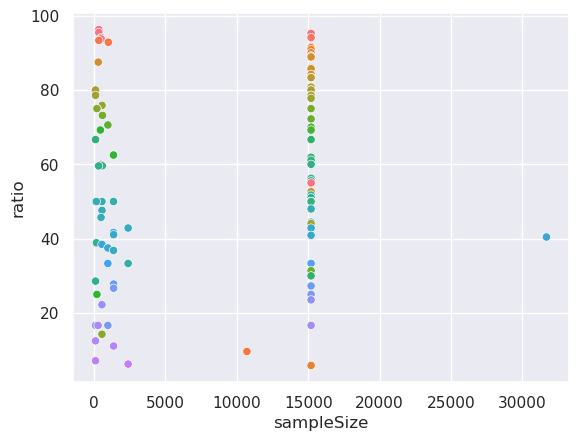

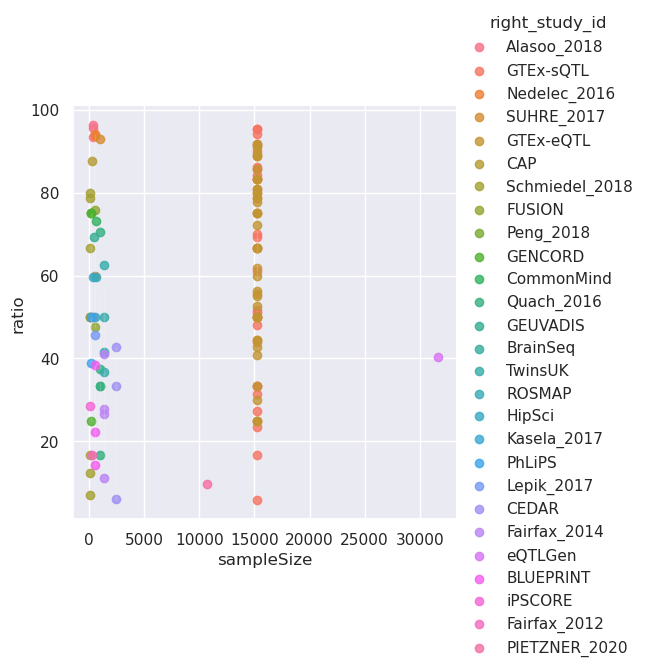

In [187]:
sns.set(font_scale=1)
sns.lmplot(
    coloc5Plot.dropna(subset=["ratio"]), x="sampleSize", y="ratio", hue="right_study_id"
)

In [149]:
coloc_bnch5.groupBy("right_study_id", "right_bio_feature").pivot(
    "coherency"
).count().drop("notEnough").withColumn(
    "ratio", F.col("coherent") / (F.col("coherent") + F.col("incoherent")) * 100
).sort(
    F.col("ratio").desc()
).groupBy(
    "right_study_id"
).pivot(
    "right_bio_feature"
).agg(
    F.first("ratio")
).show()

+----------------+-----------------+-----------------+--------------------+------------------------+-----------------+-----------------+-----------------+-----------------+-----------+------------+-----------------+-----------------+-----------------+--------------------+-----------------+-----------------------+----------------+-----------------+------+--------------+------------------------------------+---------------------------+---------------------------+----------------+----------------+------------------------+-----------------+------------------+-------------------------------------+---------------------------+------------------------------+----------------------+---------------------+------------------------+----------------+------------------------+----------------+--------------------------+---------------------------------+-----------------+----------------+-----------+-----------------------------------+------------------+--------------------+----+----------+--------------

<AxesSubplot:>

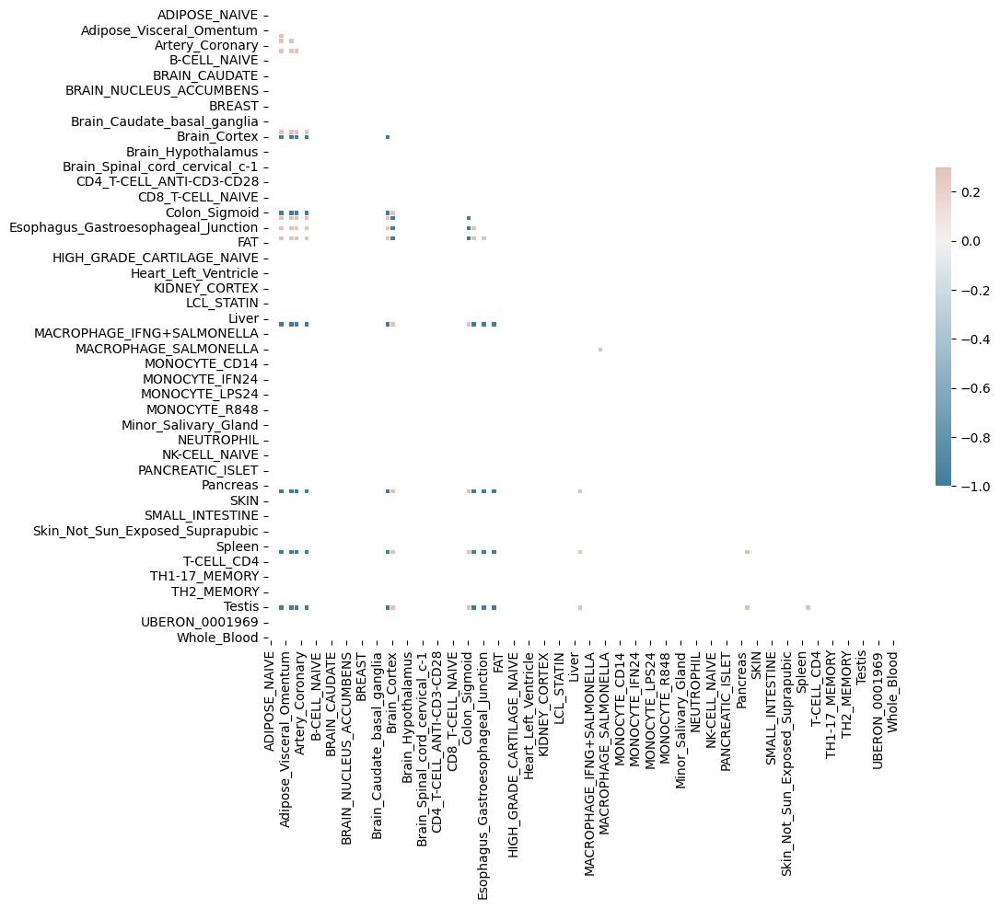

In [150]:
from string import ascii_letters
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

toPlot = (
    coloc_bnch5.groupBy("right_study_id", "right_bio_feature")
    .pivot("coherency")
    .count()
    .drop("notEnough")
    .withColumn(
        "ratio", F.col("coherent") / (F.col("coherent") + F.col("incoherent")) * 100
    )
    .sort(F.col("ratio").desc())
    .groupBy("right_study_id")
    .pivot("right_bio_feature")
    .agg(F.first("ratio"))
    .toPandas()
)

In [2]:
toPlot.set_index("right_study_id", inplace=True)

NameError: name 'toPlot' is not defined

In [155]:
toPlot

,ADIPOSE_NAIVE,ADIPOSE_VISCERAL,Adipose_Subcutaneous,Adipose_Visceral_Omentum,Adrenal_Gland,Artery_Aorta,Artery_Coronary,Artery_Tibial,B-CELL_CD19,B-CELL_NAIVE,...,TH2_MEMORY,TREG_MEMORY,TREG_NAIVE,Testis,Thyroid,UBERON_0000178,UBERON_0001969,Uterus,Vagina,Whole_Blood
right_study_id,,,,,,,,,,,,,,,,,,,,,
Fairfax_2014,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
CEDAR,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
ROSMAP,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Braineac2,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
GTEx-eQTL,NaN,77.777778,55.000000,NaN,52.631579,83.333333,85.714286,91.666667,NaN,NaN,...,NaN,NaN,NaN,55.555556,80.769231,NaN,NaN,NaN,50.0,NaN
van_de_Bunt_2015,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
HipSci,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Nedelec_2016,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
BrainSeq,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


<AxesSubplot:ylabel='right_study_id'>

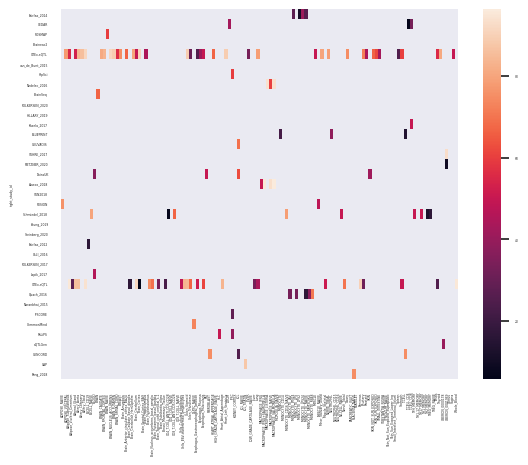

In [158]:
sns.set(font_scale=0.2)
sns.heatmap(toPlot)

In [1]:
#### corelation plot about coherency and
import seaborn as sns

sns.lmplot(
    data=coloc_bnch5.groupBy("right_study_id").pivot("Coherency").count().toPandas(),
    x="coherent",
    y="incoherent",
)

NameError: name 'coloc_bnch5' is not defined

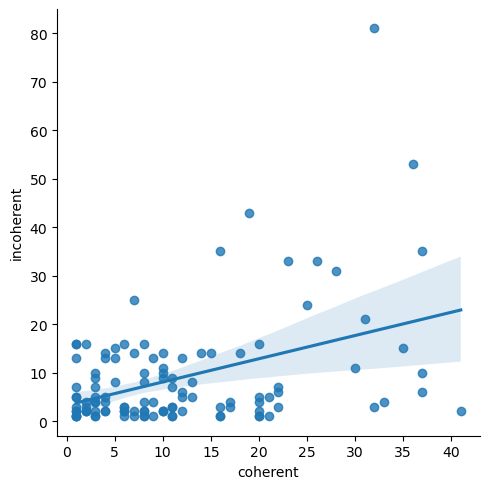

In [121]:
#### per tissue
sns.lmplot(
    data=coloc_bnch5.groupBy("right_bio_feature").pivot("Coherency").count().toPandas(),
    x="coherent",
    y="incoherent",
)

In [79]:
coloc_bnch2.join(
    two_assessments,
    on=[
        "right_study_id",
        "targetId",
        "diseaseId",
        "right_locus_id",
        "right_type",
        "right_bio_feature",
    ],
    how="left",
).filter(F.col("nr_difAss").isNull()).sort(
    F.col("targetId").desc(),
    F.col("diseaseId").desc(),
    F.col("right_bio_feature").desc(),
).count()

4182468

In [ ]:
).withColumn("Coherency",
        F.when(F.col("beta_assessed")=="gof",
            F.when(F.col("GoF_protectCh").isNotNull(), F.lit("coherent"))
            .when(F.col("LoF_protectCh").isNotNull(),F.lit("incoherent")))
        .when(F.col("beta_assessed")=="lof",
            F.when(F.col("GoF_protectCh").isNotNull(), F.lit("incoherent"))
            .when(F.col("LoF_protectCh").isNotNull(),F.lit("coherent")))
).groupBy("coherency").count().show()

In [137]:
column_check = "LoF_protectBN", "LoF_riskBN", "GoF_protectCh", "LoF_protectCh"

In [261]:
coloc_bnch3 = (
    coloc_bnch2.withColumn(
        "beta_assessed",
        F.when(F.col("beta_assessed") == "gof", F.lit("GoF")).when(
            F.col("beta_assessed") == "lof", F.lit("LoF")
        ),
    )
    .withColumn(
        "tendency",
        F.when(F.col("tendency") == "Risk", F.lit("risk")).when(
            F.col("tendency") == "Protect", F.lit("protect")
        ),
    )
    .withColumn("doeQtl", F.concat_ws("_", F.col("beta_assessed"), F.col("tendency")))
    .withColumn(
        "geneBurden",
        F.when(
            (F.col("LoF_protectBN").isNotNull()) & (F.col("doeQtl") == "LoF_protect"),
            F.lit("coherent"),
        )
        .when(
            (F.col("LoF_protectBN").isNotNull()) & (F.col("doeQtl") == "GoF_risk"),
            F.lit("coherent"),
        )
        .when(
            (F.col("LoF_riskBN").isNotNull()) & (F.col("doeQtl") == "LoF_risk"),
            F.lit("coherent"),
        )
        .when(
            (F.col("LoF_riskBN").isNotNull()) & (F.col("doeQtl") == "GoF_protect"),
            F.lit("coherent"),
        )
        .when(
            F.col("LoF_riskBN").isNull() & F.col("LoF_protectBN").isNull(), F.lit(None)
        )
        .otherwise(F.lit("uncoherent")),
    )
    .withColumn(
        "chembl",
        F.when(
            (F.col("LoF_protectCh").isNotNull()) & (F.col("doeQtl") == "LoF_protect"),
            F.lit("coherent"),
        )
        .when(
            (F.col("LoF_protectCh").isNotNull()) & (F.col("doeQtl") == "GoF_risk"),
            F.lit("coherent"),
        )
        .when(
            (F.col("GoF_protectCh").isNotNull()) & (F.col("doeQtl") == "LoF_risk"),
            F.lit("coherent"),
        )
        .when(
            (F.col("GoF_protectCh").isNotNull()) & (F.col("doeQtl") == "GoF_protect"),
            F.lit("coherent"),
        )
        .when(
            F.col("LoF_protectCh").isNull() & F.col("GoF_protectCh").isNull(),
            F.lit(None),
        )
        .otherwise(F.lit("uncoherent")),
    )
    .persist()
)
### remove coherency using diagonal
### remove study sample size

In [262]:
coloc_bnch3.filter(
    (F.col("LoF_protectBN").isNull()) & (F.col("LoF_riskBN").isNull())
).show()

+---------------+-----------+------------+----------------+--------------------+--------------------+--------------+--------------------+-------------------------+---------+----------+----------+-------------+--------------------+------------+-----+--------+-----+-------------+----------+-------------+-------------+--------+----------+------+
|       targetId|  diseaseId|     studyId|         locusId|   right_bio_feature|      right_locus_id|right_study_id|            coloc_h4|left_var_right_study_beta|left_type|right_type|is_flipped|beta_assessed|         therapyArea|         EFO|count|tendency|count|LoF_protectBN|LoF_riskBN|GoF_protectCh|LoF_protectCh|  doeQtl|geneBurden|chembl|
+---------------+-----------+------------+----------------+--------------------+--------------------+--------------+--------------------+-------------------------+---------+----------+----------+-------------+--------------------+------------+-----+--------+-----+-------------+----------+-------------+-------

In [263]:
coloc_bnch3.groupBy("geneBurden", "chembl").count().show()

+----------+----------+-------+
|geneBurden|    chembl|  count|
+----------+----------+-------+
|      null|      null|4153638|
|      null|uncoherent|   1508|
|uncoherent|      null|  11129|
|  coherent|      null|  14961|
|      null|  coherent|   2262|
|  coherent|  coherent|     41|
|  coherent|uncoherent|     19|
|uncoherent|uncoherent|     27|
+----------+----------+-------+



<AxesSubplot:xlabel='studySampleSize', ylabel='coherent'>

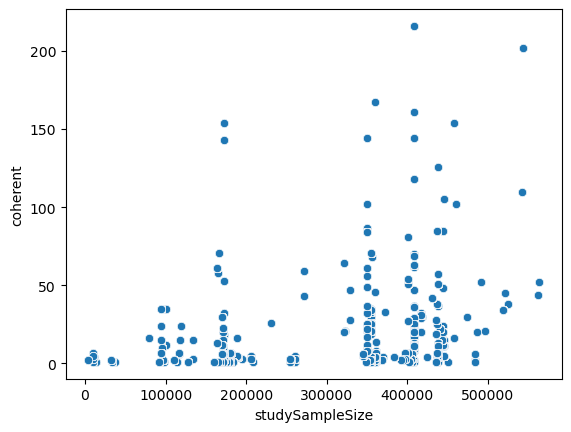

In [200]:
sns.scatterplot(data=scatterGB.toPandas(), x="studySampleSize", y="coherent")

<AxesSubplot:xlabel='studySampleSize', ylabel='uncoherent'>

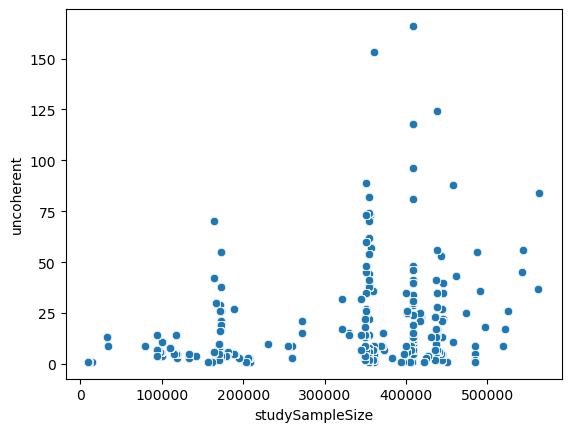

In [201]:
sns.scatterplot(data=scatterGB.toPandas(), x="studySampleSize", y="uncoherent")

In [163]:
scatterGB = (
    coloc_bnch3.groupBy("studyId")
    .pivot("geneBurden")
    .count()
    .join(sampleSize, on="studyId", how="left")
    .sort(F.col("studySampleSize").desc())
)
scatterGB2 = (
    coloc_bnch3.groupBy("studyId", "geneBurden")
    .count()
    .join(sampleSize, on="studyId", how="left")
    .sort(F.col("geneBurden").desc())
)

AnalysisException: Column 'geneBurden' does not exist. Did you mean one of the following? [tendency, left_type, Nr_targets, count, count, diseaseId, is_flipped, locusId, studyId, targetId, therapyArea, EFO, LoF_riskBN, coloc_h4, dif_assess, nr_difAss, right_type, sampleSize, beta_assessed, nr_difTargets, GoF_protectCh, LoF_protectBN, LoF_protectCh, right_locus_id, right_study_id, right_phenotype, right_bio_feature, left_var_right_study_beta];
'Project ['geneBurden]
+- Project [right_study_id#139251, targetId#139657, diseaseId#636, right_locus_id#139249, right_type#139109, right_bio_feature#139309, studyId#139623, locusId#139640, coloc_h4#139102, left_var_right_study_beta#139121, right_phenotype#139112, left_type#139103, is_flipped#139119, beta_assessed#139264, therapyArea#139189, EFO#139197, count#139341, tendency#4851, count#139616L, LoF_protectBN#145805L, LoF_riskBN#145810L, GoF_protectCh#143014L, LoF_protectCh#143009L, sampleSize#22986, ... 4 more fields]
   +- Join LeftOuter, ((((((right_study_id#139251 = right_study_id#149429) AND (targetId#139657 = targetId#149406)) AND (diseaseId#636 = diseaseId#149109)) AND (right_locus_id#139249 = right_locus_id#149427)) AND (right_type#139109 = right_type#148974)) AND (right_bio_feature#139309 = right_bio_feature#149424))
      :- Project [right_study_id#139251, targetId#139657, diseaseId#636, studyId#139623, locusId#139640, right_locus_id#139249, coloc_h4#139102, left_var_right_study_beta#139121, right_phenotype#139112, left_type#139103, right_type#139109, is_flipped#139119, beta_assessed#139264, therapyArea#139189, EFO#139197, right_bio_feature#139309, count#139341, tendency#4851, count#139616L, LoF_protectBN#145805L, LoF_riskBN#145810L, GoF_protectCh#143014L, LoF_protectCh#143009L, sampleSize#22986]
      :  +- Join LeftOuter, (right_study_id#139251 = right_study_id#22985)
      :     :- Project [targetId#139657, diseaseId#636, studyId#139623, locusId#139640, right_locus_id#139249, right_study_id#139251, coloc_h4#139102, left_var_right_study_beta#139121, right_phenotype#139112, left_type#139103, right_type#139109, is_flipped#139119, beta_assessed#139264, therapyArea#139189, EFO#139197, right_bio_feature#139309, count#139341, tendency#4851, count#139616L, LoF_protectBN#145805L, LoF_riskBN#145810L, GoF_protectCh#143014L, LoF_protectCh#143009L]
      :     :  +- Join LeftOuter, ((targetId#139657 = targetId#145974) AND (diseaseId#636 = diseaseId#146054))
      :     :     :- Project [targetId#139657, diseaseId#636, studyId#139623, locusId#139640, right_locus_id#139249, right_study_id#139251, coloc_h4#139102, left_var_right_study_beta#139121, right_phenotype#139112, left_type#139103, right_type#139109, is_flipped#139119, beta_assessed#139264, therapyArea#139189, EFO#139197, right_bio_feature#139309, count#139341, tendency#4851, count#139616L, LoF_protectBN#145805L, LoF_riskBN#145810L]
      :     :     :  +- Join LeftOuter, ((targetId#139657 = targetId#145824) AND (diseaseId#636 = diseaseId#145904))
      :     :     :     :- Project [studyId#139623, locusId#139640, targetId#139657, right_locus_id#139249, right_study_id#139251, coloc_h4#139102, left_var_right_study_beta#139121, right_phenotype#139112, left_type#139103, right_type#139109, is_flipped#139119, beta_assessed#139264, therapyArea#139189, EFO#139197, right_bio_feature#139309, count#139341, diseaseId#636, tendency#4851, count#139616L]
      :     :     :     :  +- Join LeftOuter, (((studyId#139623 = studyId#616) AND (locusId#139640 = locusId#139674)) AND (targetId#139657 = targetId#556))
      :     :     :     :     :- Project [locusId#139640, studyId#139623, right_gene_id#139120 AS targetId#139657, right_locus_id#139249, right_study_id#139251, coloc_h4#139102, left_var_right_study_beta#139121, right_phenotype#139112, left_type#139103, right_type#139109, is_flipped#139119, beta_assessed#139264, therapyArea#139189, EFO#139197, right_bio_feature#139309, count#139341]
      :     :     :     :     :  +- Project [left_locus_id#139248 AS locusId#139640, studyId#139623, right_gene_id#139120, right_locus_id#139249, right_study_id#139251, coloc_h4#139102, left_var_right_study_beta#139121, right_phenotype#139112, left_type#139103, right_type#139109, is_flipped#139119, beta_assessed#139264, therapyArea#139189, EFO#139197, right_bio_feature#139309, count#139341]
      :     :     :     :     :     +- Project [left_locus_id#139248, left_study_id#139250 AS studyId#139623, right_gene_id#139120, right_locus_id#139249, right_study_id#139251, coloc_h4#139102, left_var_right_study_beta#139121, right_phenotype#139112, left_type#139103, right_type#139109, is_flipped#139119, beta_assessed#139264, therapyArea#139189, EFO#139197, right_bio_feature#139309, count#139341]
      :     :     :     :     :        +- Project [left_locus_id#139248, left_study_id#139250, right_gene_id#139120, right_locus_id#139249, right_study_id#139251, coloc_h4#139102, left_var_right_study_beta#139121, right_phenotype#139112, left_type#139103, right_type#139109, is_flipped#139119, beta_assessed#139264, therapyArea#139189, EFO#139197, right_bio_feature#139309, count#139341]
      :     :     :     :     :           +- Join LeftOuter, (((left_locus_id#139248 = left_locus_id#139379) AND (left_study_id#139250 = left_study_id#139381)) AND (right_gene_id#139120 = right_gene_id#139369))
      :     :     :     :     :              :- Project [left_locus_id#139248, right_locus_id#139249, left_study_id#139250, right_study_id#139251, right_gene_id#139120, coloc_h4#139102, left_var_right_study_beta#139121, right_phenotype#139112, left_type#139103, right_type#139109, is_flipped#139119, beta_assessed#139264, therapyArea#139189, EFO#139197, right_bio_feature2#139206 AS right_bio_feature#139309]
      :     :     :     :     :              :  +- Project [left_locus_id#139248, right_locus_id#139249, left_study_id#139250, right_study_id#139251, right_gene_id#139120, coloc_h4#139102, left_var_right_study_beta#139121, right_phenotype#139112, left_type#139103, right_type#139109, is_flipped#139119, beta_assessed#139264, therapyArea#139189, EFO#139197, right_bio_feature2#139206]
      :     :     :     :     :              :     +- Project [right_bio_feature#139111, left_locus_id#139248, right_locus_id#139249, left_study_id#139250, right_study_id#139251, right_gene_id#139120, coloc_h4#139102, left_var_right_study_beta#139121, right_phenotype#139112, left_type#139103, right_type#139109, is_flipped#139119, beta_assessed#139264, therapyArea#139189, EFO#139197, right_bio_feature2#139206]
      :     :     :     :     :              :        +- Join LeftOuter, (right_bio_feature#139111 = right_bio_feature#139181)
      :     :     :     :     :              :           :- Project [left_locus_id#139248, right_locus_id#139249, left_study_id#139250, right_study_id#139251, right_gene_id#139120, coloc_h4#139102, left_var_right_study_beta#139121, right_phenotype#139112, left_type#139103, right_type#139109, right_bio_feature#139111, is_flipped#139119, CASE WHEN (left_var_right_study_beta#139121 > cast(0 as double)) THEN gof WHEN (left_var_right_study_beta#139121 < cast(0 as double)) THEN lof ELSE neutral END AS beta_assessed#139264]
      :     :     :     :     :              :           :  +- Project [concat_ws(_, left_chrom#139105, cast(left_pos#139106 as string), left_ref#139107, left_alt#139108) AS left_locus_id#139248, concat_ws(_, right_chrom#139113, cast(right_pos#139114 as string), right_ref#139115, right_alt#139116) AS right_locus_id#139249, left_study#139104 AS left_study_id#139250, right_study#139110 AS right_study_id#139251, right_gene_id#139120, coloc_h4#139102, left_var_right_study_beta#139121, right_phenotype#139112, left_type#139103, right_type#139109, right_bio_feature#139111, is_flipped#139119]
      :     :     :     :     :              :           :     +- Filter NOT (right_type#139109 = gwas)
      :     :     :     :     :              :           :        +- Relation [coloc_n_vars#139097,coloc_h0#139098,coloc_h1#139099,coloc_h2#139100,coloc_h3#139101,coloc_h4#139102,left_type#139103,left_study#139104,left_chrom#139105,left_pos#139106,left_ref#139107,left_alt#139108,right_type#139109,right_study#139110,right_bio_feature#139111,right_phenotype#139112,right_chrom#139113,right_pos#139114,right_ref#139115,right_alt#139116,coloc_h4_h3#139117,coloc_log2_h4_h3#139118,is_flipped#139119,right_gene_id#139120,... 4 more fields] parquet
      :     :     :     :     :              :           +- Project [right_bio_feature#139181, therapyArea#139189, EFO#139197, right_bio_feature2#139206]
      :     :     :     :     :              :              +- Project [original#139171, curated#139172, curated_simplified#139173, _c3#139174, _c4#139175, right_bio_feature#139181, therapyArea#139189, EFO#139197, split(curated_simplified#139173,  - , -1)[0] AS right_bio_feature2#139206]
      :     :     :     :     :              :                 +- Project [original#139171, curated#139172, curated_simplified#139173, _c3#139174, _c4#139175, right_bio_feature#139181, therapyArea#139189, split(curated_simplified#139173,  - , -1)[1] AS EFO#139197]
      :     :     :     :     :              :                    +- Project [original#139171, curated#139172, curated_simplified#139173, _c3#139174, _c4#139175, right_bio_feature#139181, split(curated_simplified#139173,  - , -1)[2] AS therapyArea#139189]
      :     :     :     :     :              :                       +- Project [original#139171, curated#139172, curated_simplified#139173, _c3#139174, _c4#139175, split(original#139171,  - , -1)[0] AS right_bio_feature#139181]
      :     :     :     :     :              :                          +- Relation [original#139171,curated#139172,curated_simplified#139173,_c3#139174,_c4#139175] csv
      :     :     :     :     :              +- Aggregate [left_locus_id#139379, left_study_id#139381, right_gene_id#139369], [left_locus_id#139379, left_study_id#139381, right_gene_id#139369, size(collect_set(beta_assessed#139264, 0, 0), true) AS count#139341]
      :     :     :     :     :                 +- Project [left_locus_id#139379, right_locus_id#139380, left_study_id#139381, right_study_id#139382, right_gene_id#139369, coloc_h4#139351, left_var_right_study_beta#139370, right_phenotype#139361, left_type#139352, right_type#139358, is_flipped#139368, beta_assessed#139264, therapyArea#139189, EFO#139197, right_bio_feature2#139206 AS right_bio_feature#139309]
      :     :     :     :     :                    +- Project [left_locus_id#139379, right_locus_id#139380, left_study_id#139381, right_study_id#139382, right_gene_id#139369, coloc_h4#139351, left_var_right_study_beta#139370, right_phenotype#139361, left_type#139352, right_type#139358, is_flipped#139368, beta_assessed#139264, therapyArea#139189, EFO#139197, right_bio_feature2#139206]
      :     :     :     :     :                       +- Project [right_bio_feature#139360, left_locus_id#139379, right_locus_id#139380, left_study_id#139381, right_study_id#139382, right_gene_id#139369, coloc_h4#139351, left_var_right_study_beta#139370, right_phenotype#139361, left_type#139352, right_type#139358, is_flipped#139368, beta_assessed#139264, therapyArea#139189, EFO#139197, right_bio_feature2#139206]
      :     :     :     :     :                          +- Join LeftOuter, (right_bio_feature#139360 = right_bio_feature#139181)
      :     :     :     :     :                             :- Project [left_locus_id#139379, right_locus_id#139380, left_study_id#139381, right_study_id#139382, right_gene_id#139369, coloc_h4#139351, left_var_right_study_beta#139370, right_phenotype#139361, left_type#139352, right_type#139358, right_bio_feature#139360, is_flipped#139368, CASE WHEN (left_var_right_study_beta#139370 > cast(0 as double)) THEN gof WHEN (left_var_right_study_beta#139370 < cast(0 as double)) THEN lof ELSE neutral END AS beta_assessed#139264]
      :     :     :     :     :                             :  +- Project [concat_ws(_, left_chrom#139354, cast(left_pos#139355 as string), left_ref#139356, left_alt#139357) AS left_locus_id#139379, concat_ws(_, right_chrom#139362, cast(right_pos#139363 as string), right_ref#139364, right_alt#139365) AS right_locus_id#139380, left_study#139353 AS left_study_id#139381, right_study#139359 AS right_study_id#139382, right_gene_id#139369, coloc_h4#139351, left_var_right_study_beta#139370, right_phenotype#139361, left_type#139352, right_type#139358, right_bio_feature#139360, is_flipped#139368]
      :     :     :     :     :                             :     +- Filter NOT (right_type#139358 = gwas)
      :     :     :     :     :                             :        +- Relation [coloc_n_vars#139346,coloc_h0#139347,coloc_h1#139348,coloc_h2#139349,coloc_h3#139350,coloc_h4#139351,left_type#139352,left_study#139353,left_chrom#139354,left_pos#139355,left_ref#139356,left_alt#139357,right_type#139358,right_study#139359,right_bio_feature#139360,right_phenotype#139361,right_chrom#139362,right_pos#139363,right_ref#139364,right_alt#139365,coloc_h4_h3#139366,coloc_log2_h4_h3#139367,is_flipped#139368,right_gene_id#139369,... 4 more fields] parquet
      :     :     :     :     :                             +- Project [right_bio_feature#139181, therapyArea#139189, EFO#139197, right_bio_feature2#139206]
      :     :     :     :     :                                +- Project [original#139374, curated#139375, curated_simplified#139376, _c3#139377, _c4#139378, right_bio_feature#139181, therapyArea#139189, EFO#139197, split(curated_simplified#139376,  - , -1)[0] AS right_bio_feature2#139206]
      :     :     :     :     :                                   +- Project [original#139374, curated#139375, curated_simplified#139376, _c3#139377, _c4#139378, right_bio_feature#139181, therapyArea#139189, split(curated_simplified#139376,  - , -1)[1] AS EFO#139197]
      :     :     :     :     :                                      +- Project [original#139374, curated#139375, curated_simplified#139376, _c3#139377, _c4#139378, right_bio_feature#139181, split(curated_simplified#139376,  - , -1)[2] AS therapyArea#139189]
      :     :     :     :     :                                         +- Project [original#139374, curated#139375, curated_simplified#139376, _c3#139377, _c4#139378, split(original#139374,  - , -1)[0] AS right_bio_feature#139181]
      :     :     :     :     :                                            +- Relation [original#139374,curated#139375,curated_simplified#139376,_c3#139377,_c4#139378] csv
      :     :     :     :     +- Project [targetId#556, diseaseId#636, variantId#634 AS locusId#139674, studyId#616, tendency#4851, count#139616L]
      :     :     :     :        +- Aggregate [targetId#556, diseaseId#636, variantId#634, studyId#616, tendency#4851], [targetId#556, diseaseId#636, variantId#634, studyId#616, tendency#4851, count(1) AS count#139616L]
      :     :     :     :           +- Filter datasourceId#555 IN (ot_genetics_portal)
      :     :     :     :              +- Project [datasourceId#555, targetId#556, alleleOrigins#557, allelicRequirements#558, ancestry#559, ancestryId#560, beta#3526, betaConfidenceIntervalLower#562, betaConfidenceIntervalUpper#563, biologicalModelAllelicComposition#564, biologicalModelGeneticBackground#565, biologicalModelId#566, biomarkerName#567, biomarkers#568, biosamplesFromSource#569, cellType#570, clinicalPhase#571, clinicalSignificances#3698, clinicalStatus#573, cohortDescription#574, cohortId#575, cohortPhenotypes#576, cohortShortName#577, confidence#578, ... 82 more fields]
      :     :     :     :                 +- Project [datasourceId#555, targetId#556, alleleOrigins#557, allelicRequirements#558, ancestry#559, ancestryId#560, beta#3526, betaConfidenceIntervalLower#562, betaConfidenceIntervalUpper#563, biologicalModelAllelicComposition#564, biologicalModelGeneticBackground#565, biologicalModelId#566, biomarkerName#567, biomarkers#568, biosamplesFromSource#569, cellType#570, clinicalPhase#571, clinicalSignificances#3698, clinicalStatus#573, cohortDescription#574, cohortId#575, cohortPhenotypes#576, cohortShortName#577, confidence#578, ... 81 more fields]
      :     :     :     :                    +- Project [datasourceId#555, targetId#556, alleleOrigins#557, allelicRequirements#558, ancestry#559, ancestryId#560, beta#3526, betaConfidenceIntervalLower#562, betaConfidenceIntervalUpper#563, biologicalModelAllelicComposition#564, biologicalModelGeneticBackground#565, biologicalModelId#566, biomarkerName#567, biomarkers#568, biosamplesFromSource#569, cellType#570, clinicalPhase#571, clinicalSignificances#3698, clinicalStatus#573, cohortDescription#574, cohortId#575, cohortPhenotypes#576, cohortShortName#577, confidence#578, ... 80 more fields]
      :     :     :     :                       +- Project [datasourceId#555, targetId#556, alleleOrigins#557, allelicRequirements#558, ancestry#559, ancestryId#560, beta#3526, betaConfidenceIntervalLower#562, betaConfidenceIntervalUpper#563, biologicalModelAllelicComposition#564, biologicalModelGeneticBackground#565, biologicalModelId#566, biomarkerName#567, biomarkers#568, biosamplesFromSource#569, cellType#570, clinicalPhase#571, clinicalSignificances#3698, clinicalStatus#573, cohortDescription#574, cohortId#575, cohortPhenotypes#576, cohortShortName#577, confidence#578, ... 79 more fields]
      :     :     :     :                          +- Join LeftOuter, ((drugId2#3434 = drugId#589) AND (targetId2#3440 = targetId#556))
      :     :     :     :                             :- Join LeftOuter, (stMethod#3386 = statisticalMethodOverview#612)
      :     :     :     :                             :  :- Join LeftOuter, (target_id#3422 = targetId#556)
      :     :     :     :                             :  :  :- Project [datasourceId#555, targetId#556, alleleOrigins#557, allelicRequirements#558, ancestry#559, ancestryId#560, beta#3526, betaConfidenceIntervalLower#562, betaConfidenceIntervalUpper#563, biologicalModelAllelicComposition#564, biologicalModelGeneticBackground#565, biologicalModelId#566, biomarkerName#567, biomarkers#568, biosamplesFromSource#569, cellType#570, clinicalPhase#571, clinicalSignificances#3698, clinicalStatus#573, cohortDescription#574, cohortId#575, cohortPhenotypes#576, cohortShortName#577, confidence#578, ... 64 more fields]
      :     :     :     :                             :  :  :  +- Project [datasourceId#555, targetId#556, alleleOrigins#557, allelicRequirements#558, ancestry#559, ancestryId#560, beta#3526, betaConfidenceIntervalLower#562, betaConfidenceIntervalUpper#563, biologicalModelAllelicComposition#564, biologicalModelGeneticBackground#565, biologicalModelId#566, biomarkerName#567, biomarkers#568, biosamplesFromSource#569, cellType#570, clinicalPhase#571, clinicalSignificances#3698, clinicalStatus#573, cohortDescription#574, cohortId#575, cohortPhenotypes#576, cohortShortName#577, confidence#578, ... 67 more fields]
      :     :     :     :                             :  :  :     +- Window [collect_set(_w0#3963, 0, 0) windowspecdefinition(targetId#556, diseaseId#636, _w1#3964 DESC NULLS LAST, specifiedwindowframe(RangeFrame, unboundedpreceding$(), currentrow$())) AS _we0#3965], [targetId#556, diseaseId#636], [_w1#3964 DESC NULLS LAST]
      :     :     :     :                             :  :  :        +- Project [datasourceId#555, targetId#556, alleleOrigins#557, allelicRequirements#558, ancestry#559, ancestryId#560, beta#3526, betaConfidenceIntervalLower#562, betaConfidenceIntervalUpper#563, biologicalModelAllelicComposition#564, biologicalModelGeneticBackground#565, biologicalModelId#566, biomarkerName#567, biomarkers#568, biosamplesFromSource#569, cellType#570, clinicalPhase#571, clinicalSignificances#3698, clinicalStatus#573, cohortDescription#574, cohortId#575, cohortPhenotypes#576, cohortShortName#577, confidence#578, ... 65 more fields]
      :     :     :     :                             :  :  :           +- Project [datasourceId#555, targetId#556, alleleOrigins#557, allelicRequirements#558, ancestry#559, ancestryId#560, beta#3526, betaConfidenceIntervalLower#562, betaConfidenceIntervalUpper#563, biologicalModelAllelicComposition#564, biologicalModelGeneticBackground#565, biologicalModelId#566, biomarkerName#567, biomarkers#568, biosamplesFromSource#569, cellType#570, clinicalPhase#571, clinicalSignificances#3698, clinicalStatus#573, cohortDescription#574, cohortId#575, cohortPhenotypes#576, cohortShortName#577, confidence#578, ... 63 more fields]
      :     :     :     :                             :  :  :              +- Project [datasourceId#555, targetId#556, alleleOrigins#557, allelicRequirements#558, ancestry#559, ancestryId#560, beta#3526, betaConfidenceIntervalLower#562, betaConfidenceIntervalUpper#563, biologicalModelAllelicComposition#564, biologicalModelGeneticBackground#565, biologicalModelId#566, biomarkerName#567, biomarkers#568, biosamplesFromSource#569, cellType#570, clinicalPhase#571, clinicalSignificances#3698, clinicalStatus#573, cohortDescription#574, cohortId#575, cohortPhenotypes#576, cohortShortName#577, confidence#578, ... 62 more fields]
      :     :     :     :                             :  :  :                 +- Project [datasourceId#555, targetId#556, alleleOrigins#557, allelicRequirements#558, ancestry#559, ancestryId#560, beta#3526, betaConfidenceIntervalLower#562, betaConfidenceIntervalUpper#563, biologicalModelAllelicComposition#564, biologicalModelGeneticBackground#565, biologicalModelId#566, biomarkerName#567, biomarkers#568, biosamplesFromSource#569, cellType#570, clinicalPhase#571, concat_ws(,, clinicalSignificances#572) AS clinicalSignificances#3698, clinicalStatus#573, cohortDescription#574, cohortId#575, cohortPhenotypes#576, cohortShortName#577, confidence#578, ... 61 more fields]
      :     :     :     :                             :  :  :                    +- Project [datasourceId#555, targetId#556, alleleOrigins#557, allelicRequirements#558, ancestry#559, ancestryId#560, beta#3526, betaConfidenceIntervalLower#562, betaConfidenceIntervalUpper#563, biologicalModelAllelicComposition#564, biologicalModelGeneticBackground#565, biologicalModelId#566, biomarkerName#567, biomarkers#568, biosamplesFromSource#569, cellType#570, clinicalPhase#571, clinicalSignificances#572, clinicalStatus#573, cohortDescription#574, cohortId#575, cohortPhenotypes#576, cohortShortName#577, confidence#578, ... 61 more fields]
      :     :     :     :                             :  :  :                       +- Project [datasourceId#555, targetId#556, alleleOrigins#557, allelicRequirements#558, ancestry#559, ancestryId#560, cast(beta#561 as float) AS beta#3526, betaConfidenceIntervalLower#562, betaConfidenceIntervalUpper#563, biologicalModelAllelicComposition#564, biologicalModelGeneticBackground#565, biologicalModelId#566, biomarkerName#567, biomarkers#568, biosamplesFromSource#569, cellType#570, clinicalPhase#571, clinicalSignificances#572, clinicalStatus#573, cohortDescription#574, cohortId#575, cohortPhenotypes#576, cohortShortName#577, confidence#578, ... 61 more fields]
      :     :     :     :                             :  :  :                          +- Filter datasourceId#555 IN (ot_genetics_portal,gene_burden,eva,eva_somatic,gene2phenotype,orphanet,cancer_gene_census,intogen,impc,chembl)
      :     :     :     :                             :  :  :                             +- Relation [datasourceId#555,targetId#556,alleleOrigins#557,allelicRequirements#558,ancestry#559,ancestryId#560,beta#561,betaConfidenceIntervalLower#562,betaConfidenceIntervalUpper#563,biologicalModelAllelicComposition#564,biologicalModelGeneticBackground#565,biologicalModelId#566,biomarkerName#567,biomarkers#568,biosamplesFromSource#569,cellType#570,clinicalPhase#571,clinicalSignificances#572,clinicalStatus#573,cohortDescription#574,cohortId#575,cohortPhenotypes#576,cohortShortName#577,confidence#578,... 61 more fields] parquet
      :     :     :     :                             :  :  +- Project [id#3248 AS target_id#3422, approvedSymbol#3249, description#3407, description_splited#3411, TSorOncogene#3416]
      :     :     :     :                             :  :     +- Project [id#3248, approvedSymbol#3249, description#3407, description_splited#3411, CASE WHEN (RLIKE(description_splited#3411, ncogene) AND RLIKE(description_splited#3411, TSG)) THEN bivalent WHEN RLIKE(description_splited#3411, ncogene(\s|$)) THEN oncogene WHEN RLIKE(description_splited#3411, TSG(\s|$)) THEN TSG ELSE noEvaluable END AS TSorOncogene#3416]
      :     :     :     :                             :  :        +- Project [id#3248, approvedSymbol#3249, description#3407, concat_ws(,, description#3407) AS description_splited#3411]
      :     :     :     :                             :  :           +- Aggregate [id#3248, approvedSymbol#3249], [id#3248, approvedSymbol#3249, collect_set(description#3399, 0, 0) AS description#3407]
      :     :     :     :                             :  :              +- Filter description#3399 IN (TSG,oncogene,Oncogene,oncogene,oncogene,TSG,TSG,oncogene,fusion,oncogene,oncogene,fusion)
      :     :     :     :                             :  :                 +- Project [id#3248, approvedSymbol#3249, col#3394.description AS description#3399]
      :     :     :     :                             :  :                    +- Project [id#3248, approvedSymbol#3249, col#3394]
      :     :     :     :                             :  :                       +- Generate explode(hallmarks#3258.attributes), true, [col#3394]
      :     :     :     :                             :  :                          +- Relation [id#3248,approvedSymbol#3249,biotype#3250,transcriptIds#3251,canonicalTranscript#3252,canonicalExons#3253,genomicLocation#3254,alternativeGenes#3255,approvedName#3256,go#3257,hallmarks#3258,synonyms#3259,symbolSynonyms#3260,nameSynonyms#3261,functionDescriptions#3262,subcellularLocations#3263,targetClass#3264,obsoleteSymbols#3265,obsoleteNames#3266,constraint#3267,tep#3268,proteinIds#3269,dbXrefs#3270,chemicalProbes#3271,... 4 more fields] parquet
      :     :     :     :                             :  +- Project [_c0#3376, statisticalMethodOverview#3377 AS stMethod#3386, count#3378, comment#3379, whatToDo#3380]
      :     :     :     :                             :     +- Relation [_c0#3376,statisticalMethodOverview#3377,count#3378,comment#3379,whatToDo#3380] csv
      :     :     :     :                             +- Deduplicate [targetId2#3440, drugId2#3434, actionType#3345, mechanismOfAction#3346]
      :     :     :     :                                +- Project [targetId2#3440, drugId2#3434, actionType#3345, mechanismOfAction#3346]
      :     :     :     :                                   +- Generate explode(targets#3350), true, [targetId2#3440]
      :     :     :     :                                      +- Project [drugId2#3434, actionType#3345, mechanismOfAction#3346, targets#3350]
      :     :     :     :                                         +- Generate explode(chemblIds#3347), true, [drugId2#3434]
      :     :     :     :                                            +- Project [chemblIds#3347, actionType#3345, mechanismOfAction#3346, targets#3350]
      :     :     :     :                                               +- Relation [actionType#3345,mechanismOfAction#3346,chemblIds#3347,targetName#3348,targetType#3349,targets#3350,references#3351] parquet
      :     :     :     +- Project [targetId#145824, diseaseId#145904, LoF_protectBN#145805L, LoF_risk#145796L AS LoF_riskBN#145810L]
      :     :     :        +- Project [targetId#145824, diseaseId#145904, LoF_protect#145795L AS LoF_protectBN#145805L, LoF_risk#145796L]
      :     :     :           +- Project [targetId#145824, diseaseId#145904, __pivot_count(1) AS count AS `count(1) AS count`#145794[0] AS LoF_protect#145795L, __pivot_count(1) AS count AS `count(1) AS count`#145794[1] AS LoF_risk#145796L]
      :     :     :              +- Aggregate [targetId#145824, diseaseId#145904], [targetId#145824, diseaseId#145904, pivotfirst(homogenized#4746, count(1) AS count#145788L, LoF_protect, LoF_risk, 0, 0) AS __pivot_count(1) AS count AS `count(1) AS count`#145794]
      :     :     :                 +- Aggregate [targetId#145824, diseaseId#145904, homogenized#4746], [targetId#145824, diseaseId#145904, homogenized#4746, count(1) AS count(1) AS count#145788L]
      :     :     :                    +- Filter (datasourceId#145823 IN (gene_burden) AND (homogenized#4746 IN (noEvaluable,dispar) = false))
      :     :     :                       +- Project [datasourceId#145823, targetId#145824, alleleOrigins#145825, allelicRequirements#145826, ancestry#145827, ancestryId#145828, beta#3526, betaConfidenceIntervalLower#145830, betaConfidenceIntervalUpper#145831, biologicalModelAllelicComposition#145832, biologicalModelGeneticBackground#145833, biologicalModelId#145834, biomarkerName#145835, biomarkers#145836, biosamplesFromSource#145837, cellType#145838, clinicalPhase#145839, clinicalSignificances#3698, clinicalStatus#145841, cohortDescription#145842, cohortId#145843, cohortPhenotypes#145844, cohortShortName#145845, confidence#145846, ... 82 more fields]
      :     :     :                          +- Project [datasourceId#145823, targetId#145824, alleleOrigins#145825, allelicRequirements#145826, ancestry#145827, ancestryId#145828, beta#3526, betaConfidenceIntervalLower#145830, betaConfidenceIntervalUpper#145831, biologicalModelAllelicComposition#145832, biologicalModelGeneticBackground#145833, biologicalModelId#145834, biomarkerName#145835, biomarkers#145836, biosamplesFromSource#145837, cellType#145838, clinicalPhase#145839, clinicalSignificances#3698, clinicalStatus#145841, cohortDescription#145842, cohortId#145843, cohortPhenotypes#145844, cohortShortName#145845, confidence#145846, ... 81 more fields]
      :     :     :                             +- Project [datasourceId#145823, targetId#145824, alleleOrigins#145825, allelicRequirements#145826, ancestry#145827, ancestryId#145828, beta#3526, betaConfidenceIntervalLower#145830, betaConfidenceIntervalUpper#145831, biologicalModelAllelicComposition#145832, biologicalModelGeneticBackground#145833, biologicalModelId#145834, biomarkerName#145835, biomarkers#145836, biosamplesFromSource#145837, cellType#145838, clinicalPhase#145839, clinicalSignificances#3698, clinicalStatus#145841, cohortDescription#145842, cohortId#145843, cohortPhenotypes#145844, cohortShortName#145845, confidence#145846, ... 80 more fields]
      :     :     :                                +- Project [datasourceId#145823, targetId#145824, alleleOrigins#145825, allelicRequirements#145826, ancestry#145827, ancestryId#145828, beta#3526, betaConfidenceIntervalLower#145830, betaConfidenceIntervalUpper#145831, biologicalModelAllelicComposition#145832, biologicalModelGeneticBackground#145833, biologicalModelId#145834, biomarkerName#145835, biomarkers#145836, biosamplesFromSource#145837, cellType#145838, clinicalPhase#145839, clinicalSignificances#3698, clinicalStatus#145841, cohortDescription#145842, cohortId#145843, cohortPhenotypes#145844, cohortShortName#145845, confidence#145846, ... 79 more fields]
      :     :     :                                   +- Join LeftOuter, ((drugId2#3434 = drugId#145857) AND (targetId2#3440 = targetId#145824))
      :     :     :                                      :- Join LeftOuter, (stMethod#3386 = statisticalMethodOverview#145880)
      :     :     :                                      :  :- Join LeftOuter, (target_id#3422 = targetId#145824)
      :     :     :                                      :  :  :- Project [datasourceId#145823, targetId#145824, alleleOrigins#145825, allelicRequirements#145826, ancestry#145827, ancestryId#145828, beta#3526, betaConfidenceIntervalLower#145830, betaConfidenceIntervalUpper#145831, biologicalModelAllelicComposition#145832, biologicalModelGeneticBackground#145833, biologicalModelId#145834, biomarkerName#145835, biomarkers#145836, biosamplesFromSource#145837, cellType#145838, clinicalPhase#145839, clinicalSignificances#3698, clinicalStatus#145841, cohortDescription#145842, cohortId#145843, cohortPhenotypes#145844, cohortShortName#145845, confidence#145846, ... 64 more fields]
      :     :     :                                      :  :  :  +- Project [datasourceId#145823, targetId#145824, alleleOrigins#145825, allelicRequirements#145826, ancestry#145827, ancestryId#145828, beta#3526, betaConfidenceIntervalLower#145830, betaConfidenceIntervalUpper#145831, biologicalModelAllelicComposition#145832, biologicalModelGeneticBackground#145833, biologicalModelId#145834, biomarkerName#145835, biomarkers#145836, biosamplesFromSource#145837, cellType#145838, clinicalPhase#145839, clinicalSignificances#3698, clinicalStatus#145841, cohortDescription#145842, cohortId#145843, cohortPhenotypes#145844, cohortShortName#145845, confidence#145846, ... 67 more fields]
      :     :     :                                      :  :  :     +- Window [collect_set(_w0#3963, 0, 0) windowspecdefinition(targetId#145824, diseaseId#145904, _w1#3964 DESC NULLS LAST, specifiedwindowframe(RangeFrame, unboundedpreceding$(), currentrow$())) AS _we0#3965], [targetId#145824, diseaseId#145904], [_w1#3964 DESC NULLS LAST]
      :     :     :                                      :  :  :        +- Project [datasourceId#145823, targetId#145824, alleleOrigins#145825, allelicRequirements#145826, ancestry#145827, ancestryId#145828, beta#3526, betaConfidenceIntervalLower#145830, betaConfidenceIntervalUpper#145831, biologicalModelAllelicComposition#145832, biologicalModelGeneticBackground#145833, biologicalModelId#145834, biomarkerName#145835, biomarkers#145836, biosamplesFromSource#145837, cellType#145838, clinicalPhase#145839, clinicalSignificances#3698, clinicalStatus#145841, cohortDescription#145842, cohortId#145843, cohortPhenotypes#145844, cohortShortName#145845, confidence#145846, ... 65 more fields]
      :     :     :                                      :  :  :           +- Project [datasourceId#145823, targetId#145824, alleleOrigins#145825, allelicRequirements#145826, ancestry#145827, ancestryId#145828, beta#3526, betaConfidenceIntervalLower#145830, betaConfidenceIntervalUpper#145831, biologicalModelAllelicComposition#145832, biologicalModelGeneticBackground#145833, biologicalModelId#145834, biomarkerName#145835, biomarkers#145836, biosamplesFromSource#145837, cellType#145838, clinicalPhase#145839, clinicalSignificances#3698, clinicalStatus#145841, cohortDescription#145842, cohortId#145843, cohortPhenotypes#145844, cohortShortName#145845, confidence#145846, ... 63 more fields]
      :     :     :                                      :  :  :              +- Project [datasourceId#145823, targetId#145824, alleleOrigins#145825, allelicRequirements#145826, ancestry#145827, ancestryId#145828, beta#3526, betaConfidenceIntervalLower#145830, betaConfidenceIntervalUpper#145831, biologicalModelAllelicComposition#145832, biologicalModelGeneticBackground#145833, biologicalModelId#145834, biomarkerName#145835, biomarkers#145836, biosamplesFromSource#145837, cellType#145838, clinicalPhase#145839, clinicalSignificances#3698, clinicalStatus#145841, cohortDescription#145842, cohortId#145843, cohortPhenotypes#145844, cohortShortName#145845, confidence#145846, ... 62 more fields]
      :     :     :                                      :  :  :                 +- Project [datasourceId#145823, targetId#145824, alleleOrigins#145825, allelicRequirements#145826, ancestry#145827, ancestryId#145828, beta#3526, betaConfidenceIntervalLower#145830, betaConfidenceIntervalUpper#145831, biologicalModelAllelicComposition#145832, biologicalModelGeneticBackground#145833, biologicalModelId#145834, biomarkerName#145835, biomarkers#145836, biosamplesFromSource#145837, cellType#145838, clinicalPhase#145839, concat_ws(,, clinicalSignificances#145840) AS clinicalSignificances#3698, clinicalStatus#145841, cohortDescription#145842, cohortId#145843, cohortPhenotypes#145844, cohortShortName#145845, confidence#145846, ... 61 more fields]
      :     :     :                                      :  :  :                    +- Project [datasourceId#145823, targetId#145824, alleleOrigins#145825, allelicRequirements#145826, ancestry#145827, ancestryId#145828, beta#3526, betaConfidenceIntervalLower#145830, betaConfidenceIntervalUpper#145831, biologicalModelAllelicComposition#145832, biologicalModelGeneticBackground#145833, biologicalModelId#145834, biomarkerName#145835, biomarkers#145836, biosamplesFromSource#145837, cellType#145838, clinicalPhase#145839, clinicalSignificances#145840, clinicalStatus#145841, cohortDescription#145842, cohortId#145843, cohortPhenotypes#145844, cohortShortName#145845, confidence#145846, ... 61 more fields]
      :     :     :                                      :  :  :                       +- Project [datasourceId#145823, targetId#145824, alleleOrigins#145825, allelicRequirements#145826, ancestry#145827, ancestryId#145828, cast(beta#145829 as float) AS beta#3526, betaConfidenceIntervalLower#145830, betaConfidenceIntervalUpper#145831, biologicalModelAllelicComposition#145832, biologicalModelGeneticBackground#145833, biologicalModelId#145834, biomarkerName#145835, biomarkers#145836, biosamplesFromSource#145837, cellType#145838, clinicalPhase#145839, clinicalSignificances#145840, clinicalStatus#145841, cohortDescription#145842, cohortId#145843, cohortPhenotypes#145844, cohortShortName#145845, confidence#145846, ... 61 more fields]
      :     :     :                                      :  :  :                          +- Filter datasourceId#145823 IN (ot_genetics_portal,gene_burden,eva,eva_somatic,gene2phenotype,orphanet,cancer_gene_census,intogen,impc,chembl)
      :     :     :                                      :  :  :                             +- Relation [datasourceId#145823,targetId#145824,alleleOrigins#145825,allelicRequirements#145826,ancestry#145827,ancestryId#145828,beta#145829,betaConfidenceIntervalLower#145830,betaConfidenceIntervalUpper#145831,biologicalModelAllelicComposition#145832,biologicalModelGeneticBackground#145833,biologicalModelId#145834,biomarkerName#145835,biomarkers#145836,biosamplesFromSource#145837,cellType#145838,clinicalPhase#145839,clinicalSignificances#145840,clinicalStatus#145841,cohortDescription#145842,cohortId#145843,cohortPhenotypes#145844,cohortShortName#145845,confidence#145846,... 61 more fields] parquet
      :     :     :                                      :  :  +- Project [id#145908 AS target_id#3422, approvedSymbol#145909, description#3407, description_splited#3411, TSorOncogene#3416]
      :     :     :                                      :  :     +- Project [id#145908, approvedSymbol#145909, description#3407, description_splited#3411, CASE WHEN (RLIKE(description_splited#3411, ncogene) AND RLIKE(description_splited#3411, TSG)) THEN bivalent WHEN RLIKE(description_splited#3411, ncogene(\s|$)) THEN oncogene WHEN RLIKE(description_splited#3411, TSG(\s|$)) THEN TSG ELSE noEvaluable END AS TSorOncogene#3416]
      :     :     :                                      :  :        +- Project [id#145908, approvedSymbol#145909, description#3407, concat_ws(,, description#3407) AS description_splited#3411]
      :     :     :                                      :  :           +- Aggregate [id#145908, approvedSymbol#145909], [id#145908, approvedSymbol#145909, collect_set(description#3399, 0, 0) AS description#3407]
      :     :     :                                      :  :              +- Filter description#3399 IN (TSG,oncogene,Oncogene,oncogene,oncogene,TSG,TSG,oncogene,fusion,oncogene,oncogene,fusion)
      :     :     :                                      :  :                 +- Project [id#145908, approvedSymbol#145909, col#3394.description AS description#3399]
      :     :     :                                      :  :                    +- Project [id#145908, approvedSymbol#145909, col#3394]
      :     :     :                                      :  :                       +- Generate explode(hallmarks#145918.attributes), true, [col#3394]
      :     :     :                                      :  :                          +- Relation [id#145908,approvedSymbol#145909,biotype#145910,transcriptIds#145911,canonicalTranscript#145912,canonicalExons#145913,genomicLocation#145914,alternativeGenes#145915,approvedName#145916,go#145917,hallmarks#145918,synonyms#145919,symbolSynonyms#145920,nameSynonyms#145921,functionDescriptions#145922,subcellularLocations#145923,targetClass#145924,obsoleteSymbols#145925,obsoleteNames#145926,constraint#145927,tep#145928,proteinIds#145929,dbXrefs#145930,chemicalProbes#145931,... 4 more fields] parquet
      :     :     :                                      :  +- Project [_c0#145936, statisticalMethodOverview#145937 AS stMethod#3386, count#145938, comment#145939, whatToDo#145940]
      :     :     :                                      :     +- Relation [_c0#145936,statisticalMethodOverview#145937,count#145938,comment#145939,whatToDo#145940] csv
      :     :     :                                      +- Deduplicate [targetId2#3440, drugId2#3434, actionType#145941, mechanismOfAction#145942]
      :     :     :                                         +- Project [targetId2#3440, drugId2#3434, actionType#145941, mechanismOfAction#145942]
      :     :     :                                            +- Generate explode(targets#145946), true, [targetId2#3440]
      :     :     :                                               +- Project [drugId2#3434, actionType#145941, mechanismOfAction#145942, targets#145946]
      :     :     :                                                  +- Generate explode(chemblIds#145943), true, [drugId2#3434]
      :     :     :                                                     +- Project [chemblIds#145943, actionType#145941, mechanismOfAction#145942, targets#145946]
      :     :     :                                                        +- Relation [actionType#145941,mechanismOfAction#145942,chemblIds#145943,targetName#145944,targetType#145945,targets#145946,references#145947] parquet
      :     :     +- Project [targetId#145974, diseaseId#146054, GoF_protect#142999L AS GoF_protectCh#143014L, LoF_protectCh#143009L]
      :     :        +- Project [targetId#145974, diseaseId#146054, GoF_protect#142999L, LoF_protect#143000L AS LoF_protectCh#143009L]
      :     :           +- Project [targetId#145974, diseaseId#146054, __pivot_count(1) AS count AS `count(1) AS count`#142998[0] AS GoF_protect#142999L, __pivot_count(1) AS count AS `count(1) AS count`#142998[1] AS LoF_protect#143000L]
      :     :              +- Aggregate [targetId#145974, diseaseId#146054], [targetId#145974, diseaseId#146054, pivotfirst(homogenized#4746, count(1) AS count#142992L, GoF_protect, LoF_protect, 0, 0) AS __pivot_count(1) AS count AS `count(1) AS count`#142998]
      :     :                 +- Aggregate [targetId#145974, diseaseId#146054, homogenized#4746], [targetId#145974, diseaseId#146054, homogenized#4746, count(1) AS count(1) AS count#142992L]
      :     :                    +- Filter (datasourceId#145973 IN (chembl) AND (homogenized#4746 IN (noEvaluable,dispar) = false))
      :     :                       +- Project [datasourceId#145973, targetId#145974, alleleOrigins#145975, allelicRequirements#145976, ancestry#145977, ancestryId#145978, beta#3526, betaConfidenceIntervalLower#145980, betaConfidenceIntervalUpper#145981, biologicalModelAllelicComposition#145982, biologicalModelGeneticBackground#145983, biologicalModelId#145984, biomarkerName#145985, biomarkers#145986, biosamplesFromSource#145987, cellType#145988, clinicalPhase#145989, clinicalSignificances#3698, clinicalStatus#145991, cohortDescription#145992, cohortId#145993, cohortPhenotypes#145994, cohortShortName#145995, confidence#145996, ... 82 more fields]
      :     :                          +- Project [datasourceId#145973, targetId#145974, alleleOrigins#145975, allelicRequirements#145976, ancestry#145977, ancestryId#145978, beta#3526, betaConfidenceIntervalLower#145980, betaConfidenceIntervalUpper#145981, biologicalModelAllelicComposition#145982, biologicalModelGeneticBackground#145983, biologicalModelId#145984, biomarkerName#145985, biomarkers#145986, biosamplesFromSource#145987, cellType#145988, clinicalPhase#145989, clinicalSignificances#3698, clinicalStatus#145991, cohortDescription#145992, cohortId#145993, cohortPhenotypes#145994, cohortShortName#145995, confidence#145996, ... 81 more fields]
      :     :                             +- Project [datasourceId#145973, targetId#145974, alleleOrigins#145975, allelicRequirements#145976, ancestry#145977, ancestryId#145978, beta#3526, betaConfidenceIntervalLower#145980, betaConfidenceIntervalUpper#145981, biologicalModelAllelicComposition#145982, biologicalModelGeneticBackground#145983, biologicalModelId#145984, biomarkerName#145985, biomarkers#145986, biosamplesFromSource#145987, cellType#145988, clinicalPhase#145989, clinicalSignificances#3698, clinicalStatus#145991, cohortDescription#145992, cohortId#145993, cohortPhenotypes#145994, cohortShortName#145995, confidence#145996, ... 80 more fields]
      :     :                                +- Project [datasourceId#145973, targetId#145974, alleleOrigins#145975, allelicRequirements#145976, ancestry#145977, ancestryId#145978, beta#3526, betaConfidenceIntervalLower#145980, betaConfidenceIntervalUpper#145981, biologicalModelAllelicComposition#145982, biologicalModelGeneticBackground#145983, biologicalModelId#145984, biomarkerName#145985, biomarkers#145986, biosamplesFromSource#145987, cellType#145988, clinicalPhase#145989, clinicalSignificances#3698, clinicalStatus#145991, cohortDescription#145992, cohortId#145993, cohortPhenotypes#145994, cohortShortName#145995, confidence#145996, ... 79 more fields]
      :     :                                   +- Join LeftOuter, ((drugId2#3434 = drugId#146007) AND (targetId2#3440 = targetId#145974))
      :     :                                      :- Join LeftOuter, (stMethod#3386 = statisticalMethodOverview#146030)
      :     :                                      :  :- Join LeftOuter, (target_id#3422 = targetId#145974)
      :     :                                      :  :  :- Project [datasourceId#145973, targetId#145974, alleleOrigins#145975, allelicRequirements#145976, ancestry#145977, ancestryId#145978, beta#3526, betaConfidenceIntervalLower#145980, betaConfidenceIntervalUpper#145981, biologicalModelAllelicComposition#145982, biologicalModelGeneticBackground#145983, biologicalModelId#145984, biomarkerName#145985, biomarkers#145986, biosamplesFromSource#145987, cellType#145988, clinicalPhase#145989, clinicalSignificances#3698, clinicalStatus#145991, cohortDescription#145992, cohortId#145993, cohortPhenotypes#145994, cohortShortName#145995, confidence#145996, ... 64 more fields]
      :     :                                      :  :  :  +- Project [datasourceId#145973, targetId#145974, alleleOrigins#145975, allelicRequirements#145976, ancestry#145977, ancestryId#145978, beta#3526, betaConfidenceIntervalLower#145980, betaConfidenceIntervalUpper#145981, biologicalModelAllelicComposition#145982, biologicalModelGeneticBackground#145983, biologicalModelId#145984, biomarkerName#145985, biomarkers#145986, biosamplesFromSource#145987, cellType#145988, clinicalPhase#145989, clinicalSignificances#3698, clinicalStatus#145991, cohortDescription#145992, cohortId#145993, cohortPhenotypes#145994, cohortShortName#145995, confidence#145996, ... 67 more fields]
      :     :                                      :  :  :     +- Window [collect_set(_w0#3963, 0, 0) windowspecdefinition(targetId#145974, diseaseId#146054, _w1#3964 DESC NULLS LAST, specifiedwindowframe(RangeFrame, unboundedpreceding$(), currentrow$())) AS _we0#3965], [targetId#145974, diseaseId#146054], [_w1#3964 DESC NULLS LAST]
      :     :                                      :  :  :        +- Project [datasourceId#145973, targetId#145974, alleleOrigins#145975, allelicRequirements#145976, ancestry#145977, ancestryId#145978, beta#3526, betaConfidenceIntervalLower#145980, betaConfidenceIntervalUpper#145981, biologicalModelAllelicComposition#145982, biologicalModelGeneticBackground#145983, biologicalModelId#145984, biomarkerName#145985, biomarkers#145986, biosamplesFromSource#145987, cellType#145988, clinicalPhase#145989, clinicalSignificances#3698, clinicalStatus#145991, cohortDescription#145992, cohortId#145993, cohortPhenotypes#145994, cohortShortName#145995, confidence#145996, ... 65 more fields]
      :     :                                      :  :  :           +- Project [datasourceId#145973, targetId#145974, alleleOrigins#145975, allelicRequirements#145976, ancestry#145977, ancestryId#145978, beta#3526, betaConfidenceIntervalLower#145980, betaConfidenceIntervalUpper#145981, biologicalModelAllelicComposition#145982, biologicalModelGeneticBackground#145983, biologicalModelId#145984, biomarkerName#145985, biomarkers#145986, biosamplesFromSource#145987, cellType#145988, clinicalPhase#145989, clinicalSignificances#3698, clinicalStatus#145991, cohortDescription#145992, cohortId#145993, cohortPhenotypes#145994, cohortShortName#145995, confidence#145996, ... 63 more fields]
      :     :                                      :  :  :              +- Project [datasourceId#145973, targetId#145974, alleleOrigins#145975, allelicRequirements#145976, ancestry#145977, ancestryId#145978, beta#3526, betaConfidenceIntervalLower#145980, betaConfidenceIntervalUpper#145981, biologicalModelAllelicComposition#145982, biologicalModelGeneticBackground#145983, biologicalModelId#145984, biomarkerName#145985, biomarkers#145986, biosamplesFromSource#145987, cellType#145988, clinicalPhase#145989, clinicalSignificances#3698, clinicalStatus#145991, cohortDescription#145992, cohortId#145993, cohortPhenotypes#145994, cohortShortName#145995, confidence#145996, ... 62 more fields]
      :     :                                      :  :  :                 +- Project [datasourceId#145973, targetId#145974, alleleOrigins#145975, allelicRequirements#145976, ancestry#145977, ancestryId#145978, beta#3526, betaConfidenceIntervalLower#145980, betaConfidenceIntervalUpper#145981, biologicalModelAllelicComposition#145982, biologicalModelGeneticBackground#145983, biologicalModelId#145984, biomarkerName#145985, biomarkers#145986, biosamplesFromSource#145987, cellType#145988, clinicalPhase#145989, concat_ws(,, clinicalSignificances#145990) AS clinicalSignificances#3698, clinicalStatus#145991, cohortDescription#145992, cohortId#145993, cohortPhenotypes#145994, cohortShortName#145995, confidence#145996, ... 61 more fields]
      :     :                                      :  :  :                    +- Project [datasourceId#145973, targetId#145974, alleleOrigins#145975, allelicRequirements#145976, ancestry#145977, ancestryId#145978, beta#3526, betaConfidenceIntervalLower#145980, betaConfidenceIntervalUpper#145981, biologicalModelAllelicComposition#145982, biologicalModelGeneticBackground#145983, biologicalModelId#145984, biomarkerName#145985, biomarkers#145986, biosamplesFromSource#145987, cellType#145988, clinicalPhase#145989, clinicalSignificances#145990, clinicalStatus#145991, cohortDescription#145992, cohortId#145993, cohortPhenotypes#145994, cohortShortName#145995, confidence#145996, ... 61 more fields]
      :     :                                      :  :  :                       +- Project [datasourceId#145973, targetId#145974, alleleOrigins#145975, allelicRequirements#145976, ancestry#145977, ancestryId#145978, cast(beta#145979 as float) AS beta#3526, betaConfidenceIntervalLower#145980, betaConfidenceIntervalUpper#145981, biologicalModelAllelicComposition#145982, biologicalModelGeneticBackground#145983, biologicalModelId#145984, biomarkerName#145985, biomarkers#145986, biosamplesFromSource#145987, cellType#145988, clinicalPhase#145989, clinicalSignificances#145990, clinicalStatus#145991, cohortDescription#145992, cohortId#145993, cohortPhenotypes#145994, cohortShortName#145995, confidence#145996, ... 61 more fields]
      :     :                                      :  :  :                          +- Filter datasourceId#145973 IN (ot_genetics_portal,gene_burden,eva,eva_somatic,gene2phenotype,orphanet,cancer_gene_census,intogen,impc,chembl)
      :     :                                      :  :  :                             +- Relation [datasourceId#145973,targetId#145974,alleleOrigins#145975,allelicRequirements#145976,ancestry#145977,ancestryId#145978,beta#145979,betaConfidenceIntervalLower#145980,betaConfidenceIntervalUpper#145981,biologicalModelAllelicComposition#145982,biologicalModelGeneticBackground#145983,biologicalModelId#145984,biomarkerName#145985,biomarkers#145986,biosamplesFromSource#145987,cellType#145988,clinicalPhase#145989,clinicalSignificances#145990,clinicalStatus#145991,cohortDescription#145992,cohortId#145993,cohortPhenotypes#145994,cohortShortName#145995,confidence#145996,... 61 more fields] parquet
      :     :                                      :  :  +- Project [id#146058 AS target_id#3422, approvedSymbol#146059, description#3407, description_splited#3411, TSorOncogene#3416]
      :     :                                      :  :     +- Project [id#146058, approvedSymbol#146059, description#3407, description_splited#3411, CASE WHEN (RLIKE(description_splited#3411, ncogene) AND RLIKE(description_splited#3411, TSG)) THEN bivalent WHEN RLIKE(description_splited#3411, ncogene(\s|$)) THEN oncogene WHEN RLIKE(description_splited#3411, TSG(\s|$)) THEN TSG ELSE noEvaluable END AS TSorOncogene#3416]
      :     :                                      :  :        +- Project [id#146058, approvedSymbol#146059, description#3407, concat_ws(,, description#3407) AS description_splited#3411]
      :     :                                      :  :           +- Aggregate [id#146058, approvedSymbol#146059], [id#146058, approvedSymbol#146059, collect_set(description#3399, 0, 0) AS description#3407]
      :     :                                      :  :              +- Filter description#3399 IN (TSG,oncogene,Oncogene,oncogene,oncogene,TSG,TSG,oncogene,fusion,oncogene,oncogene,fusion)
      :     :                                      :  :                 +- Project [id#146058, approvedSymbol#146059, col#3394.description AS description#3399]
      :     :                                      :  :                    +- Project [id#146058, approvedSymbol#146059, col#3394]
      :     :                                      :  :                       +- Generate explode(hallmarks#146068.attributes), true, [col#3394]
      :     :                                      :  :                          +- Relation [id#146058,approvedSymbol#146059,biotype#146060,transcriptIds#146061,canonicalTranscript#146062,canonicalExons#146063,genomicLocation#146064,alternativeGenes#146065,approvedName#146066,go#146067,hallmarks#146068,synonyms#146069,symbolSynonyms#146070,nameSynonyms#146071,functionDescriptions#146072,subcellularLocations#146073,targetClass#146074,obsoleteSymbols#146075,obsoleteNames#146076,constraint#146077,tep#146078,proteinIds#146079,dbXrefs#146080,chemicalProbes#146081,... 4 more fields] parquet
      :     :                                      :  +- Project [_c0#146086, statisticalMethodOverview#146087 AS stMethod#3386, count#146088, comment#146089, whatToDo#146090]
      :     :                                      :     +- Relation [_c0#146086,statisticalMethodOverview#146087,count#146088,comment#146089,whatToDo#146090] csv
      :     :                                      +- Deduplicate [targetId2#3440, drugId2#3434, actionType#146091, mechanismOfAction#146092]
      :     :                                         +- Project [targetId2#3440, drugId2#3434, actionType#146091, mechanismOfAction#146092]
      :     :                                            +- Generate explode(targets#146096), true, [targetId2#3440]
      :     :                                               +- Project [drugId2#3434, actionType#146091, mechanismOfAction#146092, targets#146096]
      :     :                                                  +- Generate explode(chemblIds#146093), true, [drugId2#3434]
      :     :                                                     +- Project [chemblIds#146093, actionType#146091, mechanismOfAction#146092, targets#146096]
      :     :                                                        +- Relation [actionType#146091,mechanismOfAction#146092,chemblIds#146093,targetName#146094,targetType#146095,targets#146096,references#146097] parquet
      :     +- Project [right_study_id#22985, sampleSize#22986]
      :        +- Relation [right_study_id#22985,sampleSize#22986,Annotation#22987] csv
      +- Filter (nr_difAss#148260 > 1)
         +- Project [right_study_id#149429, targetId#149406, diseaseId#149109, right_locus_id#149427, right_type#148974, right_bio_feature#149424, dif_assess#148249, Nr_targets#148251, nr_difAss#148260, size(Nr_targets#148251, true) AS nr_difTargets#148270]
            +- Project [right_study_id#149429, targetId#149406, diseaseId#149109, right_locus_id#149427, right_type#148974, right_bio_feature#149424, dif_assess#148249, Nr_targets#148251, size(dif_assess#148249, true) AS nr_difAss#148260]
               +- Aggregate [right_study_id#149429, targetId#149406, diseaseId#149109, right_locus_id#149427, right_type#148974, right_bio_feature#149424], [right_study_id#149429, targetId#149406, diseaseId#149109, right_locus_id#149427, right_type#148974, right_bio_feature#149424, collect_set(beta_assessed#139264, 0, 0) AS dif_assess#148249, collect_set(targetId#149406, 0, 0) AS Nr_targets#148251]
                  +- Filter (isnotnull(GoF_protectCh#143014L) OR isnotnull(LoF_protectCh#143009L))
                     +- Project [right_study_id#149429, targetId#149406, diseaseId#149109, studyId#139623, locusId#139640, right_locus_id#149427, coloc_h4#148967, left_var_right_study_beta#148986, right_phenotype#148977, left_type#148968, right_type#148974, is_flipped#148984, beta_assessed#139264, therapyArea#139189, EFO#139197, right_bio_feature#149424, count#139341, tendency#4851, count#139616L, LoF_protectBN#145805L, LoF_riskBN#145810L, GoF_protectCh#143014L, LoF_protectCh#143009L, sampleSize#149404]
                        +- Join LeftOuter, (right_study_id#149429 = right_study_id#149403)
                           :- Project [targetId#149406, diseaseId#149109, studyId#139623, locusId#139640, right_locus_id#149427, right_study_id#149429, coloc_h4#148967, left_var_right_study_beta#148986, right_phenotype#148977, left_type#148968, right_type#148974, is_flipped#148984, beta_assessed#139264, therapyArea#139189, EFO#139197, right_bio_feature#149424, count#139341, tendency#4851, count#139616L, LoF_protectBN#145805L, LoF_riskBN#145810L, GoF_protectCh#143014L, LoF_protectCh#143009L]
                           :  +- Join LeftOuter, ((targetId#149406 = targetId#149279) AND (diseaseId#149109 = diseaseId#149359))
                           :     :- Project [targetId#149406, diseaseId#149109, studyId#139623, locusId#139640, right_locus_id#149427, right_study_id#149429, coloc_h4#148967, left_var_right_study_beta#148986, right_phenotype#148977, left_type#148968, right_type#148974, is_flipped#148984, beta_assessed#139264, therapyArea#139189, EFO#139197, right_bio_feature#149424, count#139341, tendency#4851, count#139616L, LoF_protectBN#145805L, LoF_riskBN#145810L]
                           :     :  +- Join LeftOuter, ((targetId#149406 = targetId#149154) AND (diseaseId#149109 = diseaseId#149234))
                           :     :     :- Project [studyId#139623, locusId#139640, targetId#149406, right_locus_id#149427, right_study_id#149429, coloc_h4#148967, left_var_right_study_beta#148986, right_phenotype#148977, left_type#148968, right_type#148974, is_flipped#148984, beta_assessed#139264, therapyArea#139189, EFO#139197, right_bio_feature#149424, count#139341, diseaseId#149109, tendency#4851, count#139616L]
                           :     :     :  +- Join LeftOuter, (((studyId#139623 = studyId#149089) AND (locusId#139640 = locusId#139674)) AND (targetId#149406 = targetId#149029))
                           :     :     :     :- Project [locusId#139640, studyId#139623, right_gene_id#148985 AS targetId#149406, right_locus_id#149427, right_study_id#149429, coloc_h4#148967, left_var_right_study_beta#148986, right_phenotype#148977, left_type#148968, right_type#148974, is_flipped#148984, beta_assessed#139264, therapyArea#139189, EFO#139197, right_bio_feature#149424, count#139341]
                           :     :     :     :  +- Project [left_locus_id#149426 AS locusId#139640, studyId#139623, right_gene_id#148985, right_locus_id#149427, right_study_id#149429, coloc_h4#148967, left_var_right_study_beta#148986, right_phenotype#148977, left_type#148968, right_type#148974, is_flipped#148984, beta_assessed#139264, therapyArea#139189, EFO#139197, right_bio_feature#149424, count#139341]
                           :     :     :     :     +- Project [left_locus_id#149426, left_study_id#149428 AS studyId#139623, right_gene_id#148985, right_locus_id#149427, right_study_id#149429, coloc_h4#148967, left_var_right_study_beta#148986, right_phenotype#148977, left_type#148968, right_type#148974, is_flipped#148984, beta_assessed#139264, therapyArea#139189, EFO#139197, right_bio_feature#149424, count#139341]
                           :     :     :     :        +- Project [left_locus_id#149426, left_study_id#149428, right_gene_id#148985, right_locus_id#149427, right_study_id#149429, coloc_h4#148967, left_var_right_study_beta#148986, right_phenotype#148977, left_type#148968, right_type#148974, is_flipped#148984, beta_assessed#139264, therapyArea#139189, EFO#139197, right_bio_feature#149424, count#139341]
                           :     :     :     :           +- Join LeftOuter, (((left_locus_id#149426 = left_locus_id#139379) AND (left_study_id#149428 = left_study_id#139381)) AND (right_gene_id#148985 = right_gene_id#149018))
                           :     :     :     :              :- Project [left_locus_id#149426, right_locus_id#149427, left_study_id#149428, right_study_id#149429, right_gene_id#148985, coloc_h4#148967, left_var_right_study_beta#148986, right_phenotype#148977, left_type#148968, right_type#148974, is_flipped#148984, beta_assessed#139264, therapyArea#139189, EFO#139197, right_bio_feature2#139206 AS right_bio_feature#149424]
                           :     :     :     :              :  +- Project [left_locus_id#149426, right_locus_id#149427, left_study_id#149428, right_study_id#149429, right_gene_id#148985, coloc_h4#148967, left_var_right_study_beta#148986, right_phenotype#148977, left_type#148968, right_type#148974, is_flipped#148984, beta_assessed#139264, therapyArea#139189, EFO#139197, right_bio_feature2#139206]
                           :     :     :     :              :     +- Project [right_bio_feature#148976, left_locus_id#149426, right_locus_id#149427, left_study_id#149428, right_study_id#149429, right_gene_id#148985, coloc_h4#148967, left_var_right_study_beta#148986, right_phenotype#148977, left_type#148968, right_type#148974, is_flipped#148984, beta_assessed#139264, therapyArea#139189, EFO#139197, right_bio_feature2#139206]
                           :     :     :     :              :        +- Join LeftOuter, (right_bio_feature#148976 = right_bio_feature#139181)
                           :     :     :     :              :           :- Project [left_locus_id#149426, right_locus_id#149427, left_study_id#149428, right_study_id#149429, right_gene_id#148985, coloc_h4#148967, left_var_right_study_beta#148986, right_phenotype#148977, left_type#148968, right_type#148974, right_bio_feature#148976, is_flipped#148984, CASE WHEN (left_var_right_study_beta#148986 > cast(0 as double)) THEN gof WHEN (left_var_right_study_beta#148986 < cast(0 as double)) THEN lof ELSE neutral END AS beta_assessed#139264]
                           :     :     :     :              :           :  +- Project [concat_ws(_, left_chrom#148970, cast(left_pos#148971 as string), left_ref#148972, left_alt#148973) AS left_locus_id#149426, concat_ws(_, right_chrom#148978, cast(right_pos#148979 as string), right_ref#148980, right_alt#148981) AS right_locus_id#149427, left_study#148969 AS left_study_id#149428, right_study#148975 AS right_study_id#149429, right_gene_id#148985, coloc_h4#148967, left_var_right_study_beta#148986, right_phenotype#148977, left_type#148968, right_type#148974, right_bio_feature#148976, is_flipped#148984]
                           :     :     :     :              :           :     +- Filter NOT (right_type#148974 = gwas)
                           :     :     :     :              :           :        +- Relation [coloc_n_vars#148962,coloc_h0#148963,coloc_h1#148964,coloc_h2#148965,coloc_h3#148966,coloc_h4#148967,left_type#148968,left_study#148969,left_chrom#148970,left_pos#148971,left_ref#148972,left_alt#148973,right_type#148974,right_study#148975,right_bio_feature#148976,right_phenotype#148977,right_chrom#148978,right_pos#148979,right_ref#148980,right_alt#148981,coloc_h4_h3#148982,coloc_log2_h4_h3#148983,is_flipped#148984,right_gene_id#148985,... 4 more fields] parquet
                           :     :     :     :              :           +- Project [right_bio_feature#139181, therapyArea#139189, EFO#139197, right_bio_feature2#139206]
                           :     :     :     :              :              +- Project [original#148990, curated#148991, curated_simplified#148992, _c3#148993, _c4#148994, right_bio_feature#139181, therapyArea#139189, EFO#139197, split(curated_simplified#148992,  - , -1)[0] AS right_bio_feature2#139206]
                           :     :     :     :              :                 +- Project [original#148990, curated#148991, curated_simplified#148992, _c3#148993, _c4#148994, right_bio_feature#139181, therapyArea#139189, split(curated_simplified#148992,  - , -1)[1] AS EFO#139197]
                           :     :     :     :              :                    +- Project [original#148990, curated#148991, curated_simplified#148992, _c3#148993, _c4#148994, right_bio_feature#139181, split(curated_simplified#148992,  - , -1)[2] AS therapyArea#139189]
                           :     :     :     :              :                       +- Project [original#148990, curated#148991, curated_simplified#148992, _c3#148993, _c4#148994, split(original#148990,  - , -1)[0] AS right_bio_feature#139181]
                           :     :     :     :              :                          +- Relation [original#148990,curated#148991,curated_simplified#148992,_c3#148993,_c4#148994] csv
                           :     :     :     :              +- Aggregate [left_locus_id#139379, left_study_id#139381, right_gene_id#149018], [left_locus_id#139379, left_study_id#139381, right_gene_id#149018, size(collect_set(beta_assessed#139264, 0, 0), true) AS count#139341]
                           :     :     :     :                 +- Project [left_locus_id#139379, right_locus_id#139380, left_study_id#139381, right_study_id#139382, right_gene_id#149018, coloc_h4#149000, left_var_right_study_beta#149019, right_phenotype#149010, left_type#149001, right_type#149007, is_flipped#149017, beta_assessed#139264, therapyArea#139189, EFO#139197, right_bio_feature2#139206 AS right_bio_feature#149425]
                           :     :     :     :                    +- Project [left_locus_id#139379, right_locus_id#139380, left_study_id#139381, right_study_id#139382, right_gene_id#149018, coloc_h4#149000, left_var_right_study_beta#149019, right_phenotype#149010, left_type#149001, right_type#149007, is_flipped#149017, beta_assessed#139264, therapyArea#139189, EFO#139197, right_bio_feature2#139206]
                           :     :     :     :                       +- Project [right_bio_feature#149009, left_locus_id#139379, right_locus_id#139380, left_study_id#139381, right_study_id#139382, right_gene_id#149018, coloc_h4#149000, left_var_right_study_beta#149019, right_phenotype#149010, left_type#149001, right_type#149007, is_flipped#149017, beta_assessed#139264, therapyArea#139189, EFO#139197, right_bio_feature2#139206]
                           :     :     :     :                          +- Join LeftOuter, (right_bio_feature#149009 = right_bio_feature#139181)
                           :     :     :     :                             :- Project [left_locus_id#139379, right_locus_id#139380, left_study_id#139381, right_study_id#139382, right_gene_id#149018, coloc_h4#149000, left_var_right_study_beta#149019, right_phenotype#149010, left_type#149001, right_type#149007, right_bio_feature#149009, is_flipped#149017, CASE WHEN (left_var_right_study_beta#149019 > cast(0 as double)) THEN gof WHEN (left_var_right_study_beta#149019 < cast(0 as double)) THEN lof ELSE neutral END AS beta_assessed#139264]
                           :     :     :     :                             :  +- Project [concat_ws(_, left_chrom#149003, cast(left_pos#149004 as string), left_ref#149005, left_alt#149006) AS left_locus_id#139379, concat_ws(_, right_chrom#149011, cast(right_pos#149012 as string), right_ref#149013, right_alt#149014) AS right_locus_id#139380, left_study#149002 AS left_study_id#139381, right_study#149008 AS right_study_id#139382, right_gene_id#149018, coloc_h4#149000, left_var_right_study_beta#149019, right_phenotype#149010, left_type#149001, right_type#149007, right_bio_feature#149009, is_flipped#149017]
                           :     :     :     :                             :     +- Filter NOT (right_type#149007 = gwas)
                           :     :     :     :                             :        +- Relation [coloc_n_vars#148995,coloc_h0#148996,coloc_h1#148997,coloc_h2#148998,coloc_h3#148999,coloc_h4#149000,left_type#149001,left_study#149002,left_chrom#149003,left_pos#149004,left_ref#149005,left_alt#149006,right_type#149007,right_study#149008,right_bio_feature#149009,right_phenotype#149010,right_chrom#149011,right_pos#149012,right_ref#149013,right_alt#149014,coloc_h4_h3#149015,coloc_log2_h4_h3#149016,is_flipped#149017,right_gene_id#149018,... 4 more fields] parquet
                           :     :     :     :                             +- Project [right_bio_feature#139181, therapyArea#139189, EFO#139197, right_bio_feature2#139206]
                           :     :     :     :                                +- Project [original#149023, curated#149024, curated_simplified#149025, _c3#149026, _c4#149027, right_bio_feature#139181, therapyArea#139189, EFO#139197, split(curated_simplified#149025,  - , -1)[0] AS right_bio_feature2#139206]
                           :     :     :     :                                   +- Project [original#149023, curated#149024, curated_simplified#149025, _c3#149026, _c4#149027, right_bio_feature#139181, therapyArea#139189, split(curated_simplified#149025,  - , -1)[1] AS EFO#139197]
                           :     :     :     :                                      +- Project [original#149023, curated#149024, curated_simplified#149025, _c3#149026, _c4#149027, right_bio_feature#139181, split(curated_simplified#149025,  - , -1)[2] AS therapyArea#139189]
                           :     :     :     :                                         +- Project [original#149023, curated#149024, curated_simplified#149025, _c3#149026, _c4#149027, split(original#149023,  - , -1)[0] AS right_bio_feature#139181]
                           :     :     :     :                                            +- Relation [original#149023,curated#149024,curated_simplified#149025,_c3#149026,_c4#149027] csv
                           :     :     :     +- Project [targetId#149029, diseaseId#149109, variantId#149107 AS locusId#139674, studyId#149089, tendency#4851, count#139616L]
                           :     :     :        +- Aggregate [targetId#149029, diseaseId#149109, variantId#149107, studyId#149089, tendency#4851], [targetId#149029, diseaseId#149109, variantId#149107, studyId#149089, tendency#4851, count(1) AS count#139616L]
                           :     :     :           +- Filter datasourceId#149028 IN (ot_genetics_portal)
                           :     :     :              +- Project [datasourceId#149028, targetId#149029, alleleOrigins#149030, allelicRequirements#149031, ancestry#149032, ancestryId#149033, beta#3526, betaConfidenceIntervalLower#149035, betaConfidenceIntervalUpper#149036, biologicalModelAllelicComposition#149037, biologicalModelGeneticBackground#149038, biologicalModelId#149039, biomarkerName#149040, biomarkers#149041, biosamplesFromSource#149042, cellType#149043, clinicalPhase#149044, clinicalSignificances#3698, clinicalStatus#149046, cohortDescription#149047, cohortId#149048, cohortPhenotypes#149049, cohortShortName#149050, confidence#149051, ... 82 more fields]
                           :     :     :                 +- Project [datasourceId#149028, targetId#149029, alleleOrigins#149030, allelicRequirements#149031, ancestry#149032, ancestryId#149033, beta#3526, betaConfidenceIntervalLower#149035, betaConfidenceIntervalUpper#149036, biologicalModelAllelicComposition#149037, biologicalModelGeneticBackground#149038, biologicalModelId#149039, biomarkerName#149040, biomarkers#149041, biosamplesFromSource#149042, cellType#149043, clinicalPhase#149044, clinicalSignificances#3698, clinicalStatus#149046, cohortDescription#149047, cohortId#149048, cohortPhenotypes#149049, cohortShortName#149050, confidence#149051, ... 81 more fields]
                           :     :     :                    +- Project [datasourceId#149028, targetId#149029, alleleOrigins#149030, allelicRequirements#149031, ancestry#149032, ancestryId#149033, beta#3526, betaConfidenceIntervalLower#149035, betaConfidenceIntervalUpper#149036, biologicalModelAllelicComposition#149037, biologicalModelGeneticBackground#149038, biologicalModelId#149039, biomarkerName#149040, biomarkers#149041, biosamplesFromSource#149042, cellType#149043, clinicalPhase#149044, clinicalSignificances#3698, clinicalStatus#149046, cohortDescription#149047, cohortId#149048, cohortPhenotypes#149049, cohortShortName#149050, confidence#149051, ... 80 more fields]
                           :     :     :                       +- Project [datasourceId#149028, targetId#149029, alleleOrigins#149030, allelicRequirements#149031, ancestry#149032, ancestryId#149033, beta#3526, betaConfidenceIntervalLower#149035, betaConfidenceIntervalUpper#149036, biologicalModelAllelicComposition#149037, biologicalModelGeneticBackground#149038, biologicalModelId#149039, biomarkerName#149040, biomarkers#149041, biosamplesFromSource#149042, cellType#149043, clinicalPhase#149044, clinicalSignificances#3698, clinicalStatus#149046, cohortDescription#149047, cohortId#149048, cohortPhenotypes#149049, cohortShortName#149050, confidence#149051, ... 79 more fields]
                           :     :     :                          +- Join LeftOuter, ((drugId2#3434 = drugId#149062) AND (targetId2#3440 = targetId#149029))
                           :     :     :                             :- Join LeftOuter, (stMethod#3386 = statisticalMethodOverview#149085)
                           :     :     :                             :  :- Join LeftOuter, (target_id#3422 = targetId#149029)
                           :     :     :                             :  :  :- Project [datasourceId#149028, targetId#149029, alleleOrigins#149030, allelicRequirements#149031, ancestry#149032, ancestryId#149033, beta#3526, betaConfidenceIntervalLower#149035, betaConfidenceIntervalUpper#149036, biologicalModelAllelicComposition#149037, biologicalModelGeneticBackground#149038, biologicalModelId#149039, biomarkerName#149040, biomarkers#149041, biosamplesFromSource#149042, cellType#149043, clinicalPhase#149044, clinicalSignificances#3698, clinicalStatus#149046, cohortDescription#149047, cohortId#149048, cohortPhenotypes#149049, cohortShortName#149050, confidence#149051, ... 64 more fields]
                           :     :     :                             :  :  :  +- Project [datasourceId#149028, targetId#149029, alleleOrigins#149030, allelicRequirements#149031, ancestry#149032, ancestryId#149033, beta#3526, betaConfidenceIntervalLower#149035, betaConfidenceIntervalUpper#149036, biologicalModelAllelicComposition#149037, biologicalModelGeneticBackground#149038, biologicalModelId#149039, biomarkerName#149040, biomarkers#149041, biosamplesFromSource#149042, cellType#149043, clinicalPhase#149044, clinicalSignificances#3698, clinicalStatus#149046, cohortDescription#149047, cohortId#149048, cohortPhenotypes#149049, cohortShortName#149050, confidence#149051, ... 67 more fields]
                           :     :     :                             :  :  :     +- Window [collect_set(_w0#3963, 0, 0) windowspecdefinition(targetId#149029, diseaseId#149109, _w1#3964 DESC NULLS LAST, specifiedwindowframe(RangeFrame, unboundedpreceding$(), currentrow$())) AS _we0#3965], [targetId#149029, diseaseId#149109], [_w1#3964 DESC NULLS LAST]
                           :     :     :                             :  :  :        +- Project [datasourceId#149028, targetId#149029, alleleOrigins#149030, allelicRequirements#149031, ancestry#149032, ancestryId#149033, beta#3526, betaConfidenceIntervalLower#149035, betaConfidenceIntervalUpper#149036, biologicalModelAllelicComposition#149037, biologicalModelGeneticBackground#149038, biologicalModelId#149039, biomarkerName#149040, biomarkers#149041, biosamplesFromSource#149042, cellType#149043, clinicalPhase#149044, clinicalSignificances#3698, clinicalStatus#149046, cohortDescription#149047, cohortId#149048, cohortPhenotypes#149049, cohortShortName#149050, confidence#149051, ... 65 more fields]
                           :     :     :                             :  :  :           +- Project [datasourceId#149028, targetId#149029, alleleOrigins#149030, allelicRequirements#149031, ancestry#149032, ancestryId#149033, beta#3526, betaConfidenceIntervalLower#149035, betaConfidenceIntervalUpper#149036, biologicalModelAllelicComposition#149037, biologicalModelGeneticBackground#149038, biologicalModelId#149039, biomarkerName#149040, biomarkers#149041, biosamplesFromSource#149042, cellType#149043, clinicalPhase#149044, clinicalSignificances#3698, clinicalStatus#149046, cohortDescription#149047, cohortId#149048, cohortPhenotypes#149049, cohortShortName#149050, confidence#149051, ... 63 more fields]
                           :     :     :                             :  :  :              +- Project [datasourceId#149028, targetId#149029, alleleOrigins#149030, allelicRequirements#149031, ancestry#149032, ancestryId#149033, beta#3526, betaConfidenceIntervalLower#149035, betaConfidenceIntervalUpper#149036, biologicalModelAllelicComposition#149037, biologicalModelGeneticBackground#149038, biologicalModelId#149039, biomarkerName#149040, biomarkers#149041, biosamplesFromSource#149042, cellType#149043, clinicalPhase#149044, clinicalSignificances#3698, clinicalStatus#149046, cohortDescription#149047, cohortId#149048, cohortPhenotypes#149049, cohortShortName#149050, confidence#149051, ... 62 more fields]
                           :     :     :                             :  :  :                 +- Project [datasourceId#149028, targetId#149029, alleleOrigins#149030, allelicRequirements#149031, ancestry#149032, ancestryId#149033, beta#3526, betaConfidenceIntervalLower#149035, betaConfidenceIntervalUpper#149036, biologicalModelAllelicComposition#149037, biologicalModelGeneticBackground#149038, biologicalModelId#149039, biomarkerName#149040, biomarkers#149041, biosamplesFromSource#149042, cellType#149043, clinicalPhase#149044, concat_ws(,, clinicalSignificances#149045) AS clinicalSignificances#3698, clinicalStatus#149046, cohortDescription#149047, cohortId#149048, cohortPhenotypes#149049, cohortShortName#149050, confidence#149051, ... 61 more fields]
                           :     :     :                             :  :  :                    +- Project [datasourceId#149028, targetId#149029, alleleOrigins#149030, allelicRequirements#149031, ancestry#149032, ancestryId#149033, beta#3526, betaConfidenceIntervalLower#149035, betaConfidenceIntervalUpper#149036, biologicalModelAllelicComposition#149037, biologicalModelGeneticBackground#149038, biologicalModelId#149039, biomarkerName#149040, biomarkers#149041, biosamplesFromSource#149042, cellType#149043, clinicalPhase#149044, clinicalSignificances#149045, clinicalStatus#149046, cohortDescription#149047, cohortId#149048, cohortPhenotypes#149049, cohortShortName#149050, confidence#149051, ... 61 more fields]
                           :     :     :                             :  :  :                       +- Project [datasourceId#149028, targetId#149029, alleleOrigins#149030, allelicRequirements#149031, ancestry#149032, ancestryId#149033, cast(beta#149034 as float) AS beta#3526, betaConfidenceIntervalLower#149035, betaConfidenceIntervalUpper#149036, biologicalModelAllelicComposition#149037, biologicalModelGeneticBackground#149038, biologicalModelId#149039, biomarkerName#149040, biomarkers#149041, biosamplesFromSource#149042, cellType#149043, clinicalPhase#149044, clinicalSignificances#149045, clinicalStatus#149046, cohortDescription#149047, cohortId#149048, cohortPhenotypes#149049, cohortShortName#149050, confidence#149051, ... 61 more fields]
                           :     :     :                             :  :  :                          +- Filter datasourceId#149028 IN (ot_genetics_portal,gene_burden,eva,eva_somatic,gene2phenotype,orphanet,cancer_gene_census,intogen,impc,chembl)
                           :     :     :                             :  :  :                             +- Relation [datasourceId#149028,targetId#149029,alleleOrigins#149030,allelicRequirements#149031,ancestry#149032,ancestryId#149033,beta#149034,betaConfidenceIntervalLower#149035,betaConfidenceIntervalUpper#149036,biologicalModelAllelicComposition#149037,biologicalModelGeneticBackground#149038,biologicalModelId#149039,biomarkerName#149040,biomarkers#149041,biosamplesFromSource#149042,cellType#149043,clinicalPhase#149044,clinicalSignificances#149045,clinicalStatus#149046,cohortDescription#149047,cohortId#149048,cohortPhenotypes#149049,cohortShortName#149050,confidence#149051,... 61 more fields] parquet
                           :     :     :                             :  :  +- Project [id#149113 AS target_id#3422, approvedSymbol#149114, description#3407, description_splited#3411, TSorOncogene#3416]
                           :     :     :                             :  :     +- Project [id#149113, approvedSymbol#149114, description#3407, description_splited#3411, CASE WHEN (RLIKE(description_splited#3411, ncogene) AND RLIKE(description_splited#3411, TSG)) THEN bivalent WHEN RLIKE(description_splited#3411, ncogene(\s|$)) THEN oncogene WHEN RLIKE(description_splited#3411, TSG(\s|$)) THEN TSG ELSE noEvaluable END AS TSorOncogene#3416]
                           :     :     :                             :  :        +- Project [id#149113, approvedSymbol#149114, description#3407, concat_ws(,, description#3407) AS description_splited#3411]
                           :     :     :                             :  :           +- Aggregate [id#149113, approvedSymbol#149114], [id#149113, approvedSymbol#149114, collect_set(description#3399, 0, 0) AS description#3407]
                           :     :     :                             :  :              +- Filter description#3399 IN (TSG,oncogene,Oncogene,oncogene,oncogene,TSG,TSG,oncogene,fusion,oncogene,oncogene,fusion)
                           :     :     :                             :  :                 +- Project [id#149113, approvedSymbol#149114, col#3394.description AS description#3399]
                           :     :     :                             :  :                    +- Project [id#149113, approvedSymbol#149114, col#3394]
                           :     :     :                             :  :                       +- Generate explode(hallmarks#149123.attributes), true, [col#3394]
                           :     :     :                             :  :                          +- Relation [id#149113,approvedSymbol#149114,biotype#149115,transcriptIds#149116,canonicalTranscript#149117,canonicalExons#149118,genomicLocation#149119,alternativeGenes#149120,approvedName#149121,go#149122,hallmarks#149123,synonyms#149124,symbolSynonyms#149125,nameSynonyms#149126,functionDescriptions#149127,subcellularLocations#149128,targetClass#149129,obsoleteSymbols#149130,obsoleteNames#149131,constraint#149132,tep#149133,proteinIds#149134,dbXrefs#149135,chemicalProbes#149136,... 4 more fields] parquet
                           :     :     :                             :  +- Project [_c0#149141, statisticalMethodOverview#149142 AS stMethod#3386, count#149143, comment#149144, whatToDo#149145]
                           :     :     :                             :     +- Relation [_c0#149141,statisticalMethodOverview#149142,count#149143,comment#149144,whatToDo#149145] csv
                           :     :     :                             +- Deduplicate [targetId2#3440, drugId2#3434, actionType#149146, mechanismOfAction#149147]
                           :     :     :                                +- Project [targetId2#3440, drugId2#3434, actionType#149146, mechanismOfAction#149147]
                           :     :     :                                   +- Generate explode(targets#149151), true, [targetId2#3440]
                           :     :     :                                      +- Project [drugId2#3434, actionType#149146, mechanismOfAction#149147, targets#149151]
                           :     :     :                                         +- Generate explode(chemblIds#149148), true, [drugId2#3434]
                           :     :     :                                            +- Project [chemblIds#149148, actionType#149146, mechanismOfAction#149147, targets#149151]
                           :     :     :                                               +- Relation [actionType#149146,mechanismOfAction#149147,chemblIds#149148,targetName#149149,targetType#149150,targets#149151,references#149152] parquet
                           :     :     +- Project [targetId#149154, diseaseId#149234, LoF_protectBN#145805L, LoF_risk#145796L AS LoF_riskBN#145810L]
                           :     :        +- Project [targetId#149154, diseaseId#149234, LoF_protect#145795L AS LoF_protectBN#145805L, LoF_risk#145796L]
                           :     :           +- Project [targetId#149154, diseaseId#149234, __pivot_count(1) AS count AS `count(1) AS count`#145794[0] AS LoF_protect#145795L, __pivot_count(1) AS count AS `count(1) AS count`#145794[1] AS LoF_risk#145796L]
                           :     :              +- Aggregate [targetId#149154, diseaseId#149234], [targetId#149154, diseaseId#149234, pivotfirst(homogenized#4746, count(1) AS count#145788L, LoF_protect, LoF_risk, 0, 0) AS __pivot_count(1) AS count AS `count(1) AS count`#145794]
                           :     :                 +- Aggregate [targetId#149154, diseaseId#149234, homogenized#4746], [targetId#149154, diseaseId#149234, homogenized#4746, count(1) AS count(1) AS count#145788L]
                           :     :                    +- Filter (datasourceId#149153 IN (gene_burden) AND (homogenized#4746 IN (noEvaluable,dispar) = false))
                           :     :                       +- Project [datasourceId#149153, targetId#149154, alleleOrigins#149155, allelicRequirements#149156, ancestry#149157, ancestryId#149158, beta#3526, betaConfidenceIntervalLower#149160, betaConfidenceIntervalUpper#149161, biologicalModelAllelicComposition#149162, biologicalModelGeneticBackground#149163, biologicalModelId#149164, biomarkerName#149165, biomarkers#149166, biosamplesFromSource#149167, cellType#149168, clinicalPhase#149169, clinicalSignificances#3698, clinicalStatus#149171, cohortDescription#149172, cohortId#149173, cohortPhenotypes#149174, cohortShortName#149175, confidence#149176, ... 82 more fields]
                           :     :                          +- Project [datasourceId#149153, targetId#149154, alleleOrigins#149155, allelicRequirements#149156, ancestry#149157, ancestryId#149158, beta#3526, betaConfidenceIntervalLower#149160, betaConfidenceIntervalUpper#149161, biologicalModelAllelicComposition#149162, biologicalModelGeneticBackground#149163, biologicalModelId#149164, biomarkerName#149165, biomarkers#149166, biosamplesFromSource#149167, cellType#149168, clinicalPhase#149169, clinicalSignificances#3698, clinicalStatus#149171, cohortDescription#149172, cohortId#149173, cohortPhenotypes#149174, cohortShortName#149175, confidence#149176, ... 81 more fields]
                           :     :                             +- Project [datasourceId#149153, targetId#149154, alleleOrigins#149155, allelicRequirements#149156, ancestry#149157, ancestryId#149158, beta#3526, betaConfidenceIntervalLower#149160, betaConfidenceIntervalUpper#149161, biologicalModelAllelicComposition#149162, biologicalModelGeneticBackground#149163, biologicalModelId#149164, biomarkerName#149165, biomarkers#149166, biosamplesFromSource#149167, cellType#149168, clinicalPhase#149169, clinicalSignificances#3698, clinicalStatus#149171, cohortDescription#149172, cohortId#149173, cohortPhenotypes#149174, cohortShortName#149175, confidence#149176, ... 80 more fields]
                           :     :                                +- Project [datasourceId#149153, targetId#149154, alleleOrigins#149155, allelicRequirements#149156, ancestry#149157, ancestryId#149158, beta#3526, betaConfidenceIntervalLower#149160, betaConfidenceIntervalUpper#149161, biologicalModelAllelicComposition#149162, biologicalModelGeneticBackground#149163, biologicalModelId#149164, biomarkerName#149165, biomarkers#149166, biosamplesFromSource#149167, cellType#149168, clinicalPhase#149169, clinicalSignificances#3698, clinicalStatus#149171, cohortDescription#149172, cohortId#149173, cohortPhenotypes#149174, cohortShortName#149175, confidence#149176, ... 79 more fields]
                           :     :                                   +- Join LeftOuter, ((drugId2#3434 = drugId#149187) AND (targetId2#3440 = targetId#149154))
                           :     :                                      :- Join LeftOuter, (stMethod#3386 = statisticalMethodOverview#149210)
                           :     :                                      :  :- Join LeftOuter, (target_id#3422 = targetId#149154)
                           :     :                                      :  :  :- Project [datasourceId#149153, targetId#149154, alleleOrigins#149155, allelicRequirements#149156, ancestry#149157, ancestryId#149158, beta#3526, betaConfidenceIntervalLower#149160, betaConfidenceIntervalUpper#149161, biologicalModelAllelicComposition#149162, biologicalModelGeneticBackground#149163, biologicalModelId#149164, biomarkerName#149165, biomarkers#149166, biosamplesFromSource#149167, cellType#149168, clinicalPhase#149169, clinicalSignificances#3698, clinicalStatus#149171, cohortDescription#149172, cohortId#149173, cohortPhenotypes#149174, cohortShortName#149175, confidence#149176, ... 64 more fields]
                           :     :                                      :  :  :  +- Project [datasourceId#149153, targetId#149154, alleleOrigins#149155, allelicRequirements#149156, ancestry#149157, ancestryId#149158, beta#3526, betaConfidenceIntervalLower#149160, betaConfidenceIntervalUpper#149161, biologicalModelAllelicComposition#149162, biologicalModelGeneticBackground#149163, biologicalModelId#149164, biomarkerName#149165, biomarkers#149166, biosamplesFromSource#149167, cellType#149168, clinicalPhase#149169, clinicalSignificances#3698, clinicalStatus#149171, cohortDescription#149172, cohortId#149173, cohortPhenotypes#149174, cohortShortName#149175, confidence#149176, ... 67 more fields]
                           :     :                                      :  :  :     +- Window [collect_set(_w0#3963, 0, 0) windowspecdefinition(targetId#149154, diseaseId#149234, _w1#3964 DESC NULLS LAST, specifiedwindowframe(RangeFrame, unboundedpreceding$(), currentrow$())) AS _we0#3965], [targetId#149154, diseaseId#149234], [_w1#3964 DESC NULLS LAST]
                           :     :                                      :  :  :        +- Project [datasourceId#149153, targetId#149154, alleleOrigins#149155, allelicRequirements#149156, ancestry#149157, ancestryId#149158, beta#3526, betaConfidenceIntervalLower#149160, betaConfidenceIntervalUpper#149161, biologicalModelAllelicComposition#149162, biologicalModelGeneticBackground#149163, biologicalModelId#149164, biomarkerName#149165, biomarkers#149166, biosamplesFromSource#149167, cellType#149168, clinicalPhase#149169, clinicalSignificances#3698, clinicalStatus#149171, cohortDescription#149172, cohortId#149173, cohortPhenotypes#149174, cohortShortName#149175, confidence#149176, ... 65 more fields]
                           :     :                                      :  :  :           +- Project [datasourceId#149153, targetId#149154, alleleOrigins#149155, allelicRequirements#149156, ancestry#149157, ancestryId#149158, beta#3526, betaConfidenceIntervalLower#149160, betaConfidenceIntervalUpper#149161, biologicalModelAllelicComposition#149162, biologicalModelGeneticBackground#149163, biologicalModelId#149164, biomarkerName#149165, biomarkers#149166, biosamplesFromSource#149167, cellType#149168, clinicalPhase#149169, clinicalSignificances#3698, clinicalStatus#149171, cohortDescription#149172, cohortId#149173, cohortPhenotypes#149174, cohortShortName#149175, confidence#149176, ... 63 more fields]
                           :     :                                      :  :  :              +- Project [datasourceId#149153, targetId#149154, alleleOrigins#149155, allelicRequirements#149156, ancestry#149157, ancestryId#149158, beta#3526, betaConfidenceIntervalLower#149160, betaConfidenceIntervalUpper#149161, biologicalModelAllelicComposition#149162, biologicalModelGeneticBackground#149163, biologicalModelId#149164, biomarkerName#149165, biomarkers#149166, biosamplesFromSource#149167, cellType#149168, clinicalPhase#149169, clinicalSignificances#3698, clinicalStatus#149171, cohortDescription#149172, cohortId#149173, cohortPhenotypes#149174, cohortShortName#149175, confidence#149176, ... 62 more fields]
                           :     :                                      :  :  :                 +- Project [datasourceId#149153, targetId#149154, alleleOrigins#149155, allelicRequirements#149156, ancestry#149157, ancestryId#149158, beta#3526, betaConfidenceIntervalLower#149160, betaConfidenceIntervalUpper#149161, biologicalModelAllelicComposition#149162, biologicalModelGeneticBackground#149163, biologicalModelId#149164, biomarkerName#149165, biomarkers#149166, biosamplesFromSource#149167, cellType#149168, clinicalPhase#149169, concat_ws(,, clinicalSignificances#149170) AS clinicalSignificances#3698, clinicalStatus#149171, cohortDescription#149172, cohortId#149173, cohortPhenotypes#149174, cohortShortName#149175, confidence#149176, ... 61 more fields]
                           :     :                                      :  :  :                    +- Project [datasourceId#149153, targetId#149154, alleleOrigins#149155, allelicRequirements#149156, ancestry#149157, ancestryId#149158, beta#3526, betaConfidenceIntervalLower#149160, betaConfidenceIntervalUpper#149161, biologicalModelAllelicComposition#149162, biologicalModelGeneticBackground#149163, biologicalModelId#149164, biomarkerName#149165, biomarkers#149166, biosamplesFromSource#149167, cellType#149168, clinicalPhase#149169, clinicalSignificances#149170, clinicalStatus#149171, cohortDescription#149172, cohortId#149173, cohortPhenotypes#149174, cohortShortName#149175, confidence#149176, ... 61 more fields]
                           :     :                                      :  :  :                       +- Project [datasourceId#149153, targetId#149154, alleleOrigins#149155, allelicRequirements#149156, ancestry#149157, ancestryId#149158, cast(beta#149159 as float) AS beta#3526, betaConfidenceIntervalLower#149160, betaConfidenceIntervalUpper#149161, biologicalModelAllelicComposition#149162, biologicalModelGeneticBackground#149163, biologicalModelId#149164, biomarkerName#149165, biomarkers#149166, biosamplesFromSource#149167, cellType#149168, clinicalPhase#149169, clinicalSignificances#149170, clinicalStatus#149171, cohortDescription#149172, cohortId#149173, cohortPhenotypes#149174, cohortShortName#149175, confidence#149176, ... 61 more fields]
                           :     :                                      :  :  :                          +- Filter datasourceId#149153 IN (ot_genetics_portal,gene_burden,eva,eva_somatic,gene2phenotype,orphanet,cancer_gene_census,intogen,impc,chembl)
                           :     :                                      :  :  :                             +- Relation [datasourceId#149153,targetId#149154,alleleOrigins#149155,allelicRequirements#149156,ancestry#149157,ancestryId#149158,beta#149159,betaConfidenceIntervalLower#149160,betaConfidenceIntervalUpper#149161,biologicalModelAllelicComposition#149162,biologicalModelGeneticBackground#149163,biologicalModelId#149164,biomarkerName#149165,biomarkers#149166,biosamplesFromSource#149167,cellType#149168,clinicalPhase#149169,clinicalSignificances#149170,clinicalStatus#149171,cohortDescription#149172,cohortId#149173,cohortPhenotypes#149174,cohortShortName#149175,confidence#149176,... 61 more fields] parquet
                           :     :                                      :  :  +- Project [id#149238 AS target_id#3422, approvedSymbol#149239, description#3407, description_splited#3411, TSorOncogene#3416]
                           :     :                                      :  :     +- Project [id#149238, approvedSymbol#149239, description#3407, description_splited#3411, CASE WHEN (RLIKE(description_splited#3411, ncogene) AND RLIKE(description_splited#3411, TSG)) THEN bivalent WHEN RLIKE(description_splited#3411, ncogene(\s|$)) THEN oncogene WHEN RLIKE(description_splited#3411, TSG(\s|$)) THEN TSG ELSE noEvaluable END AS TSorOncogene#3416]
                           :     :                                      :  :        +- Project [id#149238, approvedSymbol#149239, description#3407, concat_ws(,, description#3407) AS description_splited#3411]
                           :     :                                      :  :           +- Aggregate [id#149238, approvedSymbol#149239], [id#149238, approvedSymbol#149239, collect_set(description#3399, 0, 0) AS description#3407]
                           :     :                                      :  :              +- Filter description#3399 IN (TSG,oncogene,Oncogene,oncogene,oncogene,TSG,TSG,oncogene,fusion,oncogene,oncogene,fusion)
                           :     :                                      :  :                 +- Project [id#149238, approvedSymbol#149239, col#3394.description AS description#3399]
                           :     :                                      :  :                    +- Project [id#149238, approvedSymbol#149239, col#3394]
                           :     :                                      :  :                       +- Generate explode(hallmarks#149248.attributes), true, [col#3394]
                           :     :                                      :  :                          +- Relation [id#149238,approvedSymbol#149239,biotype#149240,transcriptIds#149241,canonicalTranscript#149242,canonicalExons#149243,genomicLocation#149244,alternativeGenes#149245,approvedName#149246,go#149247,hallmarks#149248,synonyms#149249,symbolSynonyms#149250,nameSynonyms#149251,functionDescriptions#149252,subcellularLocations#149253,targetClass#149254,obsoleteSymbols#149255,obsoleteNames#149256,constraint#149257,tep#149258,proteinIds#149259,dbXrefs#149260,chemicalProbes#149261,... 4 more fields] parquet
                           :     :                                      :  +- Project [_c0#149266, statisticalMethodOverview#149267 AS stMethod#3386, count#149268, comment#149269, whatToDo#149270]
                           :     :                                      :     +- Relation [_c0#149266,statisticalMethodOverview#149267,count#149268,comment#149269,whatToDo#149270] csv
                           :     :                                      +- Deduplicate [targetId2#3440, drugId2#3434, actionType#149271, mechanismOfAction#149272]
                           :     :                                         +- Project [targetId2#3440, drugId2#3434, actionType#149271, mechanismOfAction#149272]
                           :     :                                            +- Generate explode(targets#149276), true, [targetId2#3440]
                           :     :                                               +- Project [drugId2#3434, actionType#149271, mechanismOfAction#149272, targets#149276]
                           :     :                                                  +- Generate explode(chemblIds#149273), true, [drugId2#3434]
                           :     :                                                     +- Project [chemblIds#149273, actionType#149271, mechanismOfAction#149272, targets#149276]
                           :     :                                                        +- Relation [actionType#149271,mechanismOfAction#149272,chemblIds#149273,targetName#149274,targetType#149275,targets#149276,references#149277] parquet
                           :     +- Project [targetId#149279, diseaseId#149359, GoF_protect#142999L AS GoF_protectCh#143014L, LoF_protectCh#143009L]
                           :        +- Project [targetId#149279, diseaseId#149359, GoF_protect#142999L, LoF_protect#143000L AS LoF_protectCh#143009L]
                           :           +- Project [targetId#149279, diseaseId#149359, __pivot_count(1) AS count AS `count(1) AS count`#142998[0] AS GoF_protect#142999L, __pivot_count(1) AS count AS `count(1) AS count`#142998[1] AS LoF_protect#143000L]
                           :              +- Aggregate [targetId#149279, diseaseId#149359], [targetId#149279, diseaseId#149359, pivotfirst(homogenized#4746, count(1) AS count#142992L, GoF_protect, LoF_protect, 0, 0) AS __pivot_count(1) AS count AS `count(1) AS count`#142998]
                           :                 +- Aggregate [targetId#149279, diseaseId#149359, homogenized#4746], [targetId#149279, diseaseId#149359, homogenized#4746, count(1) AS count(1) AS count#142992L]
                           :                    +- Filter (datasourceId#149278 IN (chembl) AND (homogenized#4746 IN (noEvaluable,dispar) = false))
                           :                       +- Project [datasourceId#149278, targetId#149279, alleleOrigins#149280, allelicRequirements#149281, ancestry#149282, ancestryId#149283, beta#3526, betaConfidenceIntervalLower#149285, betaConfidenceIntervalUpper#149286, biologicalModelAllelicComposition#149287, biologicalModelGeneticBackground#149288, biologicalModelId#149289, biomarkerName#149290, biomarkers#149291, biosamplesFromSource#149292, cellType#149293, clinicalPhase#149294, clinicalSignificances#3698, clinicalStatus#149296, cohortDescription#149297, cohortId#149298, cohortPhenotypes#149299, cohortShortName#149300, confidence#149301, ... 82 more fields]
                           :                          +- Project [datasourceId#149278, targetId#149279, alleleOrigins#149280, allelicRequirements#149281, ancestry#149282, ancestryId#149283, beta#3526, betaConfidenceIntervalLower#149285, betaConfidenceIntervalUpper#149286, biologicalModelAllelicComposition#149287, biologicalModelGeneticBackground#149288, biologicalModelId#149289, biomarkerName#149290, biomarkers#149291, biosamplesFromSource#149292, cellType#149293, clinicalPhase#149294, clinicalSignificances#3698, clinicalStatus#149296, cohortDescription#149297, cohortId#149298, cohortPhenotypes#149299, cohortShortName#149300, confidence#149301, ... 81 more fields]
                           :                             +- Project [datasourceId#149278, targetId#149279, alleleOrigins#149280, allelicRequirements#149281, ancestry#149282, ancestryId#149283, beta#3526, betaConfidenceIntervalLower#149285, betaConfidenceIntervalUpper#149286, biologicalModelAllelicComposition#149287, biologicalModelGeneticBackground#149288, biologicalModelId#149289, biomarkerName#149290, biomarkers#149291, biosamplesFromSource#149292, cellType#149293, clinicalPhase#149294, clinicalSignificances#3698, clinicalStatus#149296, cohortDescription#149297, cohortId#149298, cohortPhenotypes#149299, cohortShortName#149300, confidence#149301, ... 80 more fields]
                           :                                +- Project [datasourceId#149278, targetId#149279, alleleOrigins#149280, allelicRequirements#149281, ancestry#149282, ancestryId#149283, beta#3526, betaConfidenceIntervalLower#149285, betaConfidenceIntervalUpper#149286, biologicalModelAllelicComposition#149287, biologicalModelGeneticBackground#149288, biologicalModelId#149289, biomarkerName#149290, biomarkers#149291, biosamplesFromSource#149292, cellType#149293, clinicalPhase#149294, clinicalSignificances#3698, clinicalStatus#149296, cohortDescription#149297, cohortId#149298, cohortPhenotypes#149299, cohortShortName#149300, confidence#149301, ... 79 more fields]
                           :                                   +- Join LeftOuter, ((drugId2#3434 = drugId#149312) AND (targetId2#3440 = targetId#149279))
                           :                                      :- Join LeftOuter, (stMethod#3386 = statisticalMethodOverview#149335)
                           :                                      :  :- Join LeftOuter, (target_id#3422 = targetId#149279)
                           :                                      :  :  :- Project [datasourceId#149278, targetId#149279, alleleOrigins#149280, allelicRequirements#149281, ancestry#149282, ancestryId#149283, beta#3526, betaConfidenceIntervalLower#149285, betaConfidenceIntervalUpper#149286, biologicalModelAllelicComposition#149287, biologicalModelGeneticBackground#149288, biologicalModelId#149289, biomarkerName#149290, biomarkers#149291, biosamplesFromSource#149292, cellType#149293, clinicalPhase#149294, clinicalSignificances#3698, clinicalStatus#149296, cohortDescription#149297, cohortId#149298, cohortPhenotypes#149299, cohortShortName#149300, confidence#149301, ... 64 more fields]
                           :                                      :  :  :  +- Project [datasourceId#149278, targetId#149279, alleleOrigins#149280, allelicRequirements#149281, ancestry#149282, ancestryId#149283, beta#3526, betaConfidenceIntervalLower#149285, betaConfidenceIntervalUpper#149286, biologicalModelAllelicComposition#149287, biologicalModelGeneticBackground#149288, biologicalModelId#149289, biomarkerName#149290, biomarkers#149291, biosamplesFromSource#149292, cellType#149293, clinicalPhase#149294, clinicalSignificances#3698, clinicalStatus#149296, cohortDescription#149297, cohortId#149298, cohortPhenotypes#149299, cohortShortName#149300, confidence#149301, ... 67 more fields]
                           :                                      :  :  :     +- Window [collect_set(_w0#3963, 0, 0) windowspecdefinition(targetId#149279, diseaseId#149359, _w1#3964 DESC NULLS LAST, specifiedwindowframe(RangeFrame, unboundedpreceding$(), currentrow$())) AS _we0#3965], [targetId#149279, diseaseId#149359], [_w1#3964 DESC NULLS LAST]
                           :                                      :  :  :        +- Project [datasourceId#149278, targetId#149279, alleleOrigins#149280, allelicRequirements#149281, ancestry#149282, ancestryId#149283, beta#3526, betaConfidenceIntervalLower#149285, betaConfidenceIntervalUpper#149286, biologicalModelAllelicComposition#149287, biologicalModelGeneticBackground#149288, biologicalModelId#149289, biomarkerName#149290, biomarkers#149291, biosamplesFromSource#149292, cellType#149293, clinicalPhase#149294, clinicalSignificances#3698, clinicalStatus#149296, cohortDescription#149297, cohortId#149298, cohortPhenotypes#149299, cohortShortName#149300, confidence#149301, ... 65 more fields]
                           :                                      :  :  :           +- Project [datasourceId#149278, targetId#149279, alleleOrigins#149280, allelicRequirements#149281, ancestry#149282, ancestryId#149283, beta#3526, betaConfidenceIntervalLower#149285, betaConfidenceIntervalUpper#149286, biologicalModelAllelicComposition#149287, biologicalModelGeneticBackground#149288, biologicalModelId#149289, biomarkerName#149290, biomarkers#149291, biosamplesFromSource#149292, cellType#149293, clinicalPhase#149294, clinicalSignificances#3698, clinicalStatus#149296, cohortDescription#149297, cohortId#149298, cohortPhenotypes#149299, cohortShortName#149300, confidence#149301, ... 63 more fields]
                           :                                      :  :  :              +- Project [datasourceId#149278, targetId#149279, alleleOrigins#149280, allelicRequirements#149281, ancestry#149282, ancestryId#149283, beta#3526, betaConfidenceIntervalLower#149285, betaConfidenceIntervalUpper#149286, biologicalModelAllelicComposition#149287, biologicalModelGeneticBackground#149288, biologicalModelId#149289, biomarkerName#149290, biomarkers#149291, biosamplesFromSource#149292, cellType#149293, clinicalPhase#149294, clinicalSignificances#3698, clinicalStatus#149296, cohortDescription#149297, cohortId#149298, cohortPhenotypes#149299, cohortShortName#149300, confidence#149301, ... 62 more fields]
                           :                                      :  :  :                 +- Project [datasourceId#149278, targetId#149279, alleleOrigins#149280, allelicRequirements#149281, ancestry#149282, ancestryId#149283, beta#3526, betaConfidenceIntervalLower#149285, betaConfidenceIntervalUpper#149286, biologicalModelAllelicComposition#149287, biologicalModelGeneticBackground#149288, biologicalModelId#149289, biomarkerName#149290, biomarkers#149291, biosamplesFromSource#149292, cellType#149293, clinicalPhase#149294, concat_ws(,, clinicalSignificances#149295) AS clinicalSignificances#3698, clinicalStatus#149296, cohortDescription#149297, cohortId#149298, cohortPhenotypes#149299, cohortShortName#149300, confidence#149301, ... 61 more fields]
                           :                                      :  :  :                    +- Project [datasourceId#149278, targetId#149279, alleleOrigins#149280, allelicRequirements#149281, ancestry#149282, ancestryId#149283, beta#3526, betaConfidenceIntervalLower#149285, betaConfidenceIntervalUpper#149286, biologicalModelAllelicComposition#149287, biologicalModelGeneticBackground#149288, biologicalModelId#149289, biomarkerName#149290, biomarkers#149291, biosamplesFromSource#149292, cellType#149293, clinicalPhase#149294, clinicalSignificances#149295, clinicalStatus#149296, cohortDescription#149297, cohortId#149298, cohortPhenotypes#149299, cohortShortName#149300, confidence#149301, ... 61 more fields]
                           :                                      :  :  :                       +- Project [datasourceId#149278, targetId#149279, alleleOrigins#149280, allelicRequirements#149281, ancestry#149282, ancestryId#149283, cast(beta#149284 as float) AS beta#3526, betaConfidenceIntervalLower#149285, betaConfidenceIntervalUpper#149286, biologicalModelAllelicComposition#149287, biologicalModelGeneticBackground#149288, biologicalModelId#149289, biomarkerName#149290, biomarkers#149291, biosamplesFromSource#149292, cellType#149293, clinicalPhase#149294, clinicalSignificances#149295, clinicalStatus#149296, cohortDescription#149297, cohortId#149298, cohortPhenotypes#149299, cohortShortName#149300, confidence#149301, ... 61 more fields]
                           :                                      :  :  :                          +- Filter datasourceId#149278 IN (ot_genetics_portal,gene_burden,eva,eva_somatic,gene2phenotype,orphanet,cancer_gene_census,intogen,impc,chembl)
                           :                                      :  :  :                             +- Relation [datasourceId#149278,targetId#149279,alleleOrigins#149280,allelicRequirements#149281,ancestry#149282,ancestryId#149283,beta#149284,betaConfidenceIntervalLower#149285,betaConfidenceIntervalUpper#149286,biologicalModelAllelicComposition#149287,biologicalModelGeneticBackground#149288,biologicalModelId#149289,biomarkerName#149290,biomarkers#149291,biosamplesFromSource#149292,cellType#149293,clinicalPhase#149294,clinicalSignificances#149295,clinicalStatus#149296,cohortDescription#149297,cohortId#149298,cohortPhenotypes#149299,cohortShortName#149300,confidence#149301,... 61 more fields] parquet
                           :                                      :  :  +- Project [id#149363 AS target_id#3422, approvedSymbol#149364, description#3407, description_splited#3411, TSorOncogene#3416]
                           :                                      :  :     +- Project [id#149363, approvedSymbol#149364, description#3407, description_splited#3411, CASE WHEN (RLIKE(description_splited#3411, ncogene) AND RLIKE(description_splited#3411, TSG)) THEN bivalent WHEN RLIKE(description_splited#3411, ncogene(\s|$)) THEN oncogene WHEN RLIKE(description_splited#3411, TSG(\s|$)) THEN TSG ELSE noEvaluable END AS TSorOncogene#3416]
                           :                                      :  :        +- Project [id#149363, approvedSymbol#149364, description#3407, concat_ws(,, description#3407) AS description_splited#3411]
                           :                                      :  :           +- Aggregate [id#149363, approvedSymbol#149364], [id#149363, approvedSymbol#149364, collect_set(description#3399, 0, 0) AS description#3407]
                           :                                      :  :              +- Filter description#3399 IN (TSG,oncogene,Oncogene,oncogene,oncogene,TSG,TSG,oncogene,fusion,oncogene,oncogene,fusion)
                           :                                      :  :                 +- Project [id#149363, approvedSymbol#149364, col#3394.description AS description#3399]
                           :                                      :  :                    +- Project [id#149363, approvedSymbol#149364, col#3394]
                           :                                      :  :                       +- Generate explode(hallmarks#149373.attributes), true, [col#3394]
                           :                                      :  :                          +- Relation [id#149363,approvedSymbol#149364,biotype#149365,transcriptIds#149366,canonicalTranscript#149367,canonicalExons#149368,genomicLocation#149369,alternativeGenes#149370,approvedName#149371,go#149372,hallmarks#149373,synonyms#149374,symbolSynonyms#149375,nameSynonyms#149376,functionDescriptions#149377,subcellularLocations#149378,targetClass#149379,obsoleteSymbols#149380,obsoleteNames#149381,constraint#149382,tep#149383,proteinIds#149384,dbXrefs#149385,chemicalProbes#149386,... 4 more fields] parquet
                           :                                      :  +- Project [_c0#149391, statisticalMethodOverview#149392 AS stMethod#3386, count#149393, comment#149394, whatToDo#149395]
                           :                                      :     +- Relation [_c0#149391,statisticalMethodOverview#149392,count#149393,comment#149394,whatToDo#149395] csv
                           :                                      +- Deduplicate [targetId2#3440, drugId2#3434, actionType#149396, mechanismOfAction#149397]
                           :                                         +- Project [targetId2#3440, drugId2#3434, actionType#149396, mechanismOfAction#149397]
                           :                                            +- Generate explode(targets#149401), true, [targetId2#3440]
                           :                                               +- Project [drugId2#3434, actionType#149396, mechanismOfAction#149397, targets#149401]
                           :                                                  +- Generate explode(chemblIds#149398), true, [drugId2#3434]
                           :                                                     +- Project [chemblIds#149398, actionType#149396, mechanismOfAction#149397, targets#149401]
                           :                                                        +- Relation [actionType#149396,mechanismOfAction#149397,chemblIds#149398,targetName#149399,targetType#149400,targets#149401,references#149402] parquet
                           +- Project [right_study_id#149403, sampleSize#149404]
                              +- Relation [right_study_id#149403,sampleSize#149404,Annotation#149405] csv


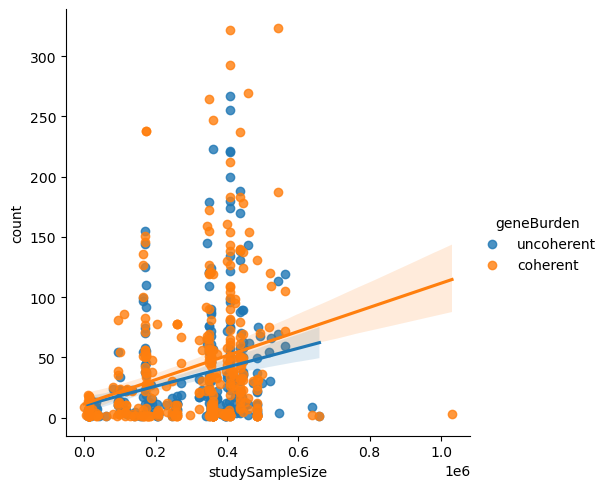

In [269]:
sns.lmplot(data=scatterGB2.toPandas(), x="studySampleSize", y="count", hue="geneBurden")

In [264]:
scatterCh = (
    coloc_bnch3.groupBy("studyId")
    .pivot("chembl")
    .count()
    .join(sampleSize, on="studyId", how="left")
    .sort(F.col("studySampleSize").desc())
)
scatterCh2 = (
    coloc_bnch3.groupBy("studyId", "chembl")
    .count()
    .join(sampleSize, on="studyId", how="left")
    .sort(F.col("chembl").desc())
)

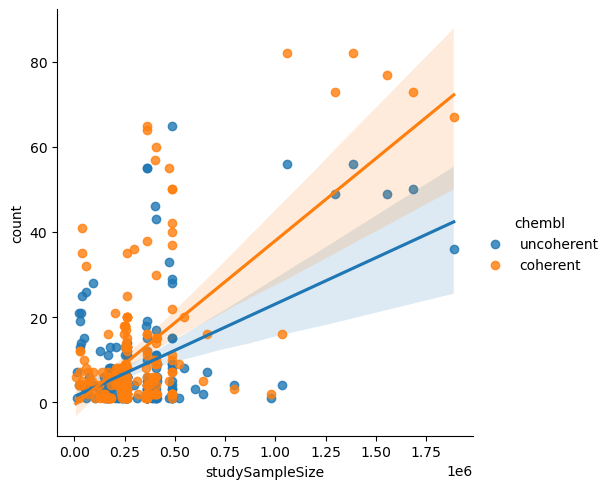

In [267]:
sns.lmplot(data=scatterCh2.toPandas(), x="studySampleSize", y="count", hue="chembl")

In [271]:
coloc_bnch3.groupBy("studyId", "chembl").count().sort(F.col("chembl").desc()).show()

+--------------------+----------+-----+
|             studyId|    chembl|count|
+--------------------+----------+-----+
|          GCST006464|uncoherent|    3|
|FINNGEN_R6_ATOPIC...|uncoherent|    2|
|           SAIGE_401|uncoherent|   11|
|FINNGEN_R6_ASTHMA...|uncoherent|    3|
|          GCST003044|uncoherent|   21|
|   NEALE2_20001_1073|uncoherent|    1|
|FINNGEN_R6_J10_AS...|uncoherent|    8|
|          GCST005038|uncoherent|    1|
|          GCST003566|uncoherent|    7|
|        GCST90038686|uncoherent|    5|
|   NEALE2_20002_1452|uncoherent|    1|
|FINNGEN_R6_KELA_D...|uncoherent|   12|
|FINNGEN_R6_M13_AR...|uncoherent|    4|
|FINNGEN_R6_ATOPIC...|uncoherent|    2|
|FINNGEN_R6_M13_PS...|uncoherent|   13|
|FINNGEN_R6_E4_HYT...|uncoherent|    2|
|     NEALE2_3761_raw|uncoherent|    6|
|          GCST005047|uncoherent|    3|
|FINNGEN_R6_COPD_L...|uncoherent|    4|
|         SAIGE_278_1|uncoherent|   17|
+--------------------+----------+-----+
only showing top 20 rows



In [272]:
### make the plots by target-diseaseId

scatterGBTarget = (
    coloc_bnch3.groupBy("studyId", "targetId", "diseaseId")
    .pivot("geneBurden")
    .count()
    .join(sampleSize, on="studyId", how="left")
    .sort(F.col("studySampleSize").desc())
)
scatterGB2Target = (
    coloc_bnch3.groupBy("studyId", "targetId", "diseaseId", "geneBurden")
    .count()
    .join(sampleSize, on="studyId", how="left")
    .sort(F.col("geneBurden").desc())
)

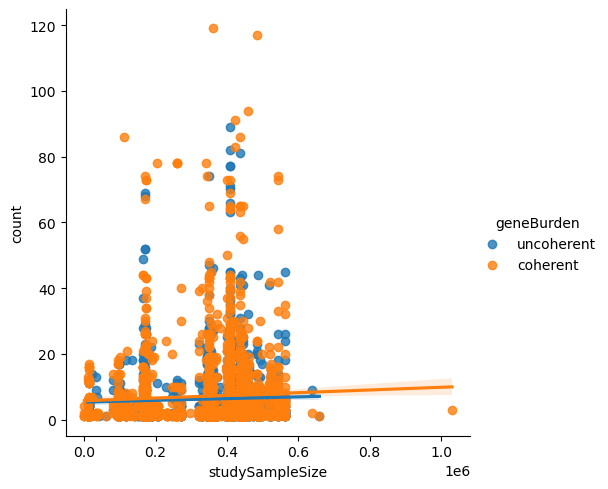

In [273]:
sns.lmplot(
    data=scatterGB2Target.toPandas(), x="studySampleSize", y="count", hue="geneBurden"
)

In [274]:
scatterChTarget = (
    coloc_bnch3.groupBy("studyId", "targetId", "diseaseId")
    .pivot("chembl")
    .count()
    .join(sampleSize, on="studyId", how="left")
    .sort(F.col("studySampleSize").desc())
)
scatterCh2Target = (
    coloc_bnch3.groupBy("studyId", "targetId", "diseaseId", "chembl")
    .count()
    .join(sampleSize, on="studyId", how="left")
    .sort(F.col("chembl").desc())
)

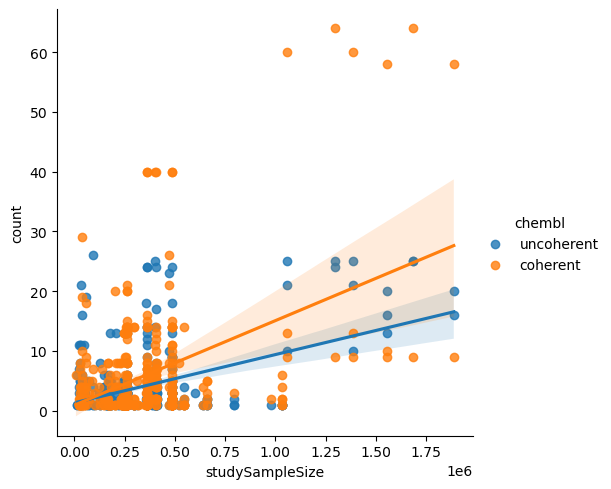

In [275]:
sns.lmplot(
    data=scatterCh2Target.toPandas(), x="studySampleSize", y="count", hue="chembl"
)

In [281]:
##### como afectan los tissues?

coloc_bnch3.groupBy("right_bio_feature").pivot("geneBurden").count().withColumn(
    "ratio", F.col("coherent") / (F.col("uncoherent") + F.col("coherent")) * 100
).sort(F.col("ratio").desc()).show(160)

+--------------------+-----+--------+----------+------------------+
|   right_bio_feature| null|coherent|uncoherent|             ratio|
+--------------------+-----+--------+----------+------------------+
|                 HLC| 5529|      43|         1| 97.72727272727273|
|     MACROPHAGE_IFNG|12003|      76|        10| 88.37209302325581|
|               ILEUM|10911|      29|         4| 87.87878787878788|
|       MONOCYTE_CD14|21843|      85|        14| 85.85858585858585|
|     SMALL_INTESTINE|13815|      36|         7| 83.72093023255815|
| MACROPHAGE_LISTERIA|14490|      48|        10| 82.75862068965517|
|      UBERON_0001969|11703|     304|        67| 81.94070080862534|
|    MACROPHAGE_NAIVE|27347|     136|        30| 81.92771084337349|
|      MONOCYTE_IFN24|36952|     189|        46| 80.42553191489363|
|     ARTERY_CORONARY|13118|      56|        14|              80.0|
|MACROPHAGE_SALMON...|24450|      80|        21| 79.20792079207921|
|LOW_GRADE_CARTILA...| 4057|      14|         4|

In [278]:
coloc_bnch3.groupBy("right_bio_feature").pivot("chembl").count().withColumn(
    "ratio", F.col("coherent") / (F.col("uncoherent") + F.col("coherent")) * 100
).sort(F.col("ratio").desc()).show(160)

+--------------------+-----+--------+----------+------------------+
|   right_bio_feature| null|coherent|uncoherent|             ratio|
+--------------------+-----+--------+----------+------------------+
|    ESOPHAGUS_MUCOSA|26495|      27|         1| 96.42857142857143|
|       ARTERY_TIBIAL|27617|      18|         1| 94.73684210526315|
|    Colon_Transverse|43975|      12|         1|  92.3076923076923|
|     SMALL_INTESTINE|13845|      12|         1|  92.3076923076923|
|            Prostate|37755|      22|         2| 91.66666666666666|
|                 HLC| 5562|      10|         1|  90.9090909090909|
|MACROPHAGE_IFNG+S...| 8558|      20|         2|  90.9090909090909|
|            Pancreas|30239|       9|         1|              90.0|
|SKIN_NOT_SUN_EXPOSED|24715|       8|         1| 88.88888888888889|
|           PITUITARY|17702|      16|         2| 88.88888888888889|
|       COLON_SIGMOID|18203|       8|         1| 88.88888888888889|
|          FIBROBLAST|43232|      28|         4|

In [279]:
coloc_bnch3.groupBy("right_bio_feature", "studyId").pivot("chembl").count().withColumn(
    "ratio", F.col("coherent") / (F.col("uncoherent") + F.col("coherent")) * 100
).sort(F.col("ratio").desc()).show(160)

+--------------------+--------------------+----+--------+----------+-----------------+
|   right_bio_feature|             studyId|null|coherent|uncoherent|            ratio|
+--------------------+--------------------+----+--------+----------+-----------------+
|      UBERON_0001969|          GCST011365|  12|       5|         1|83.33333333333334|
|      UBERON_0001969|          GCST011364|   6|       5|         1|83.33333333333334|
|      UBERON_0001969|       NEALE2_6150_1|   3|       4|         1|             80.0|
|      MONOCYTE_NAIVE|          GCST004131| 102|       4|         1|             80.0|
|      UBERON_0001969|FINNGEN_R6_I9_POS...|null|       4|         1|             80.0|
|Adipose_Visceral_...|          GCST010776|   1|       3|         1|             75.0|
|      UBERON_0001969|   FINNGEN_R6_I9_CHD|   6|       3|         1|             75.0|
|                 LCL|        GCST90038633|  41|       3|         1|             75.0|
|      UBERON_0001969|   FINNGEN_R6_I9_VTE|

In [ ]:
###

In [216]:
sampleSize = ot_genetics.select("studyId", "studySampleSize").distinct()

In [171]:
coloc_bnch3.groupBy("right_bio_feature").pivot("chembl").count().sort(
    F.col("coherent").desc()
).show()

+--------------------+--------+----------+
|   right_bio_feature|coherent|uncoherent|
+--------------------+--------+----------+
|      UBERON_0001969|       4|       217|
|        NERVE_TIBIAL|       3|        96|
|                LUNG|       3|        50|
|                 HLC|       3|        26|
|       ARTERY_TIBIAL|       3|        64|
|    SUBSTANTIA_NIGRA|       2|        10|
|           PITUITARY|       2|        23|
|        Brain_Cortex|       1|        99|
|    PANCREATIC_ISLET|    null|         6|
|       BRAIN_PUTAMEN|    null|        24|
|     ARTERY_CORONARY|    null|        24|
|       MONOCYTE_LPS2|    null|        52|
|    BRAIN_CEREBELLUM|    null|        58|
|Cells_EBV-transfo...|    null|        76|
|  BRAIN_HYPOTHALAMUS|    null|        14|
|    CD8_T-CELL_NAIVE|    null|        44|
|             PUTAMEN|    null|         6|
|          FIBROBLAST|    null|        83|
|       ADRENAL_GLAND|    null|        35|
|        Nerve_Tibial|    null|       202|
+----------

In [177]:
### across studies, which is the most coherent tissue?

test = (
    coloc_bnch3.filter(F.col("geneBurden") == "coherent")
    .groupBy("right_bio_feature")
    .pivot("studyId")
    .count()
)

In [180]:
glue = sns.load_dataset("glue").pivot("Model", "Task", "Score")

In [183]:
ver2 = test.toPandas().sort_values(by=["right_bio_feature"])
ver2.set_index("right_bio_feature", inplace=True)

In [185]:
test.count()

160

In [181]:
glue

Task,CoLA,MNLI,MRPC,QNLI,QQP,RTE,SST-2,STS-B
Model,,,,,,,,
BERT,60.5,86.7,89.3,92.7,72.1,70.1,94.9,87.6
BiLSTM,11.6,65.6,81.8,74.6,62.5,57.4,82.8,70.3
BiLSTM+Attn,18.6,67.6,83.9,74.3,60.1,58.4,83.0,72.8
BiLSTM+CoVe,18.5,65.4,78.7,70.8,60.6,52.7,81.9,64.4
BiLSTM+ELMo,32.1,67.2,84.7,75.5,61.1,57.4,89.3,70.3
ERNIE,75.5,92.3,93.9,97.3,75.2,92.6,97.8,93.0
RoBERTa,67.8,90.8,92.3,95.4,74.3,88.2,96.7,92.2
T5,71.6,92.2,92.8,96.9,75.1,92.8,97.5,93.1


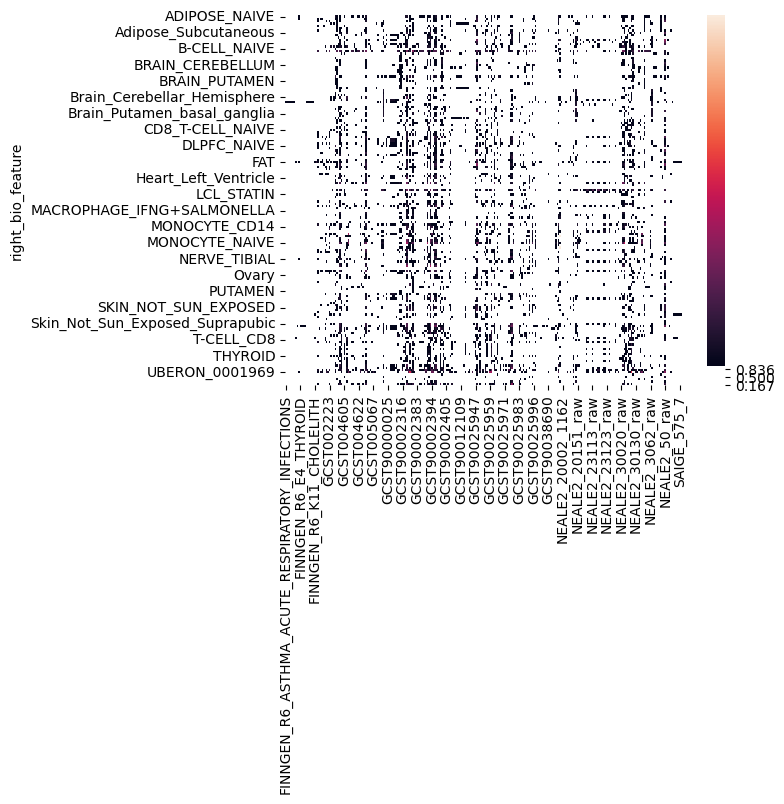

In [186]:
import seaborn as sns

ax = sns.heatmap(ver2)
colorbar = ax.collections[0].colorbar

In [174]:
coloc_bnch3.groupBy("right_bio_feature", "studyId").pivot("geneBurden").count().sort(
    F.col("coherent").desc()
).show()

+--------------------+----------------+--------+----------+
|   right_bio_feature|         studyId|coherent|uncoherent|
+--------------------+----------------+--------+----------+
|        MONOCYTE_LPS|     NEALE2_1717|      16|         6|
|       MONOCYTE_R848|     NEALE2_1717|      16|         6|
|      UBERON_0001969|    GCST90002346|       9|      null|
|      UBERON_0001969|NEALE2_30100_raw|       9|      null|
|      MONOCYTE_NAIVE|NEALE2_30050_raw|       8|      null|
|      UBERON_0001969|    GCST90025959|       7|      null|
|      MONOCYTE_NAIVE|    GCST90002334|       7|      null|
|      MONOCYTE_NAIVE|    GCST90002390|       7|         1|
|      UBERON_0001969|    GCST90025960|       7|      null|
|      MONOCYTE_IFN24|      GCST004609|       7|      null|
|     NEUTROPHIL_CD16|    GCST90002392|       7|         1|
|               BLOOD|    GCST90002357|       6|         2|
|        Artery_Aorta|   NEALE2_50_raw|       6|         3|
|         Whole_Blood|    GCST90025976| 

In [151]:
coloc_bnch3.groupBy(
    "targetId", "diseaseId", "locusId", "studyId", "right_bio_feature"
).pivot("chembl").count().show()

+---------------+-----------+------------------+----------------+--------------------+--------+----------+
|       targetId|  diseaseId|           locusId|         studyId|   right_bio_feature|coherent|uncoherent|
+---------------+-----------+------------------+----------------+--------------------+--------+----------+
|ENSG00000092067|EFO_0004842|   14_23119848_G_A|    GCST90002381|      MONOCYTE_NAIVE|    null|         1|
|ENSG00000092067|EFO_0004842|   14_23119848_G_A|    GCST90002381|      UBERON_0000178|    null|         1|
|ENSG00000092067|EFO_0004842|   14_23119848_G_A|    GCST90002381|     MACROPHAGE_IFNG|    null|         1|
|ENSG00000072110|EFO_0004584|   14_68872947_G_C|    GCST90002346|      MONOCYTE_IFN24|    null|         1|
|ENSG00000072110|EFO_0004584|   14_68872947_G_C|    GCST90002346|         BRAIN_NAIVE|    null|         1|
|ENSG00000072110|EFO_0004584|   14_68872947_G_C|    GCST90002346|      MONOCYTE_NAIVE|    null|         1|
|ENSG00000157766|EFO_0011011|   15_88

+--------------------+--------+----------+
|   right_bio_feature|coherent|uncoherent|
+--------------------+--------+----------+
|    PANCREATIC_ISLET|    null|         6|
|       BRAIN_PUTAMEN|    null|        24|
|    BRAIN_CEREBELLUM|    null|        58|
|     ARTERY_CORONARY|    null|        24|
|Cells_EBV-transfo...|    null|        76|
|  BRAIN_HYPOTHALAMUS|    null|        14|
|       ADRENAL_GLAND|    null|        35|
|       MONOCYTE_LPS2|    null|        52|
|    CD8_T-CELL_NAIVE|    null|        44|
|             PUTAMEN|    null|         6|
|        Nerve_Tibial|    null|       202|
|          FIBROBLAST|    null|        83|
|       Artery_Tibial|    null|       147|
|     MACROPHAGE_IFNG|    null|        41|
|      SENSORY_NEURON|    null|         7|
|    SKIN_SUN_EXPOSED|    null|        78|
|          TH1_MEMORY|    null|        40|
|MINOR_SALIVARY_GLAND|    null|        47|
|Minor_Salivary_Gland|    null|        38|
|   BRAIN_SPINAL_CORD|    null|        28|
|  Brain_Hy

In [147]:
coloc_bnch3.show()

+---------------+-----------+----------------+------------------+--------------------+--------------------+--------------+--------------------+-------------------------+---------+----------+----------+-------------+--------------------+------------+-----+--------+-----+-------------+----------+-------------+-------------+-----------+----------+----------+
|       targetId|  diseaseId|         studyId|           locusId|   right_bio_feature|      right_locus_id|right_study_id|            coloc_h4|left_var_right_study_beta|left_type|right_type|is_flipped|beta_assessed|         therapyArea|         EFO|count|tendency|count|LoF_protectBN|LoF_riskBN|GoF_protectCh|LoF_protectCh|     doeQtl|geneBurden|    chembl|
+---------------+-----------+----------------+------------------+--------------------+--------------------+--------------+--------------------+-------------------------+---------+----------+----------+-------------+--------------------+------------+-----+--------+-----+-------------+

In [92]:
coloc_bnch.filter(
    (F.col("LoF_protectBN").isNotNull())
    | F.col("LoF_riskBN").isNotNull()
    | F.col("GoF_protectCh").isNotNull()
    | F.col("LoF_protectCh").isNotNull()
).count()

29947

In [96]:
coloc_bnch.filter(
    (F.col("LoF_protectBN").isNotNull())
    | F.col("LoF_riskBN").isNotNull()
    | F.col("GoF_protectCh").isNotNull()
    | F.col("LoF_protectCh").isNotNull()
).groupBy("studyId", "targetId", "diseaseId", "locusId").count().count()

4210

In [97]:
coloc_bnch.filter(
    (F.col("LoF_protectBN").isNotNull())
    | F.col("LoF_riskBN").isNotNull()
    | F.col("GoF_protectCh").isNotNull()
    | F.col("LoF_protectCh").isNotNull()
).groupBy("targetId", "diseaseId", "locusId").count().count()

2994

In [98]:
coloc_bnch.filter(
    (F.col("LoF_protectBN").isNotNull())
    | F.col("LoF_riskBN").isNotNull()
    | F.col("GoF_protectCh").isNotNull()
    | F.col("LoF_protectCh").isNotNull()
).groupBy("targetId", "diseaseId").count().count()

1143

In [99]:
coloc_bnch.groupBy("targetId", "diseaseId").count().count()

136960

In [89]:
all.filter(F.col("studyId") == "GCST90012109").show()

+------------------+---------------+-------------+-------------------+--------+----------+-------------------+---------------------------+---------------------------+---------------------------------+--------------------------------+-----------------+-------------+----------+--------------------+--------+-------------+---------------------+--------------+-----------------+--------+----------------+---------------+----------+--------+-------------------+-------------------+----------------+--------------------+-------------------+-------------------------+-------------------------------------+-------------------------------------+--------------+------+------------+-----------------+----------+----------------------------+-------------------+--------------+---------+--------------------------------+--------------------------------+--------------+------------------+--------+------+---------+----------------------+---------------+----------+------------+--------------------+----+----------

In [79]:
prueba_assessment.groupBy("datasourceId").count().show()

+------------+-------+
|datasourceId|  count|
+------------+-------+
| gene_burden|  27381|
|      chembl| 629046|
|     intogen|   4359|
|    orphanet|   6342|
| eva_somatic|  17099|
|        impc|1032845|
+------------+-------+



In [77]:
evidences.filter(F.col("studyId") == "GCST90012109").show()

+------------------+---------------+-------------+-------------------+--------+----------+-------------------+---------------------------+---------------------------+---------------------------------+--------------------------------+-----------------+-------------+----------+--------------------+--------+-------------+---------------------+--------------+-----------------+--------+----------------+---------------+----------+--------+-------------------+-------------------+----------------+--------------------+-------------------+-------------------------+-------------------------------------+-------------------------------------+--------------+------+------------+-----------------+----------+----------------------------+-------------------+--------------+---------+--------------------------------+--------------------------------+--------------+------------------+--------+------+---------+----------------------+---------------+----------+------------+--------------------+----+----------

In [10]:
## we should include the study right type because is the one that could give us contradictions
coloc_indStudy = (
    coloc3.filter((F.col("count") > 1) & (F.col("beta_assessed") != "neutral"))
    .groupBy(
        "left_locus_id",
        "left_study_id",
        "right_gene_id",
        "right_study_id",
    )
    .pivot("beta_assessed")
    .agg(
        F.collect_set("right_bio_feature").alias("tissues"),
        F.collect_set("therapyArea").alias("therArea"),
        F.size(F.collect_set("right_bio_feature")).alias("nr_tissues"),
        F.size(F.collect_set("therapyArea")).alias("nr_therArea"),
        # F.countDistinct("right_study_id").alias("count_Studies")
    )
    .withColumn(
        "therAreaOverlap",
        F.array_intersect(F.col("gof_therArea"), F.col("lof_therArea")),
    )
    .withColumn(
        "nr_therAreaOverlap",
        F.size(F.array_intersect(F.col("gof_therArea"), F.col("lof_therArea"))),
    )
    .withColumn(
        "nr_tissueOverlap",
        F.size(F.array_intersect(F.col("gof_tissues"), F.col("lof_tissues"))),
    )
    .persist()
)  # .show( truncate=False)

### groupBy therapeutic area
###

In [82]:
datasources = evidences.groupBy("datasourceId").count().persist()

In [84]:
datasources.show(1000)

+------------------+--------+
|      datasourceId|   count|
+------------------+--------+
|         europepmc|10355423|
|            crispr|    1838|
|  uniprot_variants|   26258|
|  genomics_england|   31394|
|       gene_burden|   27381|
|            chembl|  625734|
|        slapenrich|   72440|
|     crispr_screen|   24907|
|  expression_atlas|  230893|
|           intogen|    4359|
|          reactome|   10095|
|          orphanet|    6342|
|            sysbio|     389|
| cancer_biomarkers|    1300|
|cancer_gene_census|   76289|
|           progeny|     378|
|           clingen|    2183|
|               eva| 2895491|
|    gene2phenotype|    3011|
|uniprot_literature|    4135|
|       eva_somatic|   17099|
|ot_genetics_portal|  781862|
|              impc| 1032845|
+------------------+--------+



23/09/25 08:41:47 WARN CacheManager: Asked to cache already cached data.        


In [73]:
##3 ASSOCIATIONS CHEMBL, OT GENETICS AND GENE BURDEN
evidences1 = (
    prueba_assessment.filter(
        (F.col("datasourceId").isin(["chembl", "ot_genetics_portal", "gene_burden"]))
        & (F.col("homogenized").isin(["noEvaluable", "dispar"]) == False)
    )
    .groupBy("targetId", "diseaseId", "datasourceId")
    .pivot("homogenized")
    .count()
    .persist()
)

In [74]:
#### make the associations for ot genetics
evidence_ot_genetics = (
    prueba_assessment.filter(
        (F.col("datasourceId").isin(["ot_genetics_portal"]))
        & (F.col("homogenized").isin(["noEvaluable", "dispar"]) == False)
    )
    .groupBy("targetId", "diseaseId", "variantId", "studyId")
    .pivot("homogenized")
    .count()
    .persist()
)

In [79]:
### we need to groupBy targetId and disease Id to not duplicate the coloc evidences when doing the join

evidence_ot_chembl = (
    coloc_otgene.withColumnRenamed("GoF_protect", "GoF_protectOT")
    .withColumnRenamed("GoF_risk", "GoF_riskOT")
    .withColumnRenamed("LoF_protect", "LoF_protectOT")
    .withColumnRenamed("LoF_risk", "LoF_riskOT")
    .join(
        evidences1.filter(F.col("datasourceId") == "chembl"),
        on=["targetId", "diseaseId"],
        how="left",
    )
    .persist()
)

In [2]:
### load ot_genetics_portal

var_filter_lof = [
    ### High impact variants https://www.ensembl.org/info/genome/variation/prediction/predicted_data.html
    "SO_0001589",  ## frameshit_variant
    "SO_0001587",  ## stop_gained
    "SO_0001574",  ## splice_acceptor_variant
    "SO_0001575",  ## splice_donor_variant
    "SO_0002012",  ## start_lost
    "SO_0001578",  ## stop_lost
    "SO_0001893",  ## transcript_ablation
]

gof = ["SO_0002053"]
lof = ["SO_0002054"]

evd = (
    spark.read.parquet(
        "gs://open-targets-data-releases/23.06/output/etl/parquet/evidence/sourceId=ot_genetics_portal"
    )
    .selectExpr(
        "studyId",
        "variantId as locusId",
        "targetId",
        "diseaseId",
        "oddsRatio",
        "beta",
        "variantFunctionalConsequenceFromQtlId",
        "variantFunctionalConsequenceId"
        # "score",
    )
    .withColumn(
        "effect",
        F.when((F.col("beta") > 0) | (F.col("oddsRatio") > 1), "risk")
        .when((F.col("beta") < 0) | (F.col("oddsRatio") < 1), "protective")
        .otherwise("unknown"),  # 23% of evidence has unknown direction of effect
    )
    .withColumn(
        "functionalVar",
        F.when(
            F.col("variantFunctionalConsequenceId").isin(var_filter_lof), F.lit("lof")
        ).otherwise("noInfo"),
    )
    .persist()
)

In [3]:
### load v2d for exploring

v2d = spark.read.parquet("gs://genetics-portal-dev-data/22.09.1/outputs/v2d")
v2d_gwas = v2d.select(
    F.concat_ws("_", "lead_chrom", "lead_pos", "lead_ref", "lead_alt").alias(
        "left_locus_id"
    ),
    F.col("beta"),
    F.col("odds_ratio"),
    F.col("study_id"),
    F.col("trait_reported"),
    F.col("trait_efos"),
    F.col("n_cases"),
    F.col("n_initial"),
)

In [72]:
evidence_ot_genetics.count()

213378

In [67]:
coloc_otgene = (
    coloc3.withColumnRenamed("left_study_id", "studyId")
    .withColumnRenamed("left_locus_id", "locusId")
    .withColumnRenamed("right_gene_id", "targetId")
    .join(
        evidence_ot_genetics.withColumnRenamed("variantId", "locusId"),
        on=["studyId", "locusId", "targetId"],
        how="left",
    )
).persist()

In [11]:
## we should include the study right type because is the one that could give us contradictions
coloc_indStudy2 = (
    coloc3.filter((F.col("count") > 1) & (F.col("beta_assessed") != "neutral"))
    .groupBy(
        "left_locus_id",
        # "left_study_id",
        "right_gene_id",
        "right_study_id",
    )
    .pivot("beta_assessed")
    .agg(
        F.collect_set("right_bio_feature").alias("tissues"),
        F.collect_set("therapyArea").alias("therArea"),
        F.size(F.collect_set("right_bio_feature")).alias("nr_tissues"),
        F.size(F.collect_set("therapyArea")).alias("nr_therArea"),
        # F.countDistinct("right_study_id").alias("count_Studies")
    )
    .withColumn(
        "therAreaOverlap",
        F.array_intersect(F.col("gof_therArea"), F.col("lof_therArea")),
    )
    .withColumn(
        "nr_therAreaOverlap",
        F.size(F.array_intersect(F.col("gof_therArea"), F.col("lof_therArea"))),
    )
    .withColumn(
        "nr_tissueOverlap",
        F.size(F.array_intersect(F.col("gof_tissues"), F.col("lof_tissues"))),
    )
    .persist()
)  # .show( truncate=False)

In [12]:
coloc3.withColumn(
    "studies_coloch4",
    F.struct(F.col("left_study_id"), F.col("right_study_id"), F.col("coloc_h4")),
).show()

+-------------+-----------------+---------------+--------------------+----------------+--------------+--------------------+-------------------------+---------+----------+----------+-------------+--------------------+------------+-----+--------------------+
|left_locus_id|    left_study_id|  right_gene_id|   right_bio_feature|  right_locus_id|right_study_id|            coloc_h4|left_var_right_study_beta|left_type|right_type|is_flipped|beta_assessed|         therapyArea|         EFO|count|     studies_coloch4|
+-------------+-----------------+---------------+--------------------+----------------+--------------+--------------------+-------------------------+---------+----------+----------+-------------+--------------------+------------+-----+--------------------+
|1_1020217_G_T|     GCST90025949|ENSG00000188157|                IPSC|   1_1025970_C_T|       iPSCORE|  0.5251867667295536|                0.0668669|     gwas|      eqtl|     false|          gof|  biological process|  GO_0008150|

In [13]:
coloc4 = (
    coloc3.withColumn(
        "studies_coloc_h4",
        F.struct(F.col("left_study_id"), F.col("right_study_id"), F.col("coloc_h4")),
    )
    .groupBy(
        "left_locus_id",
        "right_locus_id",
        "right_gene_id",
        "right_bio_feature",
        "beta_assessed",
        "therapyArea",
        "right_study_id",
        "EFO",
    )
    .agg(F.collect_set("studies_coloc_h4").alias("studies_coloc_h4"))
    .persist()
)

In [162]:
coloc4.count()

2530326

In [71]:
coloc3_burden = (
    coloc3.withColumnRenamed("left_study_id", "studyId")
    .withColumnRenamed("left_locus_id", "locusId")
    .withColumnRenamed("right_gene_id", "targetId")
    .join(
        evidences1.filter(F.col("datasourceId") == "gene_burden").withColumnRenamed(
            "variantId", "locusId"
        ),
        on=["studyId", "locusId", "targetId"],
        how="left",
    )
).persist()

AnalysisException: USING column `studyId` cannot be resolved on the right side of the join. The right-side columns: [targetId, diseaseId, datasourceId, GoF_protect, GoF_risk, LoF_protect, LoF_risk]

In [14]:
coloc3.filter(
    (F.col("left_locus_id") == "14_77495266_G_C")
    & (F.col("right_study_id") == "GTEx-eQTL")
).show(1000, truncate=False)

+---------------+-------------+---------------+-------------------------------+--------------------+--------------+--------------------+-------------------------+---------+----------+----------+-------------+--------------------------------------------+------------+-----+
|left_locus_id  |left_study_id|right_gene_id  |right_bio_feature              |right_locus_id      |right_study_id|coloc_h4            |left_var_right_study_beta|left_type|right_type|is_flipped|beta_assessed|therapyArea                                 |EFO         |count|
+---------------+-------------+---------------+-------------------------------+--------------------+--------------+--------------------+-------------------------+---------+----------+----------+-------------+--------------------------------------------+------------+-----+
|14_77495266_G_C|GCST004632   |ENSG00000100591|FIBROBLAST                     |14_77470110_G_C     |GTEx-eQTL     |0.7321098987089623  |0.00862707               |gwas     |eqtl     

In [28]:
import matplotlib.pyplot as plt
import numpy as np

In [41]:
np.linspace(0, 1, 21)

array([0.  , 0.05, 0.1 , 0.15, 0.2 , 0.25, 0.3 , 0.35, 0.4 , 0.45, 0.5 ,
       0.55, 0.6 , 0.65, 0.7 , 0.75, 0.8 , 0.85, 0.9 , 0.95, 1.  ])

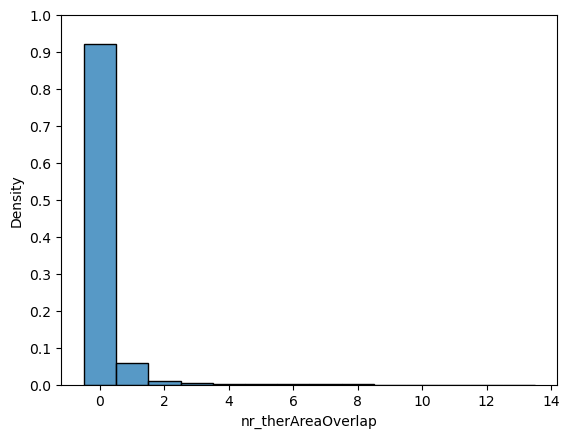

In [43]:
## therapy areas
ax1 = sns.histplot(
    data=coloc_indStudy.select("nr_therAreaOverlap").toPandas(),
    x="nr_therAreaOverlap",
    binwidth=1,
    discrete=True,
    stat="density",
)
ax1.set_yticks(np.linspace(0, 1, 11))

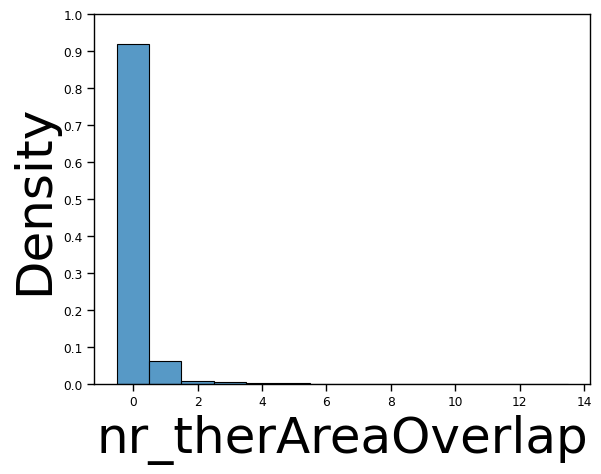

In [113]:
## therapy areas
ax1 = sns.histplot(
    data=coloc_indStudy2.select("nr_therAreaOverlap").toPandas(),
    x="nr_therAreaOverlap",
    binwidth=1,
    discrete=True,
    stat="density",
)
ax1.set_yticks(np.linspace(0, 1, 11))

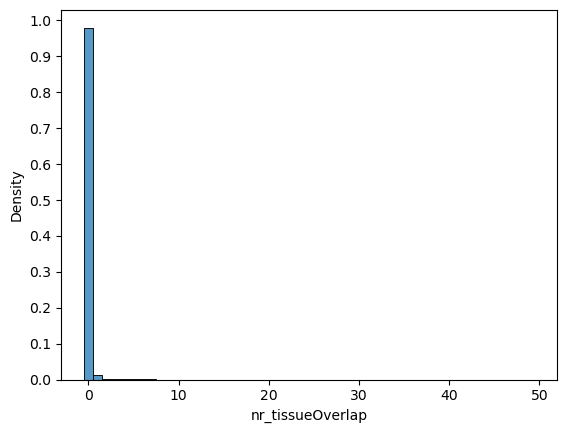

In [47]:
## tissues
ax1 = sns.histplot(
    data=coloc_indStudy.select("nr_tissueOverlap").toPandas(),
    x="nr_tissueOverlap",
    binwidth=1,
    discrete=True,
    stat="density",
)
ax1.set_yticks(np.linspace(0, 1, 11))

In [140]:
coloc3.groupBy("left_locus_id").agg(F.countDistinct("left_study_id")).show()

+--------------------+--------------------+
|       left_locus_id|count(left_study_id)|
+--------------------+--------------------+
|     14_77495266_G_C|                   5|
|      8_80377390_G_T|                   1|
|     7_105209290_A_G|                   1|
|     19_44967201_G_C|                   3|
|       7_2833502_C_T|                   1|
|     3_13679430_A_AC|                   1|
|     19_19277248_G_C|                   2|
|     20_62933549_T_G|                  17|
|     2_232925812_T_A|                   5|
|9_133271018_TAAGAC_T|                   4|
|      3_52846724_C_T|                   1|
|     19_57646758_T_C|                   1|
|     19_16346537_T_C|                   1|
|      2_61191208_G_C|                   2|
|     6_108606639_A_G|                  12|
|     1_154432548_A_G|                   2|
|      7_30915924_G_T|                  11|
|      8_10962344_C_T|                   1|
|      11_1867384_C_T|                   6|
|      8_19500923_G_A|          

In [76]:
### number of studies per variant

coloc_study_stats = (
    coloc3.filter((F.col("count") > 1) & (F.col("beta_assessed") != "neutral"))
    .groupBy(
        "left_locus_id",
        "left_study_id",
        "right_gene_id",
        # "right_study_id",
    )
    .agg(
        F.countDistinct("right_study_id").alias("nr_studies"),
        F.countDistinct("right_bio_feature").alias("nr_tissues"),
        F.countDistinct("therapyArea").alias("nr_therArea"),
    )
    .persist()
)

In [57]:
coloc_study_stats.show()

+--------------------+----------------+---------------+----------+
|       left_locus_id|   left_study_id|  right_gene_id|nr_studies|
+--------------------+----------------+---------------+----------+
|10_100543180_T_TT...|    GCST90000026|ENSG00000166135|         7|
|    10_101931242_G_A|      GCST006979|ENSG00000059915|         1|
|    10_102071841_G_A|     NEALE2_1060|ENSG00000166189|         2|
|    10_102425224_A_G|    GCST90025946|ENSG00000198408|         1|
|   10_102568209_T_TA|     NEALE2_1697|ENSG00000107882|         4|
|    10_102600127_C_T|NEALE2_30080_raw|ENSG00000107872|         2|
|    10_102727686_G_A|    GCST90025974|ENSG00000148842|         4|
|    10_102728114_T_C|NEALE2_23130_raw|ENSG00000138107|        13|
|    10_102832492_A_C|    GCST90012103|ENSG00000138175|         7|
|    10_103046897_A_C|    GCST90002385|ENSG00000138111|         3|
|    10_103095899_T_C|    GCST90025971|ENSG00000214435|         2|
|   10_103148603_CA_C|     NEALE2_1980|ENSG00000148842|       

In [106]:
coloc3.filter((F.col("count") > 1) & (F.col("beta_assessed") != "neutral")).groupBy(
    "left_locus_id",
    # "left_study_id",
    "right_gene_id",
).count().count()

158746

In [139]:
coloc2.filter(F.col("left_locus_id") == "9_99969955_T_C").sort(
    F.col("right_study_id").desc()
).show(102)

+--------------------+--------------+--------------------+-------------+--------------+---------------+--------------------+-------------------------+---------+----------+----------+-------------+--------------------+------------+
|   right_bio_feature| left_locus_id|      right_locus_id|left_study_id|right_study_id|  right_gene_id|            coloc_h4|left_var_right_study_beta|left_type|right_type|is_flipped|beta_assessed|         therapyArea|         EFO|
+--------------------+--------------+--------------------+-------------+--------------+---------------+--------------------+-------------------------+---------+----------+----------+-------------+--------------------+------------+
|               BLOOD|9_99969955_T_C|    9_99996993_G_GTA| GCST90002304|       TwinsUK|ENSG00000136874|  0.7851363381541818|               -0.0753914|     gwas|      eqtl|     false|          lof| hematologic disease| EFO_0005803|
|                 FAT|9_99969955_T_C|9_100009932_AGGAA...| GCST90002304|    

In [135]:
coloc2.sort(F.col("left_locus_id").desc(), F.col("right_gene_id").desc()).show()

+--------------------+--------------+-------------------+-------------+--------------+---------------+-------------------+-------------------------+---------+----------+----------+-------------+--------------------+------------+
|   right_bio_feature| left_locus_id|     right_locus_id|left_study_id|right_study_id|  right_gene_id|           coloc_h4|left_var_right_study_beta|left_type|right_type|is_flipped|beta_assessed|         therapyArea|         EFO|
+--------------------+--------------+-------------------+-------------+--------------+---------------+-------------------+-------------------------+---------+----------+----------+-------------+--------------------+------------+
|Brain_Putamen_bas...|9_99969955_T_C|    9_100001301_A_G| GCST90002304|     GTEx-sQTL|ENSG00000241697|0.09587018345681703|      0.14597341418266296|     gwas|      sqtl|      true|          gof|nervous system di...| EFO_0000618|
|Adipose_Subcutaneous|9_99969955_T_C|     9_99527888_C_T| GCST90002304|     GTEx-sQT

In [132]:
coloc_study.sort(F.col("left_locus_id").desc(), F.col("right_gene_id").desc()).show()

+--------------------+----------------+---------------+--------------------+--------------------+--------------+---------------+-----------------+--------------------+--------------------+--------------+---------------+-----------------+--------------------+------------------+----------------+----------+----------+-----------+
|       left_locus_id|   left_study_id|  right_gene_id|         gof_tissues|        gof_therArea|gof_nr_tissues|gof_nr_therArea|gof_count_Studies|         lof_tissues|        lof_therArea|lof_nr_tissues|lof_nr_therArea|lof_count_Studies|     therAreaOverlap|nr_therAreaOverlap|nr_tissueOverlap|nr_studies|nr_tissues|nr_therArea|
+--------------------+----------------+---------------+--------------------+--------------------+--------------+---------------+-----------------+--------------------+--------------------+--------------+---------------+-----------------+--------------------+------------------+----------------+----------+----------+-----------+
|      9_9996

In [77]:
coloc_study = (
    coloc3.filter((F.col("count") > 1) & (F.col("beta_assessed") != "neutral"))
    .groupBy(
        "left_locus_id",
        "left_study_id",
        "right_gene_id",
        # "right_study_id",
    )
    .pivot("beta_assessed")
    .agg(
        F.collect_set("right_bio_feature").alias("tissues"),
        F.collect_set("therapyArea").alias("therArea"),
        F.size(F.collect_set("right_bio_feature")).alias("nr_tissues"),
        F.size(F.collect_set("therapyArea")).alias("nr_therArea"),
        F.countDistinct("right_study_id").alias("count_Studies"),
    )
    .withColumn(
        "therAreaOverlap",
        F.array_intersect(F.col("gof_therArea"), F.col("lof_therArea")),
    )
    .withColumn(
        "nr_therAreaOverlap",
        F.size(F.array_intersect(F.col("gof_therArea"), F.col("lof_therArea"))),
    )
    .withColumn(
        "nr_tissueOverlap",
        F.size(F.array_intersect(F.col("gof_tissues"), F.col("lof_tissues"))),
    )
    .join(
        coloc_study_stats,
        on=[
            "left_locus_id",
            "left_study_id",
            "right_gene_id",
        ],
        how="left",
    )
    .persist()
)

In [110]:
coloc_study2 = (
    coloc3.filter((F.col("count") > 1) & (F.col("beta_assessed") != "neutral"))
    .groupBy(
        "left_locus_id",
        # "left_study_id",
        "right_gene_id",
        # "right_study_id",
    )
    .pivot("beta_assessed")
    .agg(
        F.collect_set("right_bio_feature").alias("tissues"),
        F.collect_set("therapyArea").alias("therArea"),
        F.size(F.collect_set("right_bio_feature")).alias("nr_tissues"),
        F.size(F.collect_set("therapyArea")).alias("nr_therArea"),
        F.countDistinct("right_study_id").alias("count_Studies"),
    )
    .withColumn(
        "therAreaOverlap",
        F.array_intersect(F.col("gof_therArea"), F.col("lof_therArea")),
    )
    .withColumn(
        "nr_therAreaOverlap",
        F.size(F.array_intersect(F.col("gof_therArea"), F.col("lof_therArea"))),
    )
    .withColumn(
        "nr_tissueOverlap",
        F.size(F.array_intersect(F.col("gof_tissues"), F.col("lof_tissues"))),
    )
    .join(
        coloc_study_stats,
        on=[
            "left_locus_id",
            # "left_study_id",
            "right_gene_id",
        ],
        how="left",
    )
    .persist()
)

In [ ]:
### do on the space

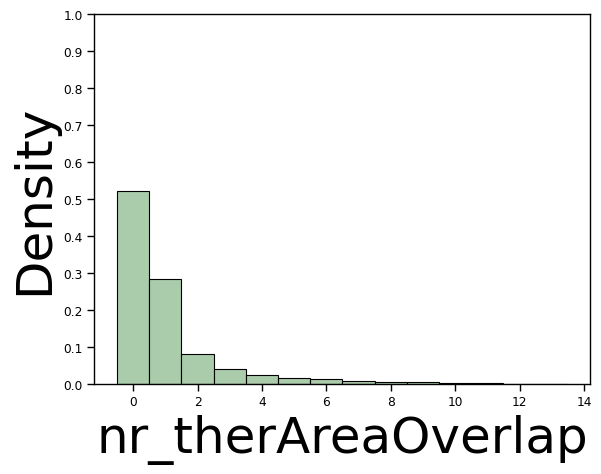

In [111]:
### thearapy areas grouping variants
import seaborn as sns

ax1 = sns.histplot(
    data=coloc_study2.select("nr_therAreaOverlap").toPandas(),
    x="nr_therAreaOverlap",
    binwidth=1,
    discrete=True,
    stat="density",
    color="darkseagreen",
)
ax1.set_yticks(np.linspace(0, 1, 11))

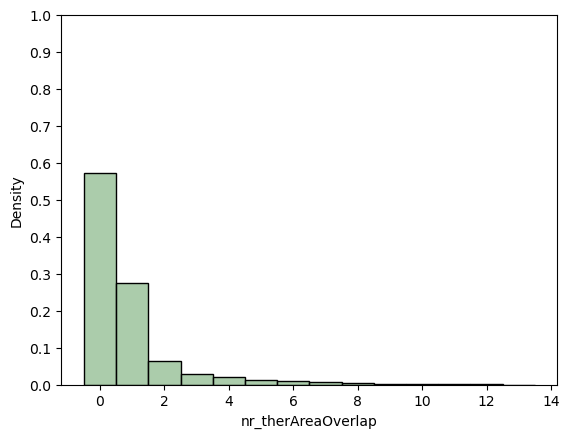

In [51]:
### therapy areas grouping variants

import seaborn as sns

ax1 = sns.histplot(
    data=coloc_study.select("nr_therAreaOverlap").toPandas(),
    x="nr_therAreaOverlap",
    binwidth=1,
    discrete=True,
    stat="density",
    color="darkseagreen",
)
ax1.set_yticks(np.linspace(0, 1, 11))

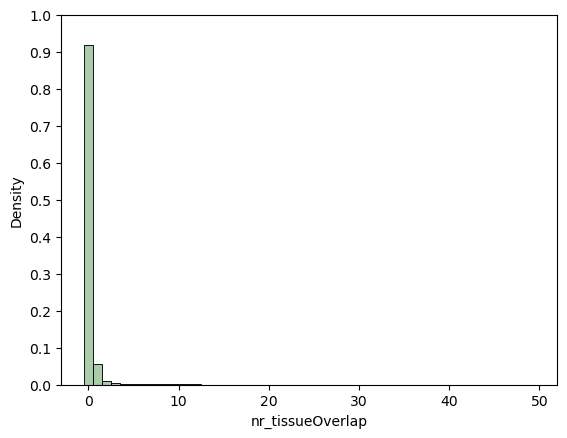

In [52]:
## tissues grouping variants
ax1 = sns.histplot(
    data=coloc_study.select("nr_tissueOverlap").toPandas(),
    x="nr_tissueOverlap",
    binwidth=1,
    discrete=True,
    stat="density",
    color="darkseagreen",
)
ax1.set_yticks(np.linspace(0, 1, 11))

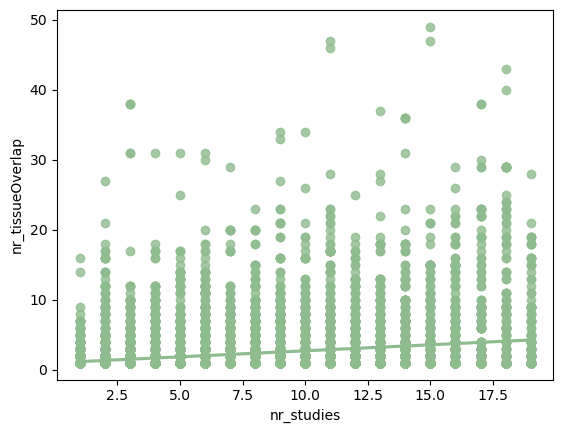

In [97]:
### nr of studies and tissue overlap
ax1 = sns.regplot(
    data=coloc_study.filter(
        (F.col("nr_tissueOverlap") > 0) & (F.col("nr_studies") < 20)
    )
    .select("nr_tissueOverlap", "nr_studies")
    .toPandas(),
    x="nr_studies",
    y="nr_tissueOverlap",
    # binwidth=1,
    # discrete=True,
    # stat="density",
    color="darkseagreen",
)

In [102]:
coloc_study.count()

259827

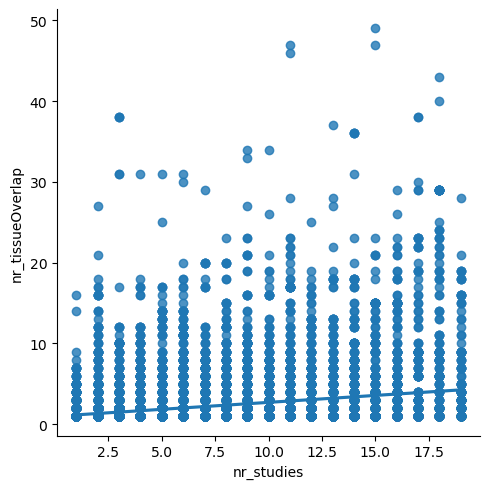

In [80]:
### nr of studies and tissue overlap
ax1 = sns.lmplot(
    data=coloc_study.filter(
        (F.col("nr_tissueOverlap") > 0) & (F.col("nr_studies") < 20)
    )
    .select("nr_tissueOverlap", "nr_studies")
    .toPandas(),
    x="nr_studies",
    y="nr_tissueOverlap",
    # binwidth=1,
    # discrete=True,
    # stat="density",
    # col='darkseagreen'
)

/opt/conda/miniconda3/lib/python3.10/site-packages/statsmodels/genmod/families/links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


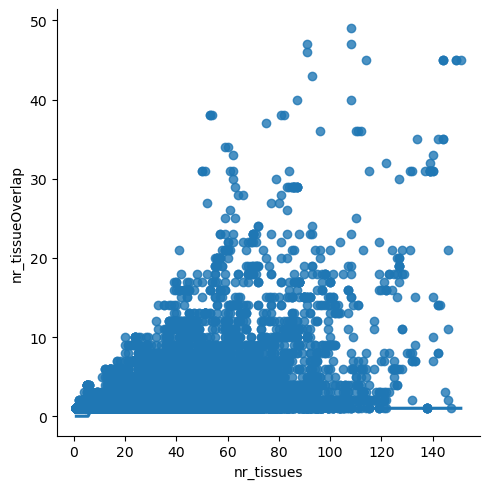

In [91]:
### nr of studies and tissue overlap
ax1 = sns.lmplot(
    data=coloc_study.filter(F.col("nr_tissueOverlap") > 0)
    .select("nr_tissueOverlap", "nr_tissues")
    .toPandas(),
    x="nr_tissues",
    y="nr_tissueOverlap",
    # binwidth=1,
    # discrete=True,
    # stat="density",
    # col='darkseagreen'
)

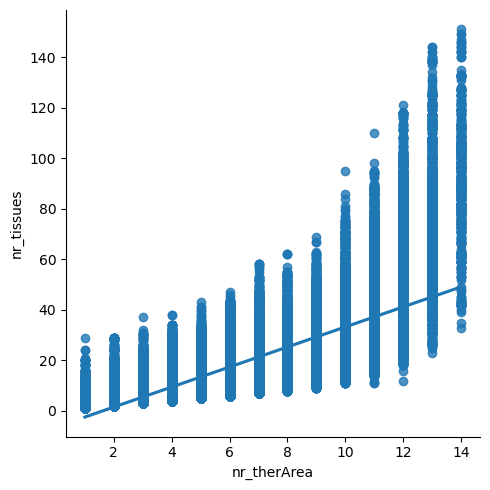

In [93]:
### nr of tissues and nr therapy areas
ax1 = sns.lmplot(
    data=coloc_study.select("nr_therArea", "nr_tissues").toPandas(),
    x="nr_therArea",
    y="nr_tissues",
    # binwidth=1,
    # discrete=True,
    # stat="density",
    # col='darkseagreen'
)

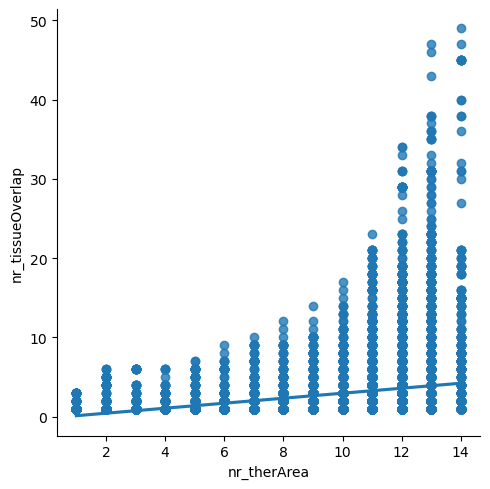

In [95]:
### nr of tissues overlapped and nr therapy areas
ax1 = sns.lmplot(
    data=coloc_study.filter(F.col("nr_tissueOverlap") > 0)
    .select("nr_therArea", "nr_tissueOverlap")
    .toPandas(),
    x="nr_therArea",
    y="nr_tissueOverlap",
    # binwidth=1,
    # discrete=True,
    # stat="density",
    # col='darkseagreen'
)

In [ ]:
#### ver como afecta el coger el mayor beta en valor absoluto

In [82]:
coloc_study.filter((F.col("nr_tissueOverlap") > 0)).show()

+-----------------+--------------------+---------------+--------------------+--------------------+--------------+---------------+-----------------+--------------------+--------------------+--------------+---------------+-----------------+--------------------+------------------+----------------+----------+----------+-----------+
|    left_locus_id|       left_study_id|  right_gene_id|         gof_tissues|        gof_therArea|gof_nr_tissues|gof_nr_therArea|gof_count_Studies|         lof_tissues|        lof_therArea|lof_nr_tissues|lof_nr_therArea|lof_count_Studies|     therAreaOverlap|nr_therAreaOverlap|nr_tissueOverlap|nr_studies|nr_tissues|nr_therArea|
+-----------------+--------------------+---------------+--------------------+--------------------+--------------+---------------+-----------------+--------------------+--------------------+--------------+---------------+-----------------+--------------------+------------------+----------------+----------+----------+-----------+
| 10_10309

In [101]:
### pair plot only for contradictions
sns.pairplot(coloc_study.filter((F.col("nr_tissueOverlap") > 0)).toPandas(), size=20)

/opt/conda/miniconda3/lib/python3.10/site-packages/seaborn/axisgrid.py:2095: UserWarning: The `size` parameter has been renamed to `height`; please update your code.
  warnings.warn(msg, UserWarning)


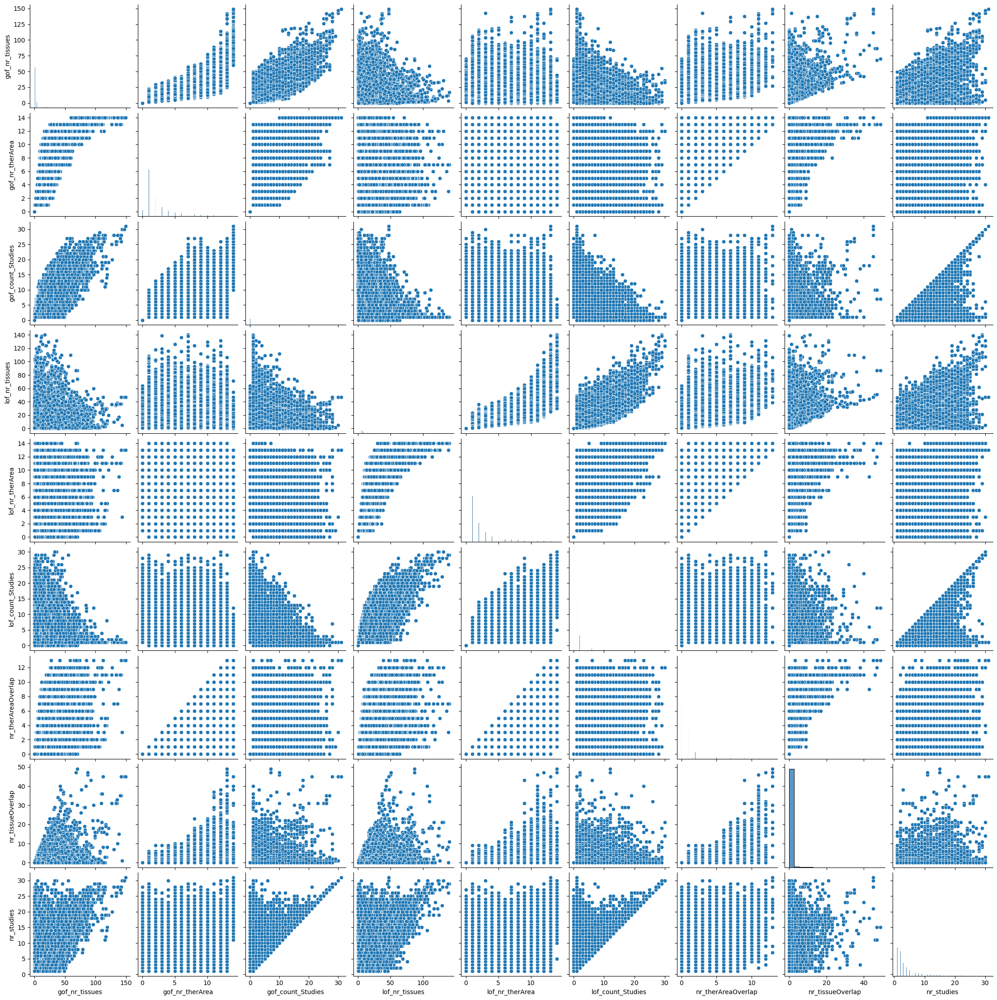

In [66]:
sns.pairplot(coloc_study.toPandas())

In [11]:
coloc_study.show()

+--------------------+----------------+---------------+--------------------+--------------------+--------------+---------------+-----------------+--------------------+--------------------+--------------+---------------+-----------------+--------------------+------------------+----------------+
|       left_locus_id|   left_study_id|  right_gene_id|         gof_tissues|        gof_therArea|gof_nr_tissues|gof_nr_therArea|gof_count_Studies|         lof_tissues|        lof_therArea|lof_nr_tissues|lof_nr_therArea|lof_count_Studies|     therAreaOverlap|nr_therAreaOverlap|nr_tissueOverlap|
+--------------------+----------------+---------------+--------------------+--------------------+--------------+---------------+-----------------+--------------------+--------------------+--------------+---------------+-----------------+--------------------+------------------+----------------+
|10_100543180_T_TT...|    GCST90000026|ENSG00000166135|      [MUSCLE_NAIVE]|[musculoskeletal ...|             1|   

In [26]:
coloc_study.groupBy("nr_therAreaOverlap").count().show()

+------------------+------+
|nr_therAreaOverlap| count|
+------------------+------+
|                12|    81|
|                 1| 71626|
|                 6|  2246|
|                 3|  7598|
|                 5|  3031|
|                 9|   738|
|                 4|  5228|
|                 8|  1148|
|                 7|  1700|
|                10|   453|
|                11|   314|
|                 2| 16867|
|                 0|148777|
|                13|    20|
+------------------+------+



In [31]:
coloc_study.groupBy("nr_tissueOverlap").count().show()

+----------------+------+
|nr_tissueOverlap| count|
+----------------+------+
|               1| 14452|
|               6|   357|
|               3|  1230|
|               5|   411|
|               9|   160|
|               4|   686|
|               8|   185|
|               7|   278|
|              10|   105|
|               2|  2587|
|               0|238771|
|              17|    40|
|              11|    78|
|              18|    39|
|              14|    50|
|              12|    84|
|              15|    49|
|              40|     2|
|              45|     7|
|              31|    17|
+----------------+------+
only showing top 20 rows



In [12]:
coloc3.select("right_study_id").distinct().count()

38

In [97]:
coloc3.select("right_bio_feature").distinct().toPandas().to_csv("tissues_coloc.csv")

In [68]:
print((243220 + 16607) / 666261)

0.389977801492208


In [38]:
coloc3 = coloc2.join(
    v2d_gwas.withColumnRenamed("study_id", "left_study_id"),
    on=["left_locus_id", "left_study_id"],
    how="left",
).persist()

In [39]:
coloc3.filter(F.col("is_flipped") == "true").show(truncate=False, vertical=True)

-RECORD 0---------------------------------------------
 left_locus_id             | 10_100152307_T_C         
 left_study_id             | GCST90025955             
 right_locus_id            | 10_100129660_T_C         
 right_study_id            | GTEx-sQTL                
 right_gene_id             | ENSG00000155287          
 coloc_h4                  | 0.9678297263356717       
 left_var_right_study_beta | -0.4308566451072693      
 left_type                 | gwas                     
 right_type                | sqtl                     
 right_bio_feature         | Brain_Cortex             
 is_flipped                | true                     
 beta                      | 0.0280807                
 odds_ratio                | null                     
 trait_reported            | Apolipoprotein A1 levels 
 trait_efos                | [EFO_0004614]            
 n_cases                   | null                     
 n_initial                 | 398508                   
-RECORD 1-

In [46]:
coloc3.groupBy("left_locus_id", "right_locus_id", "left_study_id").agg(
    F.countDistinct("right_gene_id").alias("count")
).sort(F.col("count").desc()).show()

23/09/14 10:43:09 WARN BlockManagerMasterEndpoint: No more replicas available for rdd_155_27 !
23/09/14 10:43:09 WARN BlockManagerMasterEndpoint: No more replicas available for rdd_155_7 !
23/09/14 10:43:09 WARN BlockManagerMasterEndpoint: No more replicas available for rdd_155_95 !
23/09/14 10:43:09 WARN BlockManagerMasterEndpoint: No more replicas available for rdd_155_121 !
23/09/14 10:43:09 WARN BlockManagerMasterEndpoint: No more replicas available for rdd_155_197 !
23/09/14 10:43:09 WARN BlockManagerMasterEndpoint: No more replicas available for rdd_155_91 !
23/09/14 10:43:09 WARN BlockManagerMasterEndpoint: No more replicas available for rdd_155_81 !
23/09/14 10:43:09 WARN BlockManagerMasterEndpoint: No more replicas available for rdd_155_160 !
23/09/14 10:43:09 WARN BlockManagerMasterEndpoint: No more replicas available for rdd_155_116 !
23/09/14 10:43:09 WARN BlockManagerMasterEndpoint: No more replicas available for rdd_155_54 !
23/09/14 10:43:09 WARN BlockManagerMasterEndpoi

KeyboardInterrupt: 

#### reproducing results

In [161]:
# 1. Read data
coloc = (
    spark.read.parquet("gs://genetics-portal-dev-data/22.09.1/outputs/v2d_coloc")
    .filter(f.col("right_type") != "gwas")
    .select(
        f.concat_ws("_", "left_chrom", "left_pos", "left_ref", "left_alt").alias(
            "left_locus_id"
        ),
        f.concat_ws("_", "right_chrom", "right_pos", "right_ref", "right_alt").alias(
            "right_locus_id"
        ),
        f.col("left_study").alias("left_study_id"),
        f.col("right_study").alias("right_study_id"),
        "right_gene_id",
        "coloc_h4",
        "left_var_right_study_beta",
    )
    # Get highest coloc result - aggregation to not take into account the tissue
    .withColumn(
        "rank",
        f.row_number().over(
            Window.partitionBy(
                "left_locus_id", "left_study_id", "right_gene_id"
            ).orderBy(f.abs(f.col("left_var_right_study_beta")).desc())
        ),
    )
    .filter(f.col("rank") == 1)
    .withColumnRenamed("coloc_h4", "max_coloc_h4")
    .persist()
)

evd = (
    spark.read.parquet(
        "gs://open-targets-data-releases/23.09/output/etl/parquet/evidence/sourceId=ot_genetics_portal"
    )
    .selectExpr(
        "studyId",
        "variantId as locusId",
        "targetId",
        "diseaseId",
        "oddsRatio",
        "beta",
        "score",
    )
    .withColumn(
        "effect",
        f.when((f.col("beta") > 0) | (f.col("oddsRatio") > 1), "risk")
        .when((f.col("beta") < 0) | (f.col("oddsRatio") < 1), "protective")
        .otherwise("unknown"),  # 23% of evidence has unknown direction of effect
    )
    .persist()
)

chembl = (
    prueba_assessment.filter(F.col("datasourceId") == "chembl")
    .groupBy("diseaseId", "targetId", "variation")
    .agg(F.max("clinicalPhase"))
    .withColumn("effect", f.lit("protective"))
    .persist()
)

23/09/28 15:08:39 WARN CacheManager: Asked to cache already cached data.
23/09/28 15:08:40 WARN CacheManager: Asked to cache already cached data.


In [210]:
# 2. By looking at the effect size of the left locus in the right study, what do the directions of effect say?

sqtl_other_qtl_correlation = (
    coloc.withColumn(
        "neg_sqtl",
        f.when(
            (
                (f.col("left_var_right_study_beta") < 0)
                & (f.col("right_study_id") == "GTEx-sQTL")
            ),
            1,
        ),
    )
    .withColumn(
        "pos_sqtl",
        f.when(
            (
                (f.col("left_var_right_study_beta") > 0)
                & (f.col("right_study_id") == "GTEx-sQTL")
            ),
            1,
        ),
    )
    .withColumn(
        "neg_oqtl",
        f.when(
            (
                (f.col("left_var_right_study_beta") < 0)
                & (f.col("right_study_id") != "GTEx-sQTL")
            ),
            1,
        ),
    )
    .withColumn(
        "pos_oqtl",
        f.when(
            (
                (f.col("left_var_right_study_beta") > 0)
                & (f.col("right_study_id") != "GTEx-sQTL")
            ),
            1,
        ),
    )
    .groupBy("left_locus_id", "right_study_id", "right_gene_id")
    .agg(
        f.sum(f.col("neg_sqtl")).cast("float").alias("n_neg_sqtl"),
        f.sum(f.col("pos_sqtl")).cast("float").alias("n_pos_sqtl"),
        f.sum(f.col("neg_oqtl")).cast("float").alias("n_neg_oqtl"),
        f.sum(f.col("pos_oqtl")).cast("float").alias("n_pos_oqtl"),
    )
    .persist()
)

In [211]:
sqtl_other_qtl_correlation.count()

533384

In [ ]:
sqtl_other_qtl_correlation

In [199]:
sqtl_other_qtl_correlation.show(2600)

+--------------------+--------------------+---------------+----------+----------+----------+----------+
|       left_locus_id|       left_study_id|  right_gene_id|n_neg_sqtl|n_pos_sqtl|n_neg_oqtl|n_pos_oqtl|
+--------------------+--------------------+---------------+----------+----------+----------+----------+
|    10_100152307_T_C|        GCST90012109|ENSG00000095485|      null|      null|      null|       1.0|
|    10_100152307_T_C|        GCST90025957|ENSG00000107566|      null|      null|      null|       1.0|
|    10_100315722_G_A|        GCST90025948|ENSG00000095539|       1.0|      null|      null|      null|
|    10_100315722_G_A|    NEALE2_23110_raw|ENSG00000075826|      null|      null|       1.0|      null|
|    10_100343751_A_G|        GCST90002346|ENSG00000107554|      null|      null|       1.0|      null|
|    10_100343751_A_G|        GCST90002395|ENSG00000099194|      null|      null|       1.0|      null|
|    10_100343751_A_G|         NEALE2_1717|ENSG00000166136|     

In [203]:
sqtl_oqtl_direction_discordance = sqtl_other_qtl_correlation.filter(
    (F.col("n_neg_sqtl").isNotNull() | F.col("n_neg_oqtl").isNotNull())
    & (F.col("n_pos_sqtl").isNotNull() & F.col("n_pos_oqtl").isNotNull())
)

In [193]:
sqtl_oqtl_direction_discordance = sqtl_other_qtl_correlation.filter(
    ((F.col("n_neg_sqtl").isNotNull()) & (F.col("n_pos_oqtl").isNotNull()))
    | ((F.col("n_pos_sqtl").isNotNull()) & (F.col("n_neg_oqtl").isNotNull()))
)

In [206]:
sqtl_oqtl_direction_discordance.count()

#### 196 contradicciones cuando quito el study

sqtl_other_qtl_correlation.count()

517763